# Clase 22: Selección de Características, Reducción de Dimensionalidad y Ajuste de Hiperparámetros

**MDS7202: Laboratorio de Programación Científica para Ciencia de Datos**

**Profesor: Ignacio Meza**

## Objetivos de esta clase

- Comprender la importancia de seleccionar características y reducir dimensionalidad.
- Seleccionar Características relevantes.
- Reducción de dimensionalidad.
- Integrar estas técnicas con `Pipeline`
- Buscar la mejor configuración de hiperparámetros con `GridSearch`

## Importamos Librerías

In [3]:
import numpy as np
import pandas as pd
import plotly.express as px
from sklearn.compose import ColumnTransformer
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, StandardScaler

df = pd.read_csv("/Users/imezadelajara/Repositories/MDS7202/recursos/2023-01/22_hiper/descriptores_musica.csv")
df = df.astype({"time_signature": str, "key": str, "mode": str})

---

## Problema de Hoy: 🎸🤘 Caracterización Musical 🎼🎵 

<center>
<img src='https://media.tenor.com/2HL1y7peaysAAAAM/2pac-hit-em-up.gif' width=250 />

Los atributos son: 

- `key`: escala de la canción. 0 = C, 1 = C♯/D♭, 2 = D...  [Mas información](https://en.wikipedia.org/wiki/Pitch_class).
- `modo`: 1 si la escala es mayor, 0 si es menor.
- `time_signature`: cuántos pulsos hay en cada compás. (4, 3,...).
- `loudness`: Volumen de la canción (rango -60, 0).


- `acousticness`: Probabilidad de que la canción sea solo acústica. Valores cercanos a 1 indican que la canción es probablemente acústica.
- `danceability`: Describe que tan bailable es la canción. Valores cercanos a 1 indican que la canción es muy bailable.
- `energy`: Mide que tan energética es una canción. Mide cosas como la rapidez, el volumen y el ruido. Valores cercanos a 1 indican que la canción es muy enégrica.
- `instrumentalness`: Probabilidad que la canción contenga voces. 1 es muy probable que contenga voz.
- `liveness`: Probabilidad de que la canción fuese grabada en vivo. 1 es muy probable que la canción haya sido grabada en vivo.
- `speechiness`: Probabilidad de que la canción contenga palabras habladas (ejemplo: podcast : 1). 
- `valence`: Sentimiento de la canción (rango 0, 1). 1 -> felicidad, alegria, euforia. 0 -> Tristeza, enojo, depresión.
- `tempo` : Pulsos por minuto de la canción (BPM). 


La variable a predecir es: 

- `genre`: Género de la canción.


**Pregunta**: A simple vista,

- ¿Hay carácterísticas que podrían estas repetidas? (**Irrelevante**)
- ¿hay características que nos dicen mas o menos lo mismo? (**Redundante**)


### Análisis Exploratorio de Datos

In [8]:
import pandas as pd
import plotly.express as px

df.head(5)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,id,duration_ms,time_signature,name,artist,genre
0,0.617,0.771,10,-5.586,0,0.1120,0.0384,0.000003,0.1620,0.553,180.002,3nCFiwtuVqVJmnSasApvr3,267747,4,Salgo Pa' la Calle,Daddy Yankee,Reggaeton
1,0.788,0.674,2,-8.392,1,0.0537,0.2810,0.033000,0.0892,0.864,94.997,5I0u5YHYvA6fQZstVCFwqC,214747,4,Dile A Tu Amiga,Ñejo,Reggaeton
2,0.745,0.744,5,-8.230,1,0.0837,0.0266,0.000018,0.0959,0.849,96.026,1FTTvjvgX2Qd9ZJqo36m1C,244663,4,Nada Va Pasar,Yaga Y Mackie,Reggaeton
3,0.782,0.767,9,-7.981,0,0.0871,0.2660,0.000036,0.0947,0.622,88.005,6DxS2ZRl8G3EagHkovYXA2,304091,4,Zun Da Da,Zion,Reggaeton
4,0.702,0.864,1,-5.496,1,0.0818,0.1080,0.000000,0.1870,0.788,94.994,4mM90OUhSN79RRKT0qv4dY,215118,4,Fuera del Planeta,Randy,Reggaeton


In [9]:
df.describe()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,814.000000,814.000000,814.000000,814.000000,814.000000,814.000000,814.000000,814.000000,814.000000,8.140000e+02
mean,0.600392,0.589244,-10.017713,0.090809,0.324999,0.159151,0.181294,0.532020,113.486484,2.838903e+05
std,0.196368,0.268840,6.429775,0.095219,0.342813,0.304559,0.151797,0.268382,26.527836,1.284673e+05
min,0.062300,0.002100,-42.238000,0.023200,0.000017,0.000000,0.031100,0.030800,59.406000,8.426700e+04
25%,0.479250,0.417500,-11.555500,0.036500,0.033450,0.000000,0.090675,0.324000,94.013500,2.112300e+05
50%,0.641500,0.663500,-7.997500,0.047550,0.180000,0.000405,0.122000,0.569000,110.033500,2.512800e+05
75%,0.753000,0.799000,-5.854750,0.098000,0.575250,0.095600,0.226750,0.754000,126.928250,3.087402e+05
max,0.976000,0.989000,-1.446000,0.817000,0.996000,0.958000,0.987000,0.981000,213.990000,1.252322e+06


In [10]:
def get_ejemplo(idx):
    """
    Obtiene un ejemplo y lo formatea como columna.
    """
    ejemplo = (
        df.loc[
            idx,
            [
                "danceability",
                "energy",
                "speechiness",
                "acousticness",
                "instrumentalness",
                "valence",
                "name",
                "artist",
                "genre",
            ],
        ]
        .to_frame()
        .reset_index()
    )
    ejemplo.columns = ["Descriptor", "Valor"]
    return ejemplo

In [11]:
# pueden cambiar el índice de alguno de estos ejemplos para
# mostrar otra canción en la visualización
ejemplo1 = get_ejemplo(102)
ejemplo2 = get_ejemplo(385)
ejemplo3 = get_ejemplo(15)
ejemplo4 = get_ejemplo(484)

ejemplos = [ejemplo1, ejemplo2, ejemplo3, ejemplo4]

#### Spider/Radar Chart

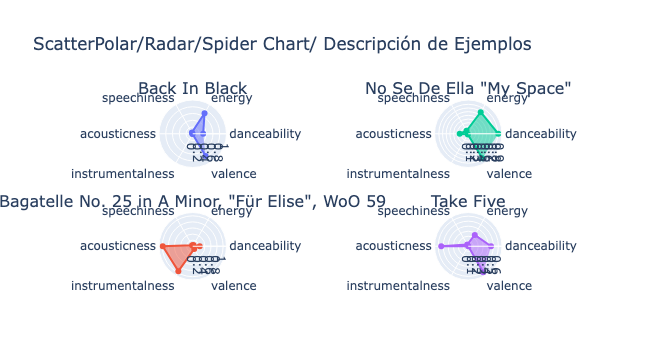

In [12]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(
    rows=2,
    cols=2,
    specs=[
        [{"type": "polar"}, {"type": "polar"}],
        [{"type": "polar"}, {"type": "polar"}],
    ],
    subplot_titles=[
        ejemplo1.loc[6, "Valor"],
        ejemplo3.loc[6, "Valor"],
        ejemplo2.loc[6, "Valor"],
        ejemplo4.loc[6, "Valor"],
    ],
)

for i, ejemplo in enumerate(ejemplos):
    fig.add_trace(
        go.Scatterpolar(
            r=ejemplo.loc[0:5, "Valor"],
            theta=ejemplo.loc[0:5, "Descriptor"],
            fill="toself",
            name=f"{ejemplo.loc[6, 'Valor']} - {ejemplo.loc[7, 'Valor']} ({ejemplo.loc[8, 'Valor']})",
        ),
        col=i // 2 + 1,
        row=i % 2 + 1,
    )

fig.update_layout(
    polar=dict(radialaxis=dict(visible=True, range=[0, 1])),
    showlegend=False,
    title="ScatterPolar/Radar/Spider Chart/ Descripción de Ejemplos",
    height=700,
)

fig.show()

#### Histogramas

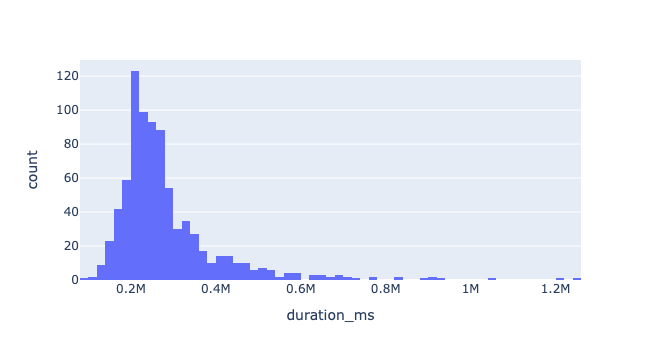

In [13]:
px.histogram(df, x="duration_ms")

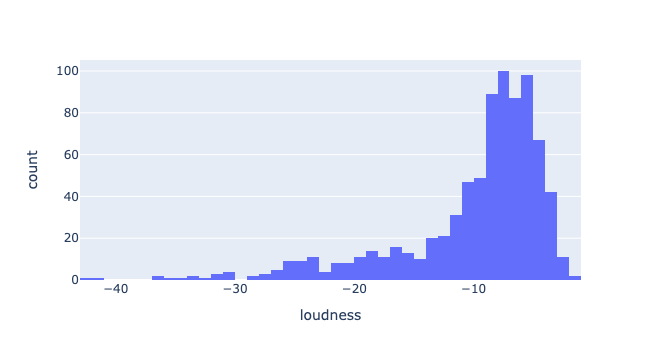

In [14]:
px.histogram(df, x="loudness")

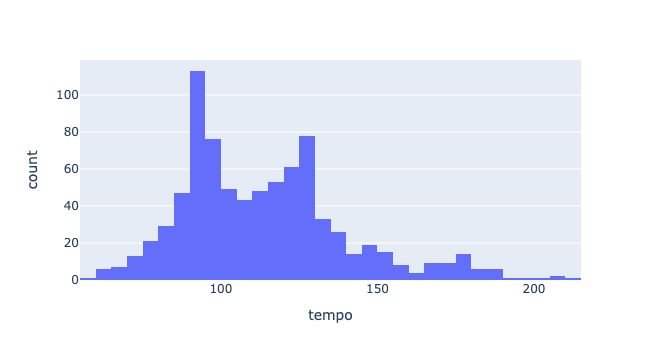

In [15]:
px.histogram(df, x="tempo")

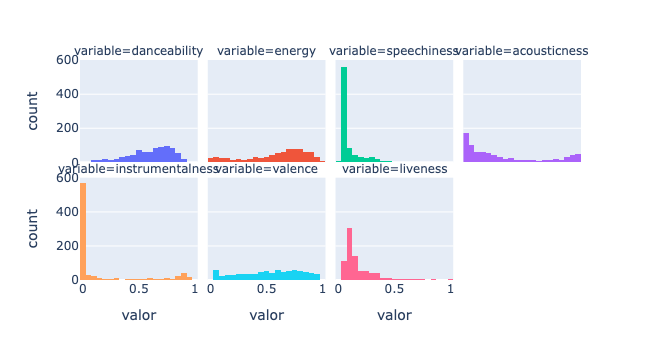

In [16]:
dt_to_hists = df.loc[
    :,
    [
        "danceability",
        "energy",
        "speechiness",
        "acousticness",
        "instrumentalness",
        "valence",
        "liveness",
        "genre",
    ],
].melt(id_vars=["genre"], var_name="variable", value_name="valor")

px.histogram(
    dt_to_hists, x="valor", color="variable", facet_col="variable", facet_col_wrap=4
).update_layout(showlegend=False)

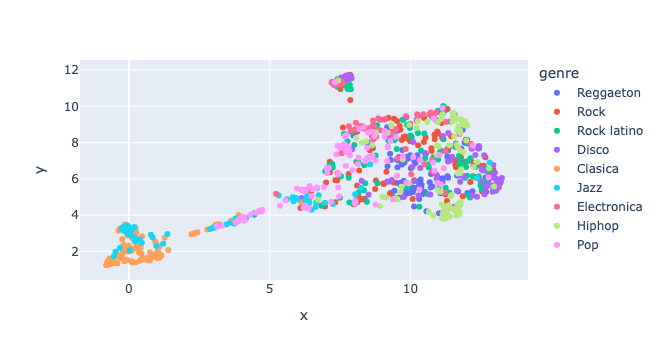

In [17]:
from sklearn.preprocessing import MinMaxScaler, Normalizer
from umap import UMAP

projection_pipe = Pipeline(
    [
        (
            "Column Transformer",
            ColumnTransformer(
                [("MinMax", MinMaxScaler(), ["duration_ms", "loudness"])],
                remainder="passthrough",
            ),
        ),
        ("Normalize", Normalizer()),
        ("UMAP", UMAP(random_state=88, n_neighbors=20, min_dist=0.15)),
    ]
)


projections = projection_pipe.fit_transform(
    df.loc[
        :,
        [
            "danceability",
            "energy",
            "speechiness",
            "acousticness",
            "instrumentalness",
            "valence",
            "liveness",
            "duration_ms",
            "loudness",
        ],
    ]
)
df_proj = pd.DataFrame(projections, columns=["x", "y"])


df_fig = df.copy()
df_fig = pd.concat([df_fig, df_proj], axis=1)
df_fig["hover_name"] = df_fig["artist"] + " - " + df_fig["name"]

fig = px.scatter(
    df_fig,
    x="x",
    y="y",
    color="genre",
    hover_name="hover_name",
    hover_data=[
        "danceability",
        "energy",
        "speechiness",
        "acousticness",
        "instrumentalness",
        "valence",
    ],
)
fig.show()

## Motivación 

### Detalle Interesante 1: Correlación entre las variables.


$$corr (X, Y) = \frac{1}{(s_{x} s_{y})} \sum_{i=1}^{m} (x_i - \overline{x})(y_i - \overline{y}) $$


Los valores varian entre -1 y 1

- Positivo: Relación directa: Crece una, crece la otra. Mientras mayor, mas similares son las variables.
- Negativo: Relación inversa: Crece una, decrece la otra.


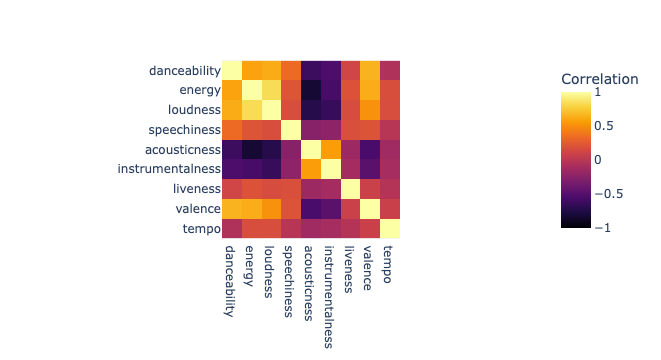

In [18]:
correlations_df = df[
    [
        "danceability",
        "energy",
        "loudness",
        "speechiness",
        "acousticness",
        "instrumentalness",
        "liveness",
        "valence",
        "tempo",
    ]
]
correlations = correlations_df.corr()


px.imshow(
    correlations,
    labels=dict(x="", y="", color="Correlation"),
    x=correlations_df.columns,
    y=correlations_df.columns,
    zmin=-1,
    zmax=1,
    color_continuous_scale="Inferno",
)

> 💡 Notar lo siguiente

<center>
<img src='https://pbs.twimg.com/media/F9wyS-SXcAAWjTt?format=jpg&name=4096x4096' width=350 />

### Detalle Interesante 2: Correlación entre las variables de Entrada y la variable por Predecir 

In [19]:
labels = df.loc[:, ["genre"]]
labels

,genre
0,Reggaeton
1,Reggaeton
2,Reggaeton
3,Reggaeton
4,Reggaeton
...,...
809,Pop
810,Pop
811,Pop
812,Pop


In [20]:
encoder = OneHotEncoder(sparse=False)
encoded_labels = encoder.fit_transform(labels)

encoded_labels_df = pd.DataFrame(encoded_labels, columns=encoder.get_feature_names_out())
encoded_labels_df

/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



,genre_Clasica,genre_Disco,genre_Electronica,genre_Hiphop,genre_Jazz,genre_Pop,genre_Reggaeton,genre_Rock,genre_Rock latino
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
809,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
810,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
811,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
812,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


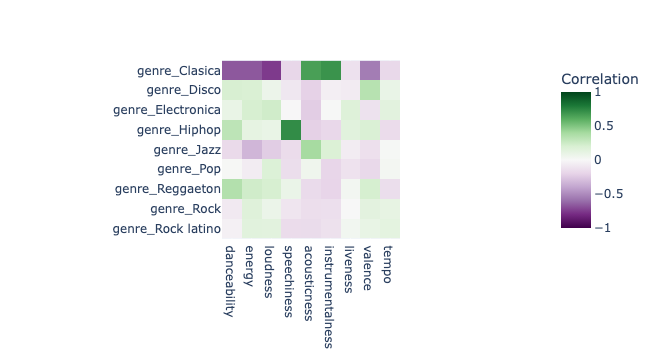

In [22]:
# juntamos correlations_df con encoded_labels_df

correlations_labels_df = pd.concat([correlations_df, encoded_labels_df], axis=1)

correlations_labels = correlations_labels_df.corr("pearson").iloc[9:, 0:9]

px.imshow(
    correlations_labels,
    labels=dict(x="", y="", color="Correlation"),
    x=correlations_labels.columns,
    y=correlations_labels.index,
    zmin=-1,
    zmax=1,
    color_continuous_scale="PRgn",
)

### Detalle Interesante 3: ¿Usamos Artista?

In [23]:
df["artist"].value_counts()

Daddy Yankee               6
Johann Sebastian Bach      6
John Coltrane              6
Miles Davis                5
The Rolling Stones         5
                          ..
Tantra                     1
Machine                    1
Grandmaster Flash          1
Evelyn "Champagne" King    1
Rachel Platten             1
Name: artist, Length: 506, dtype: int64

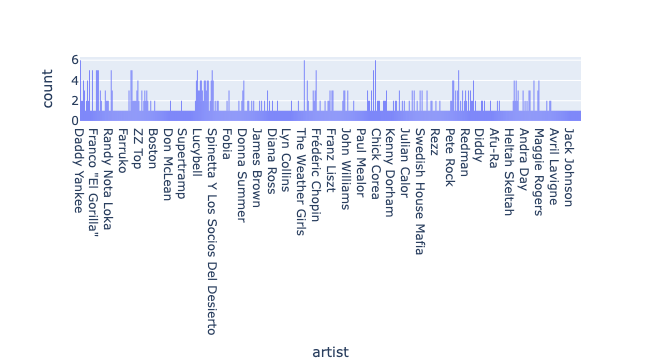

In [24]:
px.histogram(
    df,
    "artist",
)

In [40]:
artista_ohe = OneHotEncoder(sparse=False)
artista_encoded = artista_ohe.fit_transform(df[["artist"]])
artista_cols = artista_ohe.get_feature_names_out()


artista_df = pd.DataFrame(artista_encoded, columns=artista_cols)
artista_df

/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



,artist_2Pac,artist_A Taste Of Honey,artist_A Tribe Called Quest,artist_AC/DC,artist_AWOLNATION,artist_Aaron Copland,artist_Adele,artist_Aerosmith,artist_Afu-Ra,artist_Alec Benjamin,...,artist_ZZ Top,artist_Zedd,artist_Zion,artist_Zion & Lennox,artist_Zoé,artist_Zurdok,artist_deadmau5,artist_lovelytheband,artist_Ñejo,artist_Ñejo & Dalmata
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
809,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
810,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
811,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
812,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [26]:
artista_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 814 entries, 0 to 813
Columns: 506 entries, artist_2Pac to artist_Ñejo & Dalmata
dtypes: float64(506)
memory usage: 3.1 MB


**Esta transformación produce 519 dimensiones. Una locura...**

> **Pregunta:** ¿La cantidad de dimensiones influirá en la calidad de clasificación que logremos?

Imagínense ahora las correlaciones de cada una de estas viariables con respecto a la variable de salida.

### Maldición de la Dimensionalidad

La maldición de la dimensionalidad es el problema que consiste en que a medida que aumentan las dimensiones, los datos tienden a hacerse cada vez más *sparse*/escasos sobre las dimensiones en las cuales están representados. Una simple analogía para entender esto es que:

> *A medida que aumenta la cantidad de features, aumenta el volumen en donde se encuentran los datos, haciendo que estos se separen bastante entre ellos. *



<div align='center'>
    <img src='https://github.com/MDS7202/MDS7202/blob/main/recursos/2023-01/22_hiper/curse.png?raw=true' width=600/>
</div>

<div align='center'>
    Fuente: <a href='https://www.researchgate.net/figure/The-effect-of-the-curse-of-dimensionality-when-projected-in-1-one-dimension-2-two_fig3_342638066'> A comprehensive survey of anomaly detection techniques for high dimensional big data en Research Gate.</a>
</div>


Esto implica que, para poder seguir distinguiendo correctamente los datos, se debe aumentar masivamente su cantidad a medida que se aumentan las dimensiones.

**¿En qué nos afecta esto?**

Induce comunmente a una reducción del rendimiento de los clasificadores/regresores.


Más en Wikipedia: [Curse of dimensionality](https://en.wikipedia.org/wiki/Curse_of_dimensionality).

## Mejorando la Clasificación

<center>
<img src='https://i.pinimg.com/originals/ab/e1/72/abe17294582423e00db65c85aba185d8.gif' width=350 />

Entonces, hasta acá tenemos 3 problemas: 

1. Hay características que "aportan" más o menos la misma información.
2. Hay características que podrían no aportar información para poder clasificar correctamente.
3. Tenemos una gran cantidad de dimensiones, lo cual podría entorpecer la clasificación.


Por ende, sería ideal eliminar un par de dimensiones con el fin de mejorar la clasificación. 


Para comparar las mejoras, utilizaremos un **Baseline**, el cual no es más que es un modelo inicial al cual , a medida que vayamos generando mejores modelos, nos iremos comparando (para ver si mejoramos y cuanto). Durante toda esta clase, nuestro **baseline** (modelo que compararemos) será **Tree** entrenado con todas las features.


In [25]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.tree import DecisionTreeClassifier

preprocessing = ColumnTransformer(
    [
        (
            "Scale",
            MinMaxScaler(),
            [
                "duration_ms",
                "tempo",
                "loudness",
                "time_signature",
            ],
        ),
        (
            "One Hot Encoding",
            OneHotEncoder(sparse_output=False, handle_unknown="ignore"),
            [
                "key",
                "mode",
                "artist",
                "time_signature",
            ],
        ),
    ],
    remainder="passthrough",
)

# Creamos nuestro baseline pipeline
baseline_pipe = Pipeline(
    steps=[
        ("Preprocessing", preprocessing),
        ("Tree", DecisionTreeClassifier(random_state=42)),
    ]
)

Aplicamos **holdout** al dataset

In [105]:
from sklearn.model_selection import train_test_split

labels = df.loc[:, "genre"]
features = df.drop(columns=["genre", "id", "name"])

X_train, X_test, y_train, y_test = train_test_split(
    features,
    labels,
    test_size=0.2,
    random_state=42,
    shuffle=True,
    stratify=labels,
)

Ahora, definimos el ciclo de Entrenamiento y Evaluación.
La métrica con la cuál evaluaremos el desempeño del clasificador será `f1_score`.

Para esto, definiremos la función `train_and_evaluate` que dado un pipeline y conjuntos de entrenamiento y prueba, entrena un clasificador y retorna su evaluación:



In [122]:
from sklearn.metrics import f1_score


def train_and_evaluate(
    pipe, print_=True, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test
):

    # notar que los datasets son parámetros por defecto.

    pipe.fit(X_train, y_train)
    y_pred = pipe.predict(X_test)

    if print_:
        print("Matriz de confusión: \n")
        print(confusion_matrix(y_test, y_pred, labels=pipe.classes_))
        print("\nReporte de Clasificación: \n")
        print(
            classification_report(y_test, y_pred, target_names=pipe.classes_),
        )

    return f1_score(y_test, y_pred, average="macro")


train_and_evaluate(baseline_pipe)

Matriz de confusión: 

[[17  0  0  0  2  0  0  0  1]
 [ 0 10  0  1  0  1  1  1  3]
 [ 0  4  4  3  0  0  1  0  0]
 [ 0  0  0 17  0  1  1  0  1]
 [ 4  0  0  0  6  1  0  2  1]
 [ 0  1  2  1  1 11  0  3  1]
 [ 0  0  0  6  0  2 11  0  1]
 [ 0  4  1  0  0  1  2 12  0]
 [ 0  7  2  0  1  2  1  4  3]]

Reporte de Clasificación: 

              precision    recall  f1-score   support

     Clasica       0.81      0.85      0.83        20
       Disco       0.38      0.59      0.47        17
 Electronica       0.44      0.33      0.38        12
      Hiphop       0.61      0.85      0.71        20
        Jazz       0.60      0.43      0.50        14
         Pop       0.58      0.55      0.56        20
   Reggaeton       0.65      0.55      0.59        20
        Rock       0.55      0.60      0.57        20
 Rock latino       0.27      0.15      0.19        20

    accuracy                           0.56       163
   macro avg       0.54      0.54      0.53       163
weighted avg       0.55    

0.5341493781401013

> **Pregunta:❓** ¿Cómo sé que mi modelo es mejor que uno que clasifica al azar?


### Modelos Dummy

<center>
<img src='https://i0.wp.com/media1.giphy.com/media/YWzqX7pyn1oUE/giphy.gif' width=250 />

El [DummyClassifier](https://scikit-learn.org/stable/modules/generated/sklearn.dummy.DummyClassifier.html#sklearn.dummy.DummyClassifier) es un clasificador que ignora todas las features de entrada y genera salidas aleatorias como respuesta a las predicciones.

Permite saber si los modelos que estamos implementando son mejores que clasificar al azar. Por lo general, es una de las primeros chequeos que hacemos ya que permite anticipadamente saber si estamos generando modelos que aprenden o no.

Para la regresión, existe [DummyRegressor](https://scikit-learn.org/stable/modules/generated/sklearn.dummy.DummyRegressor.html#sklearn.dummy.DummyRegressor).

In [123]:
from sklearn.dummy import DummyClassifier

dummy_pipe = Pipeline(
    steps=[
        ("Preprocessing", preprocessing),
        ("Tree", DummyClassifier(strategy="stratified")),
    ]
)

train_and_evaluate(dummy_pipe)

Matriz de confusión: 

[[2 1 1 4 1 2 3 1 5]
 [3 1 2 2 0 1 3 2 3]
 [1 2 1 2 1 1 1 1 2]
 [5 1 2 0 1 2 4 3 2]
 [0 4 0 2 1 3 3 1 0]
 [3 2 2 2 4 2 1 2 2]
 [2 2 4 3 2 4 1 1 1]
 [6 3 2 0 1 1 1 4 2]
 [2 2 0 4 4 2 2 1 3]]

Reporte de Clasificación: 

              precision    recall  f1-score   support

     Clasica       0.08      0.10      0.09        20
       Disco       0.06      0.06      0.06        17
 Electronica       0.07      0.08      0.08        12
      Hiphop       0.00      0.00      0.00        20
        Jazz       0.07      0.07      0.07        14
         Pop       0.11      0.10      0.11        20
   Reggaeton       0.05      0.05      0.05        20
        Rock       0.25      0.20      0.22        20
 Rock latino       0.15      0.15      0.15        20

    accuracy                           0.09       163
   macro avg       0.09      0.09      0.09       163
weighted avg       0.10      0.09      0.09       163



0.0914119970683794

## Selección de Features

<center>
<img src='https://media.tenor.com/YhfKx7iugisAAAAM/streets-of-rage-player-select.gif' width=300 />

Entonces, recordando los 3 problemas que habíamos mencionado previamente: 

1. Hay características que "aportan" más o menos la misma información.
2. Hay características que podrían no aportar información para poder clasificar correctamente.
3. Tenemos una gran cantidad de dimensiones, lo cual podría entorpecer la clasificación.

Los **métodos de filtrado** son algoritmos de selección que eligen o eliminan características basándose únicamente en sus propiedades estadísticas, sin involucrar algoritmos de machine learning complejos. La eliminación de características constantes es un claro ejemplo de estos métodos de filtrado, ya que se fundamenta en la ausencia de variabilidad de dichas características.

Al incorporar estos pasos tempranos en el flujo de trabajo de ciencia de datos, no solo se mejora la eficiencia del proceso, sino que también se sientan las bases para construir modelos de machine learning más robustos y precisos.

### Drop Features por relevancia de la variable

<center>
<img src='https://media.tenor.com/4ZigJATvs64AAAAM/whoa-how-very-very-relevant-eric-cartman.gif' width=250 />

#### ¿Por Qué Eliminar Features Constantes?

Las features con poca o ninguna variabilidad aportan escasa o nula información útil al modelo. Su eliminación desde el inicio del proyecto ayuda a simplificar el conjunto de datos.

Para eliminar variables constantes se utiliza `DropConstantFeatures`. La principal característica de esta función es que permite eliminar características especificando una tolerancia, es decir, el número mínimo de observaciones distintas que una característica debe tener. En el ejemplo a continuación, se establece que las características pueden tener hasta un 65% de datos nulos; de lo contrario, deben ser eliminadas.

Es importante notar que el nivel de tolerancia dependerá del problema a resolver, ya que en algunos casos, una baja cardinalidad en una variable podría ser un reflejo de un efecto outlier que se desea capturar.

In [10]:
from feature_engine.selection import DropConstantFeatures

transformer = DropConstantFeatures(tol=0.65)

Luego, para eliminar las features y siguiendo la misma lógica de sk-learn aplicamos el método `fit_transform`:

In [14]:
# notar que en un comienzo tenemos 14 columnas
X_train.shape

(651, 14)

In [15]:
transformer.fit_transform(X_train).shape

(651, 13)

Para identificar la feature eliminada puede revisar el atributo `features_to_drop_` del transformador, obteniendo:

In [17]:
transformer.features_to_drop_

['time_signature']

Por otro lado, si deseamos integrar esto dentro de un pipeline de Scikit-learn, ¡no hay problema! La librería es completamente compatible con este enfoque.

In [29]:
# Creamos nuestro baseline pipeline
selection_pipeline = Pipeline(
    steps=[
        ("Preprocessing", preprocessing),
        # Conservamos el 65% mejor según la métrica seleccionada
        ("dropconstant", DropConstantFeatures(tol=0.65)),
        ("Tree", DecisionTreeClassifier(random_state=42)),
    ]
)

train_and_evaluate(selection_pipeline)

Matriz de confusión: 

[[17  0  0  0  3  0  0  0  0]
 [ 0  7  1  2  0  1  2  1  3]
 [ 0  1  5  2  1  0  0  2  1]
 [ 0  0  1 16  0  1  1  1  0]
 [ 2  2  0  0  7  1  0  2  0]
 [ 0  0  2  0  0 13  0  1  4]
 [ 0  0  0  5  0  2 11  1  1]
 [ 0  2  1  1  0  2  1  8  5]
 [ 0  5  2  1  1  3  0  5  3]]

Reporte de Clasificación: 

              precision    recall  f1-score   support

     Clasica       0.89      0.85      0.87        20
       Disco       0.41      0.41      0.41        17
 Electronica       0.42      0.42      0.42        12
      Hiphop       0.59      0.80      0.68        20
        Jazz       0.58      0.50      0.54        14
         Pop       0.57      0.65      0.60        20
   Reggaeton       0.73      0.55      0.63        20
        Rock       0.38      0.40      0.39        20
 Rock latino       0.18      0.15      0.16        20

    accuracy                           0.53       163
   macro avg       0.53      0.53      0.52       163
weighted avg       0.53    

0.5227963891776145

### Selección Inteligente de Features por Correlación

<center>
<img src='https://i.pinimg.com/originals/29/df/95/29df95e8a6c68acba92eabb8adf927c4.gif' width=300 />

Al trabajar con conjuntos de datos que contienen numerosas features, es común que más de dos features muestren correlaciones entre sí. Esta correlación puede manifestarse entre tres, cuatro o incluso más características dentro del conjunto de datos. En consecuencia, determinar qué características conservar y cuáles eliminar se convierte en una consideración crucial y realizar una mala selección podría significar perdida en puntos de predictibilidad.

Decidir qué feautre retener de un grupo correlacionado implica varias estrategias, como:

1. **Rendimiento del Modelo**: Algunas features generan modelos con un rendimiento superior en comparación con otras.
2. **Variabilidad y Cardinalidad**: Las features con mayor variabilidad o cardinalidad suelen proporcionar más información sobre la variable objetivo.
3. **Datos Faltantes**: Las features con menos datos faltantes suelen ser más confiables e informativas.

Podemos aplicar estas estrategias de selección de manera automática utilizando la función **SmartCorrelatedSelection**. La función retiene la variable dentro de un grupo de variables correlacionadas que cumpla con los siguientes criterios:

- **Mayor Varianza**: La feature con la mayor diversidad de valores.
- **Mayor Cardinalidad**: La feature con más valores únicos.
- **Menor Cantidad de Datos Faltantes**: La feature más completa y confiable.
- **Mejor Rendimiento del Modelo**: La feature que produce el modelo de mejor rendimiento.

Las features restantes dentro de cada grupo correlacionado serán eliminadas.

Para utilizar esta función, se debe importar `SmartCorrelatedSelection` del módulo de selección de características. Luego, se deben proporcionar los parámetros deseados para la selección:

In [35]:
from feature_engine.selection import SmartCorrelatedSelection

tr = SmartCorrelatedSelection(
    variables=None,
    method="pearson",
    threshold=0.8,
    missing_values="raise",
    selection_method="variance",
    estimator=None,
)

In [37]:
tr.fit_transform(X_train).shape

(651, 13)

Luego, para ver que variables estan relacionadas aplicamos:

In [38]:
tr.correlated_feature_sets_

[{'energy', 'loudness'}]

Para revisar que feature será retenida y cual será eliminada se realiza lo siguiente:

In [39]:
tr.correlated_feature_dict_

{'loudness': {'energy'}}

¿Por qué fue seleccionada `loudness` y no `energy`?

In [40]:
X_train[list(tr.correlated_feature_sets_[0])].std()

energy      0.266659
loudness    6.388316
dtype: float64

Finalmente, si deseamos utilizar esta función dentro de un pipeline, tenemos:

In [32]:
selection_pipeline = Pipeline(
    steps=[
        ("Preprocessing", preprocessing),
        ('correlation_selection', SmartCorrelatedSelection(
        method="pearson",
        threshold=0.8,
        selection_method="variance",
        )),
        ("Tree", DecisionTreeClassifier(random_state=42))
])

# Ajustar el pipeline a los datos
train_and_evaluate(selection_pipeline)

Matriz de confusión: 

[[17  0  0  0  3  0  0  0  0]
 [ 0  8  3  1  0  1  1  1  2]
 [ 0  1  5  3  0  1  0  1  1]
 [ 0  0  0 17  0  1  2  0  0]
 [ 4  0  0  0  6  1  0  3  0]
 [ 0  0  2  0  1 13  1  2  1]
 [ 0  0  0  4  0  1 12  2  1]
 [ 0  3  1  0  0  1  3  8  4]
 [ 0  3  4  0  1  4  0  4  4]]

Reporte de Clasificación: 

              precision    recall  f1-score   support

     Clasica       0.81      0.85      0.83        20
       Disco       0.53      0.47      0.50        17
 Electronica       0.33      0.42      0.37        12
      Hiphop       0.68      0.85      0.76        20
        Jazz       0.55      0.43      0.48        14
         Pop       0.57      0.65      0.60        20
   Reggaeton       0.63      0.60      0.62        20
        Rock       0.38      0.40      0.39        20
 Rock latino       0.31      0.20      0.24        20

    accuracy                           0.55       163
   macro avg       0.53      0.54      0.53       163
weighted avg       0.54    

0.5319886824052702

### Alto PSI/CSI

<center>
<img src='https://media3.giphy.com/media/xT9DPQ8xQK6D1mmxSo/giphy.gif?cid=6c09b952odbc8etbt0dic0u6ozl9mtlxplmqk3mrhtajj5ts&ep=v1_gifs_search&rid=giphy.gif&ct=g' width=350 />

Este selector busca y elimina todas las features con grandes cambios en su distribución, es decir, "valores inestables". La estabilidad de la distribución se calcula utilizando el Índice de Estabilidad Poblacional (PSI ó CSI), y se eliminan todas las features que tengan un valor de PSI por encima de un umbral establecido.

#### PSI/CSI

El **Índice de Estabilidad Poblacional (PSI)** y el **Índice de Estabilidad de Características (CSI)** son métricas utilizadas para medir cambios en la distribución de datos a lo largo del tiempo. Estas métricas son especialmente útiles en machine learning y análisis de datos para monitorear la estabilidad y consistencia de las características utilizadas en los modelos predictivos.

##### Cálculo del PSI

El cálculo del PSI sigue estos pasos:

1. **División de los Datos en Intervalos**:
   - Divida tanto la distribución de referencia (baseline) como la distribución actual en los mismos intervalos (bins).

2. **Cálculo de las Proporciones**:
   - Calcule la proporción de observaciones en cada intervalo para ambas distribuciones.

3. **Cálculo del PSI para Cada Intervalo**:
   - Para cada intervalo, calcule el PSI utilizando la fórmula:
     
     $$PSI = (P_{ref} - P_{curr}) \times \ln\left(\frac{P_{ref}}{P_{curr}}\right)$$
     donde $P_{ref}$ es la proporción en el intervalo de la distribución de referencia y $P_{curr}$ es la proporción en el intervalo de la distribución actual.

4. **Sumatoria del PSI Total**:
   - Sume los valores del PSI de todos los intervalos para obtener el PSI total.

##### Interpretación del PSI

- **PSI < 0.1**: La distribución es estable.
- **0.1 ≤ PSI < 0.25**: Hay un cambio moderado en la distribución.
- **PSI ≥ 0.25**: Hay un cambio significativo en la distribución.

Notar que existen alternativas donde el threshold se escoge con la siguiente ecuación:

$$threshold = \chi^2_{(q, B-1)}*(\frac{1}{N} + \frac{1}{M})$$

donde q es el percentil, B es el número de bins, N es el tamaño del conjunto de datos base, N es el tamaño del conjunto de datos de prueba.

#####  Aplicaciones del PSI y CSI en Machine Learning

- **Monitoreo de Modelos**: Asegurar que las características utilizadas en los modelos de machine learning no sufran cambios drásticos que puedan afectar el desempeño del modelo.
- **Detección de Deriva de Datos**: Identificar cuándo un modelo puede estar basado en datos que ya no representan la realidad actual, indicando la necesidad de retrain o ajuste.
- **Calidad de Datos**: Asegurar que los datos utilizados para el entrenamiento y la predicción sean consistentes y representativos del mismo proceso subyacente.

Ejemplo practico:

In [65]:
import numpy as np

def calculate_psi(expected, actual, buckets=10):
    expected_percents = np.histogram(expected, bins=buckets)[0] / len(expected)
    actual_percents = np.histogram(actual, bins=buckets)[0] / len(actual)

    psi_values = []
    for e, a in zip(expected_percents, actual_percents):
        if e == 0 or a == 0:
            psi_values.append(0)
        else:
            psi_values.append((e - a) * np.log(e / a))
    
    return np.sum(psi_values)

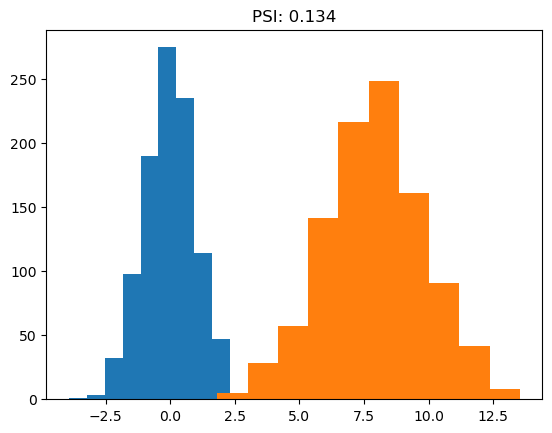

In [110]:
import matplotlib.pyplot as plt

expected = np.random.normal(0, 1, 1000)
actual = np.random.normal(8, 2, 1000)

psi = calculate_psi(expected, actual)
plt.hist(expected)
plt.hist(actual)
plt.title(f'PSI: {psi.round(3)}')
plt.show()

/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


<Axes: xlabel='value', ylabel='Proportion'>

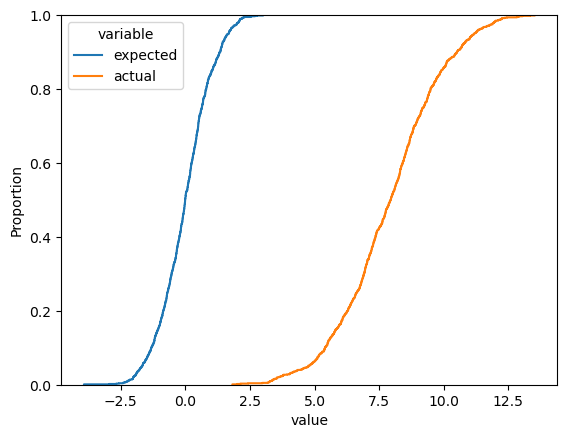

In [120]:
df_plot = pd.DataFrame(zip(expected, actual), columns=['expected', 'actual'])
df_plot = df_plot.melt(value_vars=['expected', 'actual'])
sns.ecdfplot(data=df_plot, x='value', hue='variable')

Ok, ahora utilizando la librería de selección de features, esto sería:

In [85]:
from feature_engine.selection import DropHighPSIFeatures

# Notar que el split frac se utiliza para separar los datos
transformer = DropHighPSIFeatures(split_frac=0.6)
transformer.fit_transform(X_train)

,key,mode,acousticness,instrumentalness,liveness,tempo,duration_ms,time_signature,artist
184,1,0,0.4630,0.040800,0.1730,118.650,270773,4,The Rolling Stones
672,6,1,0.0495,0.000000,0.3270,83.028,240093,4,Camp Lo
712,1,0,0.0252,0.000000,0.1760,89.788,206493,4,Black Star
698,10,0,0.1100,0.000000,0.0793,98.820,253413,4,Pete Rock & C.L. Smooth
0,10,0,0.0384,0.000003,0.1620,180.002,267747,4,Daddy Yankee
...,...,...,...,...,...,...,...,...,...
744,5,1,0.0259,0.000000,0.1090,120.019,340707,4,Harry Styles
345,2,1,0.2010,0.000000,0.0727,123.377,383827,4,Harold Melvin & The Blue Notes
584,10,0,0.0083,0.513000,0.1350,126.015,159048,4,Valentino Khan
375,0,1,0.0644,0.009480,0.3610,120.747,260747,4,Kelly Marie


Revisamos el valor de PSI/CSI obtenido para cada uno:

In [106]:
transformer.psi_values_

{'danceability': 0.4425547605606096,
 'energy': 0.32658461424479723,
 'loudness': 0.32313867306908084,
 'speechiness': 0.478065843953344,
 'acousticness': 0.2039838132320568,
 'instrumentalness': 0.20341995538118396,
 'liveness': 0.16658646751605577,
 'valence': 0.5827915646726108,
 'tempo': 0.23339687543717086,
 'duration_ms': 0.128489687755246}

In [107]:
transformer.features_to_drop_

['danceability', 'energy', 'loudness', 'speechiness', 'valence']

Comparamos las distribuciones de alguna variable que fue eliminada:

/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


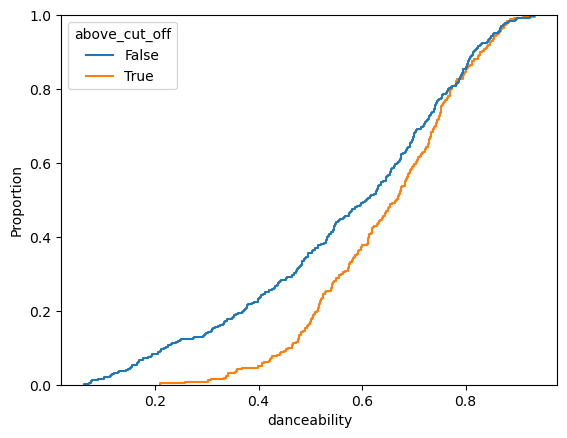

In [108]:
import seaborn as sns

X_train_example = X_train.copy()
X_train_example['above_cut_off'] = X_train_example.index > transformer.cut_off_
sns.ecdfplot(data=X_train_example, x='danceability', hue='above_cut_off')
plt.show()

### Probe

<center>
<img src='https://substackcdn.com/image/fetch/f_auto,q_auto:good,fl_progressive:steep/https%3A%2F%2Fsubstack-post-media.s3.amazonaws.com%2Fpublic%2Fimages%2F10f9a8f7-ce4d-46d5-8915-127b5a20d3e0_770x862.gif' width=350 />

Uno de los principales objetivos de la selección de features es eliminar el ruido del conjunto de datos. Una variable generada aleatoriamente, es decir, una feature de prueba, posee inherentemente un alto nivel de ruido. Por lo tanto, cualquier variable que demuestre ser menos importante que una feature de prueba se considera ruido y puede ser descartada del conjunto de datos.

En esta línea, un selector de features que cumple este objetivo es **Probe**, que se enfoca en seleccionar features dentro de un conjunto de datos que tienen un poder predictivo significativamente mayor que una variable aleatoria.

**Probe** genera una o más variables aleatorias basadas en los parámetros seleccionados por el usuario. Luego, el transformador deriva la importancia de cada feature y features de prueba. Finalmente, elimina las features que tienen una puntuación de importancia menor que la(s) feature(s) de prueba.

#### Pasos para la Selección

1. Crear una o más features aleatorias.
2. Entrenar un modelo de machine learning con todas las features, incluidas las aleatorias.
3. Derivar la importancia de las features para todas las variables.
4. Calcular la importancia promedio de las features aleatorias (solo si se utilizaron más de una).
5. Seleccionar las features cuya importancia sea mayor que la importancia de las variables aleatorias (paso 4).

Para realizar el ejemplo, utilizaremos `RandomForestClassifier()` como el estimador. Usaremos la precisión como el parámetro de evaluación y 5 como el parámetro `cv`, ambos utilizados en la validación cruzada.

En este ejemplo, introduciremos solo una feature aleatoria con una distribución normal. Por lo tanto, pasaremos 1 para el parámetro `n_probes` y `normal` como la distribución:

In [47]:
from sklearn.ensemble import RandomForestClassifier
from feature_engine.selection import ProbeFeatureSelection

In [51]:
%%capture
sel = ProbeFeatureSelection(
    estimator=RandomForestClassifier(),
    variables=None,
    scoring="precision",
    n_probes=1,
    distribution="normal",
    cv=5,
    random_state=150,
    confirm_variables=False
)

X_probe = sel.fit_transform(X_train, y_train)

Para revisar el comportamiento de la variable aleatoria anexada al dataset, realizamos:

In [56]:
sel.probe_features_.head()

,gaussian_probe_0
0,-0.694150
1,1.171840
2,1.074892
3,1.698733
4,0.498702


Luego, si queremos revisar el ranking de la selección de features:

In [58]:
sel.feature_importances_

danceability        0.131570
energy              0.093697
loudness            0.102149
speechiness         0.125064
acousticness        0.105738
instrumentalness    0.075589
liveness            0.050750
valence             0.091988
tempo               0.097575
duration_ms         0.081867
gaussian_probe_0    0.044014
dtype: float64

Veamos ahora el caso si agregamos más de una variable aleatoria:

In [59]:
%%capture
sel = ProbeFeatureSelection(
    estimator=RandomForestClassifier(),
    variables=None,
    scoring="precision",
    n_probes=3,
    distribution="all",
    cv=5,
    random_state=150,
    confirm_variables=False
)

X_probe = sel.fit(X_train, y_train)

In [60]:
sel.probe_features_.head()

,gaussian_probe_0,binary_probe_0,uniform_probe_0
0,-0.694150,0,0.101473
1,1.171840,0,0.537673
2,1.074892,1,0.251362
3,1.698733,1,0.611564
4,0.498702,1,0.669323


In [62]:
sel.feature_importances_

danceability        0.119730
energy              0.084923
loudness            0.100006
speechiness         0.119889
acousticness        0.100222
instrumentalness    0.074033
liveness            0.049880
valence             0.092912
tempo               0.092616
duration_ms         0.077944
gaussian_probe_0    0.040413
binary_probe_0      0.008029
uniform_probe_0     0.039403
dtype: float64

❓ Pregunta: ¿Podría utilizarse un algoritmo diferente a RandomForest?

### Scheme independent o Método de Filtro .

<center>
<img src='https://i.gifer.com/origin/c9/c9be3e27aac9ecddc6c7e64aad70d8df_w200.gif' width=350 />

Compara las características con las etiquetas a través de test estadísticos simples e ignora la relación entre las características en si. Para ocupar este tipo de técnicas se requiere una métrica y una estrategia

#### Métricas

- Varias métricas para clasificación: 
    - Anova (`f_classif`). La idea es calcular un estadístico F-score, el cuál indica que tan fácil es para un atributo distinguir entre clases. Más información [aquí](https://datascience.stackexchange.com/questions/74465/how-to-understand-anova-f-for-feature-selection-in-python-sklearn-selectkbest-w).
    - Mutual information (`mutual_info_classif`) es un estadístico que mide la independencia entre dos variables aleatorias. 0 indica independencia entre variables. Valores más altos indican mayor depencia. En general da mejores resultados que `f_classif`, pero su implementación es más lenta.
    - Chi squared (`chi2`) realiza un test estadístico $\chi^2$ que, al igual que la función anterior, mide la dependencia entre distintas variables. Sirve solo con variables categóricas (en OneHot) o conteos (como Bag of Words).
    
- Para regresión, se usan otro tipo de métricas especializadas en ellas.
- Referencia: [Univariate Feature Selection](https://scikit-learn.org/stable/modules/feature_selection.html#univariate-feature-selection).

#### Estrategias

Definen como se seleccionarán las mejores características: 

- `SelectKBest` selecciona las features con los mejores valores. Hay que especificar el número de features que seleccionaremos.

- `SelectPercentile` selecciona el porcentaje con mejores valores. Hay que especificar con cuanto porcentaje quedarse.

#### Integrar la Selección de Características al Pipeline

La búsqueda de mejores características se realiza al momento de entrenar un pipeline. Luego, al momento de predecir, el selector de características simplemente descarta las características no utilizadas antes de pasar a la siguiente etapa. El siguiente ejemplo muestra lo anteriormente dicho:

In [ ]:
from sklearn.feature_selection import (
    SelectKBest,
    SelectPercentile,
    f_classif,
    mutual_info_classif,
)

# Creamos nuestro baseline pipeline
selection_pipeline = Pipeline(
    steps=[
        ("Preprocessing", preprocessing),
        # Conservamos el 70% mejor según la métrica seleccionada
        ("Selection", SelectPercentile(f_classif, percentile=70)),
        ("Tree", DecisionTreeClassifier(random_state=42)),
    ]
)

train_and_evaluate(selection_pipeline)

In [ ]:
# Creamos nuestro baseline pipeline
selection_pipeline = Pipeline(
    steps=[
        ("Preprocessing", preprocessing),
        ("Selection", SelectPercentile(f_classif, percentile=20)),
        ("Tree", DecisionTreeClassifier(random_state=42)),
    ]
)

train_and_evaluate(selection_pipeline)

In [ ]:
# Creamos nuestro baseline pipeline
selection_pipeline = Pipeline(
    steps=[
        ("Preprocessing", preprocessing),
        ("Selection", SelectPercentile(mutual_info_classif, percentile=20)),
        ("Tree", DecisionTreeClassifier(random_state=42)),
    ]
)

train_and_evaluate(selection_pipeline)

> **Pregunta: ❓** ¿Cómo elegir el mejor porcentaje de features por conservar? ¿Y la métrica?

In [ ]:
selection_pipeline

In [ ]:
selection_pipeline.steps[1][1]

In [ ]:
selection_pipeline.steps[1][1].percentile

In [ ]:
f1 = []
for i in range(10, 101, 10):
    selection_pipeline.steps[1][1].percentile = i
    f1.append([i, train_and_evaluate(selection_pipeline, print_=False)])
f1 = np.array(f1)

px.line(
    x=f1[:, 0],
    y=f1[:, 1],
    title="F1 según cantidad de Features Conservadas",
)

## GridSearch

<center>
<img src='https://media3.giphy.com/media/42wQXwITfQbDGKqUP7/giphy.gif?cid=6c09b952u0a9kwn7ryl9mz4nhhp82i0lvayupiwrvd4lz1bw&ep=v1_gifs_search&rid=giphy.gif&ct=g' width=250 />

Si bien el ciclo anterior nos permitió encontrar el mejor valor para el porcentaje de la selección de atributos, es bastante trabajo implementarlo, pensando más aún que comunmente se quieren optimizar varias partes del pipeline y no solo un paso en específico.

En el caso anterior, un ejemplo de esto podría ser variar el porcentaje como la métrica usada, teniendo una malla de búsqueda del estilo:

| `f_classif` | `mutual_info_classif` |
|---|---|
| 10 | 10 |
| 20 | 20 |
| 30 | 30 |
| 40 | 40 |
| 50 | 50 |
| 60 | 60 |
| 70 | 70 |
| 80 | 80 |
| 90 | 90 |
| 100 | 100 |


Por esto, la idea es tener un mecanismo para el cual podamos pasarle una lista de hiperparámetros, que este lo pruebe todos y que retorne el mejor modelo. 
Este mecanismo en `scikit-learn` es conocido como Búsqueda de grilla o `Grid-search`.





### Encontrar los Parámetros Disponibles para Modificar

En general, cualquier clase de scikit-learn implementa la función `get_params`, la cual muestra los parámetros disponibles para probar y modificar.


In [ ]:
DecisionTreeClassifier().get_params()

In [ ]:
SelectPercentile().get_params()

Para el caso de una `Pipeline`, muestra las `steps` de la pipeline más los parámetros de cada una de las steps. 
Noten que los parámetros de cada `step` siguen la notación: `{nombre_step}__{parámetro_step}`

Ejemplo: Número de porcentajes que escogeremos - `Selection__percentile`



In [ ]:
selection_pipeline = Pipeline(
    steps=[
        ("Preprocessing", preprocessing),
        ("Selection", SelectPercentile(f_classif, percentile=20)),
        ("Tree", DecisionTreeClassifier(random_state=42)),
    ]
)

selection_pipeline.get_params()

La idea es definir un grilla de hiperparámetros para que GridSearch los explore y elija el mejor.

In [ ]:
param_grid = [
    {"Selection__percentile": range(10, 101, 5)}
]
param_grid

Y luego invocar GridSearch con el Pipeline, la grilla de hiperparámetros, la métrica (pueden ver las métricas disponibles [aquí](https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter)) y la cantidad de cores de su CPU que deseen usar:

In [ ]:
from sklearn.model_selection import GridSearchCV

gs = GridSearchCV(selection_pipeline, param_grid, n_jobs=-1, scoring="f1_macro")
gs.fit(X_train, y_train)

In [ ]:
gs.best_score_

In [ ]:
gs.best_params_

Los resultados de la exploración de grilla los pueden visualizar así: 

In [ ]:
gs.best_estimator_

#### Ejemplo de Uso para Predicción de GridSearch

In [ ]:
# sacamos el vector de los atributos desde las features
gs.predict(X_test)

> **Pregunta ❓**: ¿Y si ahora quiero usar otra métrica univariada para seleccionar atributos?

Por ejemplo, [`Mutual information`](https://en.wikipedia.org/wiki/Mutual_information)
Vamos nuevamente a buscar el nombre del atributo que queremos modificar y ejecutamos nuevamente grid-search.

In [ ]:
selection_pipeline.get_params()

In [ ]:
from sklearn.feature_selection import f_classif, mutual_info_classif

param_grid = [
    {
        "Selection__percentile": range(5, 101, 5),
        "Selection__score_func": [f_classif, mutual_info_classif],
    }
]

In [ ]:
gs = GridSearchCV(selection_pipeline, param_grid, n_jobs=-1, scoring="f1_macro")
train_and_evaluate(gs)

In [ ]:
gs.best_score_

In [ ]:
gs.best_params_

### `Grid Search` y `CV` (Cross Validated)

`Grid Search` recibe como parámetro `X_train` y `y_train` y (a diferencia de la función que definimos en el baseline) entrena un modelo usando cross validation sobre todos los parámetros. 

<center>
    <img src='https://github.com/MDS7202/MDS7202/blob/main/recursos/2023-01/22_hiper/kfold.png?raw=true' width=400/>
</center>

Es decir, por cada fracción del Cross Validation entrena el modelo y luego promedia los scores para obtener el score final de la configuración de hiperparámetros que estaba probando.



Una vez terminada la búsqueda de los hiperparámetros que generan el mejor modelo sobre los k-folds, **por defecto**, selecciona el mejor modelo encontrado **y entrena con todos los datos utilizados.**

**ESTO PUEDE CAUSAR DATA LEAKAGES**. 

Por eso es importante usar `GridSearchCV` con `X_train` y `y_train` y no con todo el dataset (aunque dentro de este se ejecute un Cross Validation). De todas formas, ustedes pueden controlar este comportamiento a través del parámetro `refit`.

In [ ]:
pd.DataFrame(gs.cv_results_)

> **Pregunta ❓**: ¿Podemos entonces también cambiar el clasificador y probar varios tipos?
    

### Probando con más clasificadores 

Efectivamente, la notación permite generar distintas grillas de búsqueda para distintos clasificadores a través de la definición de distintos diccionarios dentro de la lista que se le provee a GridSearch:


```
[
    # grilla 1
    {
     'modelo' : [Modelo1()],
     'modelo__param1': ...
    },
    # grilla 2
    {
     'modelo' : [Modelo1()],
     'modelo__param1': ...
    }, 
    ...

]
```

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

pipe = Pipeline(
    [
        ("preprocessing", preprocessing),
        ("selection", SelectPercentile(f_classif)),
        ("model", KNeighborsClassifier()),
    ]
)

pipe.get_params()

In [ ]:
DecisionTreeClassifier().get_params()

In [ ]:
grid = [
    # grilla 1: tree
    {
        "selection__percentile": range(10, 101, 10),
        "model": [DecisionTreeClassifier()],
        "model__criterion": ["gini", "entropy"],
    },
    # grilla 2: knn
    {
        "selection__percentile": range(10, 101, 10),
        "model": [KNeighborsClassifier()],
        "model__n_neighbors": [2, 4, 5, 10],
    },
    # grilla 3: random forest
    {
        "model": [RandomForestClassifier()],
        "model__criterion": ["gini", "entropy"],
        "model__bootstrap": [True, False],
    },
]

In [ ]:
gs2 = GridSearchCV(pipe, grid, n_jobs=-1, scoring="f1_macro").fit(X_train, y_train)

In [ ]:
gs2.best_score_

In [ ]:
gs2.best_estimator_

## Mejoras a GridSearch

### HalvingGridSearchCV

El funcionamiento de HalvingGridSearchCV se basa en un enfoque iterativo y progresivo. Inicialmente, explora muchas combinaciones de hiperparámetros utilizando una pequeña porción del conjunto de datos. Esto permite evaluar rápidamente cuáles combinaciones tienen más potencial sin invertir demasiado tiempo y recursos en el proceso inicial. A medida que avanza, el algoritmo elimina las combinaciones menos prometedoras y retiene solo las mejores. En cada ronda sucesiva, aumenta gradualmente la cantidad de datos y recursos asignados a las combinaciones que siguen en la competencia.

![](https://github.com/MDS7202/MDS7202/blob/main/recursos/2023-01/22_hiper/halvinggscv.png?raw=true)

In [ ]:
from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.model_selection import HalvingGridSearchCV

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.pipeline import Pipeline

selection_pipeline = Pipeline(
    steps=[
        ("preprocessing", preprocessing),
        ("selection", SelectPercentile(f_classif, percentile=20)),
        ("model", RandomForestClassifier()),
    ]
)

param_grid = [
    {
        "selection__percentile": range(5, 101, 10),
        "selection__score_func": [f_classif, mutual_info_classif],
        "model__criterion": ["gini", "entropy"],
        "model__bootstrap": [True, False],
    }
]

hgs = HalvingGridSearchCV(selection_pipeline, param_grid, n_jobs=-1, scoring='f1_macro')

train_and_evaluate(hgs)

### Optuna

![](https://optuna.readthedocs.io/en/stable/_static/optuna-logo.png)

Optuna es una biblioteca de código abierto diseñada para la optimización automática de hiperparámetros y la búsqueda de configuraciones óptimas de algoritmos de aprendizaje automático. Su objetivo es ayudar a los científicos de datos y los ingenieros a encontrar la mejor combinación de hiperparámetros para un modelo de aprendizaje automático dado, lo que puede mejorar significativamente el rendimiento de dicho modelo. Optuna se basa en técnicas de optimización bayesiana y se ha convertido en una herramienta popular en el campo del aprendizaje automático.

En resumidas cuentas optuna:

1. **Definición del espacio de búsqueda**: En primer lugar, se debe definir un espacio de búsqueda que incluya los hiperparámetros que se desean optimizar y sus rangos de valores posibles. Estos hiperparámetros pueden incluir la tasa de aprendizaje, el número de capas ocultas en una red neuronal, el número de árboles en un bosque aleatorio, etc.

2. **Función objetivo**: Debes definir una función objetivo que toma un conjunto de hiperparámetros como entrada y evalúa el rendimiento del modelo de aprendizaje automático utilizando esos hiperparámetros en un conjunto de datos de validación o prueba. Esta función debe ser la que deseas maximizar o minimizar, dependiendo de tus objetivos (por ejemplo, maximizar la precisión del modelo).

3. **Optimización bayesiana**: Optuna utiliza técnicas de optimización bayesiana para explorar el espacio de búsqueda de manera eficiente. Comienza evaluando un conjunto inicial de hiperparámetros de forma aleatoria y, a medida que se acumulan más evaluaciones, utiliza un modelo probabilístico para predecir cuáles podrían ser las mejores combinaciones de hiperparámetros para explorar a continuación. Esto permite una búsqueda más inteligente y eficiente en lugar de una búsqueda exhaustiva.

4. **Pruebas secuenciales**: Optuna realiza un proceso de prueba y error secuencial para encontrar los mejores hiperparámetros. Evalúa diferentes configuraciones y ajusta su modelo probabilístico en función de los resultados reales observados, lo que conduce a la exploración de regiones prometedoras del espacio de búsqueda.

5. **Criterios de parada**: Puedes definir criterios de parada para detener la búsqueda una vez que se alcanza un cierto nivel de rendimiento o se supera un número máximo de evaluaciones.

6. **Resultados y recomendaciones**: Una vez que la búsqueda de hiperparámetros finaliza, Optuna te proporciona la mejor configuración de hiperparámetros encontrada, así como el valor óptimo de la función objetivo.

Optuna se ha convertido en una herramienta valiosa en la comunidad de aprendizaje automático y ha demostrado ser eficaz para encontrar configuraciones óptimas de hiperparámetros en una amplia variedad de escenarios. Su enfoque basado en la optimización bayesiana ayuda a ahorrar tiempo y recursos en comparación con una búsqueda exhaustiva o aleatoria de hiperparámetros.

![](https://miro.medium.com/v2/resize:fit:1400/format:webp/1*7GM-K-Xu6ui5XasY6DL1Xw.png)

La optimización bayesiana es un enfoque que se utiliza para encontrar la mejor solución de una función objetivo desconocida, teniendo en cuenta la incertidumbre. En términos simples, puedes pensar en ella como un método para buscar la mejor respuesta en un espacio de posibles soluciones de manera eficiente y sistemática, incluso cuando no tienes un conocimiento completo de cómo funciona la función que estás tratando de optimizar.

#### Tree-structured Parzen Estimator (TPE) 

![](https://tech.preferred.jp/wp-content/uploads/2020/10/image4-2.png)

1. Modelo probabilístico: TPE se basa en la construcción de dos modelos probabilísticos, uno para la función objetivo (que deseas optimizar) y otro para la función de probabilidad condicional. El modelo de probabilidad condicional se divide en dos partes: una que modela los puntos de exploración (evaluaciones donde los hiperparámetros se ajustan para buscar nuevos puntos) y otra que modela los puntos de explotación (evaluaciones donde los hiperparámetros se ajustan para maximizar la función objetivo en las áreas prometedoras).

2. Función de probabilidad condicional: La función de probabilidad condicional calcula la probabilidad de que un conjunto dado de hiperparámetros sea mejor que otro conjunto. La optimización se basa en encontrar los puntos que maximizan esta probabilidad.

3. Balance entre exploración y explotación: TPE equilibra la exploración y la explotación de manera eficiente. Durante la búsqueda, se enfoca en explorar nuevas áreas del espacio de hiperparámetros mientras también se explotan las áreas prometedoras donde se espera encontrar mejores configuraciones.

4. Ajuste continuo del modelo: A medida que se recopilan más datos de evaluación, el modelo de TPE se ajusta continuamente para reflejar mejor la función objetivo y la probabilidad condicional. Esto permite una búsqueda cada vez más precisa a medida que se acumulan más evaluaciones.

![](https://tech.preferred.jp/wp-content/uploads/2020/10/image3.gif)

In [41]:
import optuna
from optuna.visualization import plot_contour
from optuna.visualization import plot_edf
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice

In [42]:
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

In [43]:
# Define your objective function to maximize aucpr
def objective_function(trial):
    # Split into features and target
    le = LabelEncoder()
    y = le.fit_transform(df.loc[:, "genre"])
    X = df.drop(columns=["genre", "id", "name", "artist"]).astype(float)

    # Split into train and validation sets
    X_train, X_valid, y_train, y_valid = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Define the hyperparameters to tune
    params = {
        "objective": "multi:softmax",
        "eval_metric": "mlogloss",
        "max_depth": trial.suggest_int("max_depth", 3, 8),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 7),
        "gamma": trial.suggest_float("gamma", 0, 1),
        "n_estimators": trial.suggest_int("n_estimators", 10, 300),
    }

    # Train the XGBoost model with prunning
    pruning_callback = optuna.integration.XGBoostPruningCallback(
        trial, observation_key="validation_1-mlogloss"
    )
    model = XGBClassifier(seed=42, **params)
    model.fit(
        X_train,
        y_train,
        eval_set=[(X_train, y_train), (X_valid, y_valid)],
        early_stopping_rounds=10,
        callbacks=[pruning_callback],
    )

    # Predict and evaluate the model
    yhat = model.predict(X_valid)
    f1 = f1_score(y_valid, yhat, average='weighted')

    return f1

In [44]:
study = optuna.create_study(direction="maximize")
study.optimize(objective_function, n_trials=500)

[I 2024-05-20 11:26:30,063] A new study created in memory with name: no-name-eb7625fd-89cd-45c2-ba24-89ee3c0118f1


[0]	validation_0-mlogloss:2.19280	validation_1-mlogloss:2.19379
[1]	validation_0-mlogloss:2.18890	validation_1-mlogloss:2.19065
[2]	validation_0-mlogloss:2.18514	validation_1-mlogloss:2.18762
[3]	validation_0-mlogloss:2.18103	validation_1-mlogloss:2.18438
[4]	validation_0-mlogloss:2.17696	validation_1-mlogloss:2.18080
[5]	validation_0-mlogloss:2.17306	validation_1-mlogloss:2.17779
[6]	validation_0-mlogloss:2.16876	validation_1-mlogloss:2.17373
[7]	validation_0-mlogloss:2.16462	validation_1-mlogloss:2.17037
[8]	validation_0-mlogloss:2.16150	validation_1-mlogloss:2.16781
[9]	validation_0-mlogloss:2.15795	validation_1-mlogloss:2.16497
[10]	validation_0-mlogloss:2.15358	validation_1-mlogloss:2.16120
[11]	validation_0-mlogloss:2.14931	validation_1-mlogloss:2.15779
[12]	validation_0-mlogloss:2.14544	validation_1-mlogloss:2.15455
[13]	validation_0-mlogloss:2.14151	validation_1-mlogloss:2.15148
[14]	validation_0-mlogloss:2.13763	validation_1-mlogloss:2.14872
[15]	validation_0-mlogloss:2.13332	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[30]	validation_0-mlogloss:2.07690	validation_1-mlogloss:2.09875
[31]	validation_0-mlogloss:2.07382	validation_1-mlogloss:2.09625
[32]	validation_0-mlogloss:2.07036	validation_1-mlogloss:2.09332
[33]	validation_0-mlogloss:2.06707	validation_1-mlogloss:2.09021
[34]	validation_0-mlogloss:2.06299	validation_1-mlogloss:2.08726
[35]	validation_0-mlogloss:2.05920	validation_1-mlogloss:2.08382
[36]	validation_0-mlogloss:2.05610	validation_1-mlogloss:2.08128
[37]	validation_0-mlogloss:2.05307	validation_1-mlogloss:2.07920
[38]	validation_0-mlogloss:2.04983	validation_1-mlogloss:2.07647
[39]	validation_0-mlogloss:2.04640	validation_1-mlogloss:2.07345
[40]	validation_0-mlogloss:2.04290	validation_1-mlogloss:2.07041
[41]	validation_0-mlogloss:2.03913	validation_1-mlogloss:2.06718
[42]	validation_0-mlogloss:2.03624	validation_1-mlogloss:2.06518
[43]	validation_0-mlogloss:2.03276	validation_1-mlogloss:2.06262
[44]	validation_0-mlogloss:2.02911	validation_1-mlogloss:2.05926
[45]	validation_0-mloglos

[I 2024-05-20 11:26:31,792] Trial 0 finished with value: 0.6337092655397832 and parameters: {'max_depth': 3, 'learning_rate': 0.0031274955223394513, 'subsample': 0.6253542357348987, 'colsample_bytree': 0.5409452707479149, 'min_child_weight': 5, 'gamma': 0.9094898516727832, 'n_estimators': 282}. Best is trial 0 with value: 0.6337092655397832.


[0]	validation_0-mlogloss:2.02144	validation_1-mlogloss:2.06043
[1]	validation_0-mlogloss:1.88492	validation_1-mlogloss:1.96073
[2]	validation_0-mlogloss:1.76110	validation_1-mlogloss:1.87670
[3]	validation_0-mlogloss:1.65060	validation_1-mlogloss:1.81334
[4]	validation_0-mlogloss:1.55083	validation_1-mlogloss:1.74439
[5]	validation_0-mlogloss:1.46235	validation_1-mlogloss:1.68804
[6]	validation_0-mlogloss:1.37934	validation_1-mlogloss:1.63047
[7]	validation_0-mlogloss:1.30558	validation_1-mlogloss:1.57948
[8]	validation_0-mlogloss:1.24173	validation_1-mlogloss:1.53438
[9]	validation_0-mlogloss:1.18044	validation_1-mlogloss:1.49503
[10]	validation_0-mlogloss:1.12143	validation_1-mlogloss:1.45515
[11]	validation_0-mlogloss:1.06609	validation_1-mlogloss:1.42042
[12]	validation_0-mlogloss:1.01757	validation_1-mlogloss:1.39442
[13]	validation_0-mlogloss:0.96922	validation_1-mlogloss:1.36183
[14]	validation_0-mlogloss:0.92669	validation_1-mlogloss:1.33881
[15]	validation_0-mlogloss:0.88406	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:0.66417	validation_1-mlogloss:1.17237
[23]	validation_0-mlogloss:0.63939	validation_1-mlogloss:1.15268
[24]	validation_0-mlogloss:0.61679	validation_1-mlogloss:1.14088
[25]	validation_0-mlogloss:0.59378	validation_1-mlogloss:1.12660
[26]	validation_0-mlogloss:0.57546	validation_1-mlogloss:1.11044
[27]	validation_0-mlogloss:0.55602	validation_1-mlogloss:1.09906
[28]	validation_0-mlogloss:0.53817	validation_1-mlogloss:1.09091
[29]	validation_0-mlogloss:0.52109	validation_1-mlogloss:1.07684
[30]	validation_0-mlogloss:0.50376	validation_1-mlogloss:1.06612
[31]	validation_0-mlogloss:0.48864	validation_1-mlogloss:1.05709
[32]	validation_0-mlogloss:0.47429	validation_1-mlogloss:1.04845
[33]	validation_0-mlogloss:0.46065	validation_1-mlogloss:1.03971
[34]	validation_0-mlogloss:0.44609	validation_1-mlogloss:1.03201
[35]	validation_0-mlogloss:0.43312	validation_1-mlogloss:1.02470
[36]	validation_0-mlogloss:0.42239	validation_1-mlogloss:1.01584
[37]	validation_0-mloglos

[I 2024-05-20 11:26:32,530] Trial 1 finished with value: 0.6743859314864916 and parameters: {'max_depth': 7, 'learning_rate': 0.08986069045003936, 'subsample': 0.7845049589737866, 'colsample_bytree': 0.718625624008713, 'min_child_weight': 2, 'gamma': 0.6725112449453156, 'n_estimators': 83}. Best is trial 1 with value: 0.6743859314864916.


[0]	validation_0-mlogloss:2.19555	validation_1-mlogloss:2.19579
[1]	validation_0-mlogloss:2.19390	validation_1-mlogloss:2.19444
[2]	validation_0-mlogloss:2.19230	validation_1-mlogloss:2.19320
[3]	validation_0-mlogloss:2.19061	validation_1-mlogloss:2.19190
[4]	validation_0-mlogloss:2.18885	validation_1-mlogloss:2.19032
[5]	validation_0-mlogloss:2.18734	validation_1-mlogloss:2.18917
[6]	validation_0-mlogloss:2.18547	validation_1-mlogloss:2.18745
[7]	validation_0-mlogloss:2.18372	validation_1-mlogloss:2.18601
[8]	validation_0-mlogloss:2.18229	validation_1-mlogloss:2.18472
[9]	validation_0-mlogloss:2.18075	validation_1-mlogloss:2.18352
[10]	validation_0-mlogloss:2.17888	validation_1-mlogloss:2.18190
[11]	validation_0-mlogloss:2.17707	validation_1-mlogloss:2.18036
[12]	validation_0-mlogloss:2.17539	validation_1-mlogloss:2.17898
[13]	validation_0-mlogloss:2.17355	validation_1-mlogloss:2.17763
[14]	validation_0-mlogloss:2.17185	validation_1-mlogloss:2.17634
[15]	validation_0-mlogloss:2.17000	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[25]	validation_0-mlogloss:2.15355	validation_1-mlogloss:2.16197
[26]	validation_0-mlogloss:2.15198	validation_1-mlogloss:2.16066
[27]	validation_0-mlogloss:2.15005	validation_1-mlogloss:2.15919
[28]	validation_0-mlogloss:2.14854	validation_1-mlogloss:2.15793
[29]	validation_0-mlogloss:2.14691	validation_1-mlogloss:2.15645
[30]	validation_0-mlogloss:2.14513	validation_1-mlogloss:2.15501
[31]	validation_0-mlogloss:2.14372	validation_1-mlogloss:2.15389
[32]	validation_0-mlogloss:2.14214	validation_1-mlogloss:2.15272
[33]	validation_0-mlogloss:2.14058	validation_1-mlogloss:2.15126
[34]	validation_0-mlogloss:2.13877	validation_1-mlogloss:2.14976
[35]	validation_0-mlogloss:2.13701	validation_1-mlogloss:2.14817
[36]	validation_0-mlogloss:2.13558	validation_1-mlogloss:2.14708
[37]	validation_0-mlogloss:2.13409	validation_1-mlogloss:2.14604
[38]	validation_0-mlogloss:2.13264	validation_1-mlogloss:2.14485
[39]	validation_0-mlogloss:2.13102	validation_1-mlogloss:2.14363
[40]	validation_0-mloglos

[I 2024-05-20 11:26:34,016] Trial 2 finished with value: 0.6233647098352612 and parameters: {'max_depth': 7, 'learning_rate': 0.0013234563004974546, 'subsample': 0.6050401147079731, 'colsample_bytree': 0.5275216355855926, 'min_child_weight': 5, 'gamma': 0.5722012438016711, 'n_estimators': 198}. Best is trial 1 with value: 0.6743859314864916.


[0]	validation_0-mlogloss:2.06901	validation_1-mlogloss:2.08840
[1]	validation_0-mlogloss:1.95764	validation_1-mlogloss:1.99899
[2]	validation_0-mlogloss:1.86151	validation_1-mlogloss:1.92799
[3]	validation_0-mlogloss:1.76916	validation_1-mlogloss:1.87120
[4]	validation_0-mlogloss:1.68363	validation_1-mlogloss:1.80511
[5]	validation_0-mlogloss:1.60771	validation_1-mlogloss:1.75276
[6]	validation_0-mlogloss:1.53322	validation_1-mlogloss:1.69802
[7]	validation_0-mlogloss:1.46796	validation_1-mlogloss:1.65116
[8]	validation_0-mlogloss:1.41657	validation_1-mlogloss:1.61359
[9]	validation_0-mlogloss:1.36257	validation_1-mlogloss:1.58086
[10]	validation_0-mlogloss:1.30720	validation_1-mlogloss:1.53939
[11]	validation_0-mlogloss:1.25374	validation_1-mlogloss:1.50215
[12]	validation_0-mlogloss:1.21196	validation_1-mlogloss:1.47413
[13]	validation_0-mlogloss:1.16772	validation_1-mlogloss:1.44485
[14]	validation_0-mlogloss:1.13025	validation_1-mlogloss:1.42322
[15]	validation_0-mlogloss:1.08724	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[25]	validation_0-mlogloss:0.80374	validation_1-mlogloss:1.20421
[26]	validation_0-mlogloss:0.78412	validation_1-mlogloss:1.19328
[27]	validation_0-mlogloss:0.76364	validation_1-mlogloss:1.17769
[28]	validation_0-mlogloss:0.74404	validation_1-mlogloss:1.16621
[29]	validation_0-mlogloss:0.72577	validation_1-mlogloss:1.15229
[30]	validation_0-mlogloss:0.70833	validation_1-mlogloss:1.13859
[31]	validation_0-mlogloss:0.69220	validation_1-mlogloss:1.12877
[32]	validation_0-mlogloss:0.67722	validation_1-mlogloss:1.11943
[33]	validation_0-mlogloss:0.66231	validation_1-mlogloss:1.11071
[34]	validation_0-mlogloss:0.64621	validation_1-mlogloss:1.10018
[35]	validation_0-mlogloss:0.62978	validation_1-mlogloss:1.09238
[36]	validation_0-mlogloss:0.61663	validation_1-mlogloss:1.08385
[37]	validation_0-mlogloss:0.60351	validation_1-mlogloss:1.07887
[38]	validation_0-mlogloss:0.59122	validation_1-mlogloss:1.07491
[39]	validation_0-mlogloss:0.57684	validation_1-mlogloss:1.06609
[40]	validation_0-mloglos

[I 2024-05-20 11:26:35,109] Trial 3 finished with value: 0.6984485661577067 and parameters: {'max_depth': 5, 'learning_rate': 0.0835319485928899, 'subsample': 0.8341472176856415, 'colsample_bytree': 0.6052419244576792, 'min_child_weight': 4, 'gamma': 0.6859970248681927, 'n_estimators': 228}. Best is trial 3 with value: 0.6984485661577067.


[0]	validation_0-mlogloss:2.12540	validation_1-mlogloss:2.13744
[1]	validation_0-mlogloss:2.06057	validation_1-mlogloss:2.09420
[2]	validation_0-mlogloss:1.99988	validation_1-mlogloss:2.05404
[3]	validation_0-mlogloss:1.94438	validation_1-mlogloss:2.01293
[4]	validation_0-mlogloss:1.89237	validation_1-mlogloss:1.97500
[5]	validation_0-mlogloss:1.84308	validation_1-mlogloss:1.94286
[6]	validation_0-mlogloss:1.79500	validation_1-mlogloss:1.90703
[7]	validation_0-mlogloss:1.74702	validation_1-mlogloss:1.87086
[8]	validation_0-mlogloss:1.70255	validation_1-mlogloss:1.83804
[9]	validation_0-mlogloss:1.66250	validation_1-mlogloss:1.81208
[10]	validation_0-mlogloss:1.61793	validation_1-mlogloss:1.77676
[11]	validation_0-mlogloss:1.57986	validation_1-mlogloss:1.74858
[12]	validation_0-mlogloss:1.54125	validation_1-mlogloss:1.72236
[13]	validation_0-mlogloss:1.50461	validation_1-mlogloss:1.69513
[14]	validation_0-mlogloss:1.46938	validation_1-mlogloss:1.66932
[15]	validation_0-mlogloss:1.43537	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[21]	validation_0-mlogloss:1.25782	validation_1-mlogloss:1.52322
[22]	validation_0-mlogloss:1.23356	validation_1-mlogloss:1.50852
[23]	validation_0-mlogloss:1.20762	validation_1-mlogloss:1.48723
[24]	validation_0-mlogloss:1.18428	validation_1-mlogloss:1.47142
[25]	validation_0-mlogloss:1.16196	validation_1-mlogloss:1.45759
[26]	validation_0-mlogloss:1.13969	validation_1-mlogloss:1.44043
[27]	validation_0-mlogloss:1.11689	validation_1-mlogloss:1.42401
[28]	validation_0-mlogloss:1.09670	validation_1-mlogloss:1.40902
[29]	validation_0-mlogloss:1.07547	validation_1-mlogloss:1.39258
[30]	validation_0-mlogloss:1.05379	validation_1-mlogloss:1.37621
[31]	validation_0-mlogloss:1.03478	validation_1-mlogloss:1.36245
[32]	validation_0-mlogloss:1.01690	validation_1-mlogloss:1.35155
[33]	validation_0-mlogloss:0.99915	validation_1-mlogloss:1.33997
[34]	validation_0-mlogloss:0.98157	validation_1-mlogloss:1.32974
[35]	validation_0-mlogloss:0.96285	validation_1-mlogloss:1.31577
[36]	validation_0-mloglos

[I 2024-05-20 11:26:36,832] Trial 4 finished with value: 0.7004695970873618 and parameters: {'max_depth': 7, 'learning_rate': 0.03941838605460371, 'subsample': 0.5786917302781696, 'colsample_bytree': 0.8686474834527569, 'min_child_weight': 2, 'gamma': 0.18356833019621366, 'n_estimators': 253}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19510	validation_1-mlogloss:2.19539
[1]	validation_0-mlogloss:2.19312	validation_1-mlogloss:2.19384
[2]	validation_0-mlogloss:2.19125	validation_1-mlogloss:2.19243
[3]	validation_0-mlogloss:2.18932	validation_1-mlogloss:2.19083
[4]	validation_0-mlogloss:2.18741	validation_1-mlogloss:2.18922
[5]	validation_0-mlogloss:2.18551	validation_1-mlogloss:2.18766
[6]	validation_0-mlogloss:2.18346	validation_1-mlogloss:2.18591
[7]	validation_0-mlogloss:2.18155	validation_1-mlogloss:2.18430
[8]	validation_0-mlogloss:2.17962	validation_1-mlogloss:2.18262
[9]	validation_0-mlogloss:2.17793	validation_1-mlogloss:2.18126
[10]	validation_0-mlogloss:2.17581	validation_1-mlogloss:2.17960
[11]	validation_0-mlogloss:2.17389	validation_1-mlogloss:2.17811
[12]	validation_0-mlogloss:2.17208	validation_1-mlogloss:2.17660
[13]	validation_0-mlogloss:2.16996	validation_1-mlogloss:2.17487
[14]	validation_0-mlogloss:2.16794	validation_1-mlogloss:2.17325
[15]	validation_0-mlogloss:2.16587	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-mlogloss:2.14283	validation_1-mlogloss:2.15250
[28]	validation_0-mlogloss:2.14096	validation_1-mlogloss:2.15093
[29]	validation_0-mlogloss:2.13905	validation_1-mlogloss:2.14929
[30]	validation_0-mlogloss:2.13711	validation_1-mlogloss:2.14762
[31]	validation_0-mlogloss:2.13526	validation_1-mlogloss:2.14606
[32]	validation_0-mlogloss:2.13345	validation_1-mlogloss:2.14465
[33]	validation_0-mlogloss:2.13161	validation_1-mlogloss:2.14301
[34]	validation_0-mlogloss:2.12961	validation_1-mlogloss:2.14132
[35]	validation_0-mlogloss:2.12774	validation_1-mlogloss:2.13963
[36]	validation_0-mlogloss:2.12592	validation_1-mlogloss:2.13814
[37]	validation_0-mlogloss:2.12410	validation_1-mlogloss:2.13672
[38]	validation_0-mlogloss:2.12207	validation_1-mlogloss:2.13488
[39]	validation_0-mlogloss:2.12032	validation_1-mlogloss:2.13353
[40]	validation_0-mlogloss:2.11847	validation_1-mlogloss:2.13205
[41]	validation_0-mlogloss:2.11660	validation_1-mlogloss:2.13034
[42]	validation_0-mloglos

[I 2024-05-20 11:26:38,220] Trial 5 finished with value: 0.5875837733857016 and parameters: {'max_depth': 3, 'learning_rate': 0.0013277163085080605, 'subsample': 0.721470811230595, 'colsample_bytree': 0.8761452033939785, 'min_child_weight': 6, 'gamma': 0.32478388122672563, 'n_estimators': 195}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.06997	validation_1-mlogloss:2.09754


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:38,234] Trial 6 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.18418	validation_1-mlogloss:2.18601
[1]	validation_0-mlogloss:2.17278	validation_1-mlogloss:2.17664
[2]	validation_0-mlogloss:2.16330	validation_1-mlogloss:2.16968
[3]	validation_0-mlogloss:2.15350	validation_1-mlogloss:2.16133
[4]	validation_0-mlogloss:2.14286	validation_1-mlogloss:2.15189
[5]	validation_0-mlogloss:2.13249	validation_1-mlogloss:2.14405
[6]	validation_0-mlogloss:2.12132	validation_1-mlogloss:2.13336
[7]	validation_0-mlogloss:2.11110	validation_1-mlogloss:2.12482
[8]	validation_0-mlogloss:2.10121	validation_1-mlogloss:2.11568
[9]	validation_0-mlogloss:2.09221	validation_1-mlogloss:2.10802
[10]	validation_0-mlogloss:2.08169	validation_1-mlogloss:2.09900
[11]	validation_0-mlogloss:2.07167	validation_1-mlogloss:2.09047
[12]	validation_0-mlogloss:2.06132	validation_1-mlogloss:2.08238
[13]	validation_0-mlogloss:2.05024	validation_1-mlogloss:2.07390
[14]	validation_0-mlogloss:2.03962	validation_1-mlogloss:2.06590
[15]	validation_0-mlogloss:2.02871	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[27]	validation_0-mlogloss:1.91927	validation_1-mlogloss:1.96457
[28]	validation_0-mlogloss:1.91112	validation_1-mlogloss:1.95728
[29]	validation_0-mlogloss:1.90242	validation_1-mlogloss:1.94968
[30]	validation_0-mlogloss:1.89359	validation_1-mlogloss:1.94172
[31]	validation_0-mlogloss:1.88580	validation_1-mlogloss:1.93486
[32]	validation_0-mlogloss:1.87776	validation_1-mlogloss:1.92910
[33]	validation_0-mlogloss:1.86993	validation_1-mlogloss:1.92181
[34]	validation_0-mlogloss:1.86160	validation_1-mlogloss:1.91424
[35]	validation_0-mlogloss:1.85328	validation_1-mlogloss:1.90661
[36]	validation_0-mlogloss:1.84493	validation_1-mlogloss:1.89953
[37]	validation_0-mlogloss:1.83752	validation_1-mlogloss:1.89426
[38]	validation_0-mlogloss:1.82950	validation_1-mlogloss:1.88779
[39]	validation_0-mlogloss:1.82206	validation_1-mlogloss:1.88238
[40]	validation_0-mlogloss:1.81396	validation_1-mlogloss:1.87537
[41]	validation_0-mlogloss:1.80673	validation_1-mlogloss:1.86882
[42]	validation_0-mloglos

[I 2024-05-20 11:26:39,221] Trial 7 finished with value: 0.618509898387391 and parameters: {'max_depth': 4, 'learning_rate': 0.008624027968832448, 'subsample': 0.5082675378496337, 'colsample_bytree': 0.860235700325427, 'min_child_weight': 6, 'gamma': 0.602033672731132, 'n_estimators': 142}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19444	validation_1-mlogloss:2.19470
[1]	validation_0-mlogloss:2.19188	validation_1-mlogloss:2.19262
[2]	validation_0-mlogloss:2.18909	validation_1-mlogloss:2.19045
[3]	validation_0-mlogloss:2.18622	validation_1-mlogloss:2.18825
[4]	validation_0-mlogloss:2.18338	validation_1-mlogloss:2.18595
[5]	validation_0-mlogloss:2.18084	validation_1-mlogloss:2.18378
[6]	validation_0-mlogloss:2.17813	validation_1-mlogloss:2.18155
[7]	validation_0-mlogloss:2.17534	validation_1-mlogloss:2.17926
[8]	validation_0-mlogloss:2.17265	validation_1-mlogloss:2.17714
[9]	validation_0-mlogloss:2.16987	validation_1-mlogloss:2.17500
[10]	validation_0-mlogloss:2.16715	validation_1-mlogloss:2.17282
[11]	validation_0-mlogloss:2.16444	validation_1-mlogloss:2.17073
[12]	validation_0-mlogloss:2.16180	validation_1-mlogloss:2.16865
[13]	validation_0-mlogloss:2.15899	validation_1-mlogloss:2.16642
[14]	validation_0-mlogloss:2.15621	validation_1-mlogloss:2.16420
[15]	validation_0-mlogloss:2.15344	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[31]	validation_0-mlogloss:2.11121	validation_1-mlogloss:2.12845
[32]	validation_0-mlogloss:2.10854	validation_1-mlogloss:2.12627
[33]	validation_0-mlogloss:2.10602	validation_1-mlogloss:2.12417
[34]	validation_0-mlogloss:2.10349	validation_1-mlogloss:2.12211
[35]	validation_0-mlogloss:2.10098	validation_1-mlogloss:2.12016
[36]	validation_0-mlogloss:2.09839	validation_1-mlogloss:2.11804
[37]	validation_0-mlogloss:2.09574	validation_1-mlogloss:2.11603
[38]	validation_0-mlogloss:2.09320	validation_1-mlogloss:2.11409
[39]	validation_0-mlogloss:2.09088	validation_1-mlogloss:2.11227
[40]	validation_0-mlogloss:2.08830	validation_1-mlogloss:2.11024
[41]	validation_0-mlogloss:2.08573	validation_1-mlogloss:2.10811
[42]	validation_0-mlogloss:2.08327	validation_1-mlogloss:2.10594
[43]	validation_0-mlogloss:2.08095	validation_1-mlogloss:2.10410
[44]	validation_0-mlogloss:2.07839	validation_1-mlogloss:2.10196
[45]	validation_0-mlogloss:2.07614	validation_1-mlogloss:2.10016
[46]	validation_0-mloglos

[I 2024-05-20 11:26:39,898] Trial 8 finished with value: 0.5979403100124486 and parameters: {'max_depth': 3, 'learning_rate': 0.0015727055048652468, 'subsample': 0.8018618148096404, 'colsample_bytree': 0.9790168918040456, 'min_child_weight': 2, 'gamma': 0.6857735776318037, 'n_estimators': 103}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19204	validation_1-mlogloss:2.19315
[1]	validation_0-mlogloss:2.18711	validation_1-mlogloss:2.18944
[2]	validation_0-mlogloss:2.18229	validation_1-mlogloss:2.18590
[3]	validation_0-mlogloss:2.17744	validation_1-mlogloss:2.18221
[4]	validation_0-mlogloss:2.17233	validation_1-mlogloss:2.17810
[5]	validation_0-mlogloss:2.16784	validation_1-mlogloss:2.17490
[6]	validation_0-mlogloss:2.16311	validation_1-mlogloss:2.17140
[7]	validation_0-mlogloss:2.15817	validation_1-mlogloss:2.16788
[8]	validation_0-mlogloss:2.15342	validation_1-mlogloss:2.16426
[9]	validation_0-mlogloss:2.14883	validation_1-mlogloss:2.16070
[10]	validation_0-mlogloss:2.14400	validation_1-mlogloss:2.15690
[11]	validation_0-mlogloss:2.13918	validation_1-mlogloss:2.15345
[12]	validation_0-mlogloss:2.13460	validation_1-mlogloss:2.15006
[13]	validation_0-mlogloss:2.12973	validation_1-mlogloss:2.14631
[14]	validation_0-mlogloss:2.12505	validation_1-mlogloss:2.14260
[15]	validation_0-mlogloss:2.12026	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:2.08768	validation_1-mlogloss:2.11539
[23]	validation_0-mlogloss:2.08311	validation_1-mlogloss:2.11213
[24]	validation_0-mlogloss:2.07853	validation_1-mlogloss:2.10881
[25]	validation_0-mlogloss:2.07397	validation_1-mlogloss:2.10553
[26]	validation_0-mlogloss:2.06956	validation_1-mlogloss:2.10252
[27]	validation_0-mlogloss:2.06499	validation_1-mlogloss:2.09933
[28]	validation_0-mlogloss:2.06056	validation_1-mlogloss:2.09627
[29]	validation_0-mlogloss:2.05613	validation_1-mlogloss:2.09305
[30]	validation_0-mlogloss:2.05161	validation_1-mlogloss:2.08960
[31]	validation_0-mlogloss:2.04729	validation_1-mlogloss:2.08652
[32]	validation_0-mlogloss:2.04306	validation_1-mlogloss:2.08347
[33]	validation_0-mlogloss:2.03867	validation_1-mlogloss:2.08015
[34]	validation_0-mlogloss:2.03426	validation_1-mlogloss:2.07685
[35]	validation_0-mlogloss:2.02980	validation_1-mlogloss:2.07382
[36]	validation_0-mlogloss:2.02554	validation_1-mlogloss:2.07075
[37]	validation_0-mloglos

[I 2024-05-20 11:26:40,970] Trial 9 finished with value: 0.6438090465662903 and parameters: {'max_depth': 8, 'learning_rate': 0.002522425053489364, 'subsample': 0.9278902986079126, 'colsample_bytree': 0.8465365500739537, 'min_child_weight': 3, 'gamma': 0.6029997167181522, 'n_estimators': 107}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelaja

[0]	validation_0-mlogloss:2.13890	validation_1-mlogloss:2.14605


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:41,027] Trial 11 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.13533	validation_1-mlogloss:2.14732


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:41,054] Trial 12 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.05081	validation_1-mlogloss:2.06550


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:41,081] Trial 13 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.16114	validation_1-mlogloss:2.16667


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:41,112] Trial 14 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5

[0]	validation_0-mlogloss:2.11623	validation_1-mlogloss:2.13211


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:41,220] Trial 18 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacond

[0]	validation_0-mlogloss:2.09982	validation_1-mlogloss:2.11324


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:41,281] Trial 20 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacond

[0]	validation_0-mlogloss:2.11795	validation_1-mlogloss:2.13511


[I 2024-05-20 11:26:41,396] Trial 24 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-mlogloss:2.03392	validation_1-mlogloss:2.07313


[I 2024-05-20 11:26:41,430] Trial 25 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:41,459] 

[0]	validation_0-mlogloss:2.07975	validation_1-mlogloss:2.10213


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:41,519] Trial 28 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacond

[0]	validation_0-mlogloss:2.19059	validation_1-mlogloss:2.19165


[I 2024-05-20 11:26:41,635] Trial 32 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:41,666] 

[0]	validation_0-mlogloss:2.14418	validation_1-mlogloss:2.15518


[I 2024-05-20 11:26:41,700] Trial 34 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:41,731] 

[0]	validation_0-mlogloss:2.19402	validation_1-mlogloss:2.19463


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.19126	validation_1-mlogloss:2.19239
[2]	validation_0-mlogloss:2.18843	validation_1-mlogloss:2.19004
[3]	validation_0-mlogloss:2.18550	validation_1-mlogloss:2.18804
[4]	validation_0-mlogloss:2.18264	validation_1-mlogloss:2.18586
[5]	validation_0-mlogloss:2.17986	validation_1-mlogloss:2.18379
[6]	validation_0-mlogloss:2.17692	validation_1-mlogloss:2.18125
[7]	validation_0-mlogloss:2.17404	validation_1-mlogloss:2.17883
[8]	validation_0-mlogloss:2.17147	validation_1-mlogloss:2.17671
[9]	validation_0-mlogloss:2.16887	validation_1-mlogloss:2.17476
[10]	validation_0-mlogloss:2.16587	validation_1-mlogloss:2.17242
[11]	validation_0-mlogloss:2.16288	validation_1-mlogloss:2.17022
[12]	validation_0-mlogloss:2.16015	validation_1-mlogloss:2.16806
[13]	validation_0-mlogloss:2.15712	validation_1-mlogloss:2.16569
[14]	validation_0-mlogloss:2.15404	validation_1-mlogloss:2.16335
[15]	validation_0-mlogloss:2.15101	validation_1-mlogloss:2.16104
[16]	validation_0-mlogloss:2.14814

[I 2024-05-20 11:26:42,522] Trial 37 finished with value: 0.6268663982315045 and parameters: {'max_depth': 7, 'learning_rate': 0.0018397567494328603, 'subsample': 0.6859871847563752, 'colsample_bytree': 0.7518443717143518, 'min_child_weight': 4, 'gamma': 0.5829791933232479, 'n_estimators': 96}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19475	validation_1-mlogloss:2.19540
[1]	validation_0-mlogloss:2.19229	validation_1-mlogloss:2.19365
[2]	validation_0-mlogloss:2.18991	validation_1-mlogloss:2.19215
[3]	validation_0-mlogloss:2.18759	validation_1-mlogloss:2.19081
[4]	validation_0-mlogloss:2.18516	validation_1-mlogloss:2.18903
[5]	validation_0-mlogloss:2.18287	validation_1-mlogloss:2.18758
[6]	validation_0-mlogloss:2.18046	validation_1-mlogloss:2.18573
[7]	validation_0-mlogloss:2.17799	validation_1-mlogloss:2.18396
[8]	validation_0-mlogloss:2.17561	validation_1-mlogloss:2.18232
[9]	validation_0-mlogloss:2.17329	validation_1-mlogloss:2.18086
[10]	validation_0-mlogloss:2.17082	validation_1-mlogloss:2.17908
[11]	validation_0-mlogloss:2.16836	validation_1-mlogloss:2.17751
[12]	validation_0-mlogloss:2.16605	validation_1-mlogloss:2.17599
[13]	validation_0-mlogloss:2.16357	validation_1-mlogloss:2.17413
[14]	validation_0-mlogloss:2.16116	validation_1-mlogloss:2.17251
[15]	validation_0-mlogloss:2.15873	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:2.15637	validation_1-mlogloss:2.16943
[17]	validation_0-mlogloss:2.15394	validation_1-mlogloss:2.16776
[18]	validation_0-mlogloss:2.15159	validation_1-mlogloss:2.16618
[19]	validation_0-mlogloss:2.14909	validation_1-mlogloss:2.16449
[20]	validation_0-mlogloss:2.14670	validation_1-mlogloss:2.16284
[21]	validation_0-mlogloss:2.14432	validation_1-mlogloss:2.16123
[22]	validation_0-mlogloss:2.14203	validation_1-mlogloss:2.15968
[23]	validation_0-mlogloss:2.13970	validation_1-mlogloss:2.15833
[24]	validation_0-mlogloss:2.13730	validation_1-mlogloss:2.15671
[25]	validation_0-mlogloss:2.13487	validation_1-mlogloss:2.15515
[26]	validation_0-mlogloss:2.13255	validation_1-mlogloss:2.15356
[27]	validation_0-mlogloss:2.13009	validation_1-mlogloss:2.15187
[28]	validation_0-mlogloss:2.12778	validation_1-mlogloss:2.15035
[29]	validation_0-mlogloss:2.12537	validation_1-mlogloss:2.14881
[30]	validation_0-mlogloss:2.12299	validation_1-mlogloss:2.14700
[31]	validation_0-mloglos

[I 2024-05-20 11:26:44,228] Trial 38 finished with value: 0.6620374952603155 and parameters: {'max_depth': 8, 'learning_rate': 0.0010700266777408888, 'subsample': 0.8588903837687677, 'colsample_bytree': 0.8926612044068558, 'min_child_weight': 1, 'gamma': 0.4174839245999196, 'n_estimators': 148}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.10930	validation_1-mlogloss:2.12244


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:44,256] Trial 39 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.12376	validation_1-mlogloss:2.14409


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:44,288] Trial 40 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19496	validation_1-mlogloss:2.19556
[1]	validation_0-mlogloss:2.19276	validation_1-mlogloss:2.19396
[2]	validation_0-mlogloss:2.19063	validation_1-mlogloss:2.19251
[3]	validation_0-mlogloss:2.18851	validation_1-mlogloss:2.19105
[4]	validation_0-mlogloss:2.18622	validation_1-mlogloss:2.18922
[5]	validation_0-mlogloss:2.18420	validation_1-mlogloss:2.18781
[6]	validation_0-mlogloss:2.18207	validation_1-mlogloss:2.18613
[7]	validation_0-mlogloss:2.17987	validation_1-mlogloss:2.18458
[8]	validation_0-mlogloss:2.17771	validation_1-mlogloss:2.18298
[9]	validation_0-mlogloss:2.17565	validation_1-mlogloss:2.18150
[10]	validation_0-mlogloss:2.17344	validation_1-mlogloss:2.17979
[11]	validation_0-mlogloss:2.17128	validation_1-mlogloss:2.17829


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:2.16924	validation_1-mlogloss:2.17682
[13]	validation_0-mlogloss:2.16698	validation_1-mlogloss:2.17520
[14]	validation_0-mlogloss:2.16485	validation_1-mlogloss:2.17371
[15]	validation_0-mlogloss:2.16263	validation_1-mlogloss:2.17213
[16]	validation_0-mlogloss:2.16050	validation_1-mlogloss:2.17060
[17]	validation_0-mlogloss:2.15830	validation_1-mlogloss:2.16900
[18]	validation_0-mlogloss:2.15622	validation_1-mlogloss:2.16760
[19]	validation_0-mlogloss:2.15396	validation_1-mlogloss:2.16599
[20]	validation_0-mlogloss:2.15176	validation_1-mlogloss:2.16435
[21]	validation_0-mlogloss:2.14966	validation_1-mlogloss:2.16280
[22]	validation_0-mlogloss:2.14758	validation_1-mlogloss:2.16127
[23]	validation_0-mlogloss:2.14543	validation_1-mlogloss:2.15976
[24]	validation_0-mlogloss:2.14332	validation_1-mlogloss:2.15829
[25]	validation_0-mlogloss:2.14120	validation_1-mlogloss:2.15687
[26]	validation_0-mlogloss:2.13911	validation_1-mlogloss:2.15544
[27]	validation_0-mloglos

[I 2024-05-20 11:26:45,738] Trial 41 finished with value: 0.6380885871444232 and parameters: {'max_depth': 8, 'learning_rate': 0.0010304360387876751, 'subsample': 0.9176262138162725, 'colsample_bytree': 0.8527366719428616, 'min_child_weight': 2, 'gamma': 0.300200236126293, 'n_estimators': 141}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelaj

[0]	validation_0-mlogloss:2.19493	validation_1-mlogloss:2.19537
[1]	validation_0-mlogloss:2.19272	validation_1-mlogloss:2.19383
[2]	validation_0-mlogloss:2.19047	validation_1-mlogloss:2.19233
[3]	validation_0-mlogloss:2.18825	validation_1-mlogloss:2.19086
[4]	validation_0-mlogloss:2.18601	validation_1-mlogloss:2.18903
[5]	validation_0-mlogloss:2.18384	validation_1-mlogloss:2.18752
[6]	validation_0-mlogloss:2.18160	validation_1-mlogloss:2.18567
[7]	validation_0-mlogloss:2.17931	validation_1-mlogloss:2.18396
[8]	validation_0-mlogloss:2.17715	validation_1-mlogloss:2.18237
[9]	validation_0-mlogloss:2.17503	validation_1-mlogloss:2.18100
[10]	validation_0-mlogloss:2.17277	validation_1-mlogloss:2.17928
[11]	validation_0-mlogloss:2.17053	validation_1-mlogloss:2.17777
[12]	validation_0-mlogloss:2.16837	validation_1-mlogloss:2.17618


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:2.16605	validation_1-mlogloss:2.17449
[14]	validation_0-mlogloss:2.16379	validation_1-mlogloss:2.17285
[15]	validation_0-mlogloss:2.16149	validation_1-mlogloss:2.17127
[16]	validation_0-mlogloss:2.15925	validation_1-mlogloss:2.16965
[17]	validation_0-mlogloss:2.15702	validation_1-mlogloss:2.16800
[18]	validation_0-mlogloss:2.15481	validation_1-mlogloss:2.16639
[19]	validation_0-mlogloss:2.15250	validation_1-mlogloss:2.16468
[20]	validation_0-mlogloss:2.15031	validation_1-mlogloss:2.16297
[21]	validation_0-mlogloss:2.14811	validation_1-mlogloss:2.16130
[22]	validation_0-mlogloss:2.14597	validation_1-mlogloss:2.15969
[23]	validation_0-mlogloss:2.14375	validation_1-mlogloss:2.15799
[24]	validation_0-mlogloss:2.14156	validation_1-mlogloss:2.15638
[25]	validation_0-mlogloss:2.13935	validation_1-mlogloss:2.15487
[26]	validation_0-mlogloss:2.13721	validation_1-mlogloss:2.15326
[27]	validation_0-mlogloss:2.13497	validation_1-mlogloss:2.15170
[28]	validation_0-mloglos

[I 2024-05-20 11:26:47,316] Trial 43 finished with value: 0.6523297525804861 and parameters: {'max_depth': 8, 'learning_rate': 0.001136345955873387, 'subsample': 0.7876518791677123, 'colsample_bytree': 0.8650101480313281, 'min_child_weight': 2, 'gamma': 0.4098558805550977, 'n_estimators': 153}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19438	validation_1-mlogloss:2.19498
[1]	validation_0-mlogloss:2.19169	validation_1-mlogloss:2.19298
[2]	validation_0-mlogloss:2.18891	validation_1-mlogloss:2.19116
[3]	validation_0-mlogloss:2.18618	validation_1-mlogloss:2.18929
[4]	validation_0-mlogloss:2.18345	validation_1-mlogloss:2.18703
[5]	validation_0-mlogloss:2.18081	validation_1-mlogloss:2.18520
[6]	validation_0-mlogloss:2.17814	validation_1-mlogloss:2.18311
[7]	validation_0-mlogloss:2.17531	validation_1-mlogloss:2.18098
[8]	validation_0-mlogloss:2.17270	validation_1-mlogloss:2.17912
[9]	validation_0-mlogloss:2.17008	validation_1-mlogloss:2.17739
[10]	validation_0-mlogloss:2.16730	validation_1-mlogloss:2.17529
[11]	validation_0-mlogloss:2.16459	validation_1-mlogloss:2.17348
[12]	validation_0-mlogloss:2.16195	validation_1-mlogloss:2.17163
[13]	validation_0-mlogloss:2.15914	validation_1-mlogloss:2.16947
[14]	validation_0-mlogloss:2.15638	validation_1-mlogloss:2.16748
[15]	validation_0-mlogloss:2.15359	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[19]	validation_0-mlogloss:2.14257	validation_1-mlogloss:2.15766
[20]	validation_0-mlogloss:2.13992	validation_1-mlogloss:2.15562
[21]	validation_0-mlogloss:2.13724	validation_1-mlogloss:2.15355
[22]	validation_0-mlogloss:2.13461	validation_1-mlogloss:2.15162
[23]	validation_0-mlogloss:2.13182	validation_1-mlogloss:2.14949
[24]	validation_0-mlogloss:2.12916	validation_1-mlogloss:2.14761
[25]	validation_0-mlogloss:2.12644	validation_1-mlogloss:2.14569
[26]	validation_0-mlogloss:2.12385	validation_1-mlogloss:2.14372
[27]	validation_0-mlogloss:2.12117	validation_1-mlogloss:2.14183
[28]	validation_0-mlogloss:2.11857	validation_1-mlogloss:2.14007
[29]	validation_0-mlogloss:2.11585	validation_1-mlogloss:2.13817
[30]	validation_0-mlogloss:2.11316	validation_1-mlogloss:2.13607
[31]	validation_0-mlogloss:2.11049	validation_1-mlogloss:2.13422
[32]	validation_0-mlogloss:2.10791	validation_1-mlogloss:2.13243
[33]	validation_0-mlogloss:2.10533	validation_1-mlogloss:2.13050
[34]	validation_0-mloglos

[I 2024-05-20 11:26:48,926] Trial 44 finished with value: 0.6523297525804861 and parameters: {'max_depth': 8, 'learning_rate': 0.0014034328737766155, 'subsample': 0.7756008471330668, 'colsample_bytree': 0.8825942096502711, 'min_child_weight': 2, 'gamma': 0.39147053544454913, 'n_estimators': 153}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19428	validation_1-mlogloss:2.19497
[1]	validation_0-mlogloss:2.19142	validation_1-mlogloss:2.19285
[2]	validation_0-mlogloss:2.18853	validation_1-mlogloss:2.19099
[3]	validation_0-mlogloss:2.18575	validation_1-mlogloss:2.18919
[4]	validation_0-mlogloss:2.18289	validation_1-mlogloss:2.18704
[5]	validation_0-mlogloss:2.18015	validation_1-mlogloss:2.18515
[6]	validation_0-mlogloss:2.17730	validation_1-mlogloss:2.18284
[7]	validation_0-mlogloss:2.17439	validation_1-mlogloss:2.18078
[8]	validation_0-mlogloss:2.17154	validation_1-mlogloss:2.17886
[9]	validation_0-mlogloss:2.16879	validation_1-mlogloss:2.17698
[10]	validation_0-mlogloss:2.16592	validation_1-mlogloss:2.17486
[11]	validation_0-mlogloss:2.16310	validation_1-mlogloss:2.17296
[12]	validation_0-mlogloss:2.16035	validation_1-mlogloss:2.17109
[13]	validation_0-mlogloss:2.15738	validation_1-mlogloss:2.16893


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[14]	validation_0-mlogloss:2.15456	validation_1-mlogloss:2.16690
[15]	validation_0-mlogloss:2.15163	validation_1-mlogloss:2.16504
[16]	validation_0-mlogloss:2.14874	validation_1-mlogloss:2.16317
[17]	validation_0-mlogloss:2.14590	validation_1-mlogloss:2.16124
[18]	validation_0-mlogloss:2.14317	validation_1-mlogloss:2.15950
[19]	validation_0-mlogloss:2.14031	validation_1-mlogloss:2.15751
[20]	validation_0-mlogloss:2.13748	validation_1-mlogloss:2.15555
[21]	validation_0-mlogloss:2.13467	validation_1-mlogloss:2.15350
[22]	validation_0-mlogloss:2.13205	validation_1-mlogloss:2.15158
[23]	validation_0-mlogloss:2.12924	validation_1-mlogloss:2.14968
[24]	validation_0-mlogloss:2.12643	validation_1-mlogloss:2.14772
[25]	validation_0-mlogloss:2.12363	validation_1-mlogloss:2.14594
[26]	validation_0-mlogloss:2.12093	validation_1-mlogloss:2.14405
[27]	validation_0-mlogloss:2.11809	validation_1-mlogloss:2.14217
[28]	validation_0-mlogloss:2.11527	validation_1-mlogloss:2.14033
[29]	validation_0-mloglos

[I 2024-05-20 11:26:51,530] Trial 45 finished with value: 0.6519619430982461 and parameters: {'max_depth': 6, 'learning_rate': 0.0013339483289286425, 'subsample': 0.8110819302883094, 'colsample_bytree': 0.867804526397185, 'min_child_weight': 1, 'gamma': 0.3612378546862958, 'n_estimators': 251}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19540	validation_1-mlogloss:2.19565
[1]	validation_0-mlogloss:2.19377	validation_1-mlogloss:2.19461
[2]	validation_0-mlogloss:2.19221	validation_1-mlogloss:2.19351
[3]	validation_0-mlogloss:2.19060	validation_1-mlogloss:2.19215
[4]	validation_0-mlogloss:2.18887	validation_1-mlogloss:2.19072
[5]	validation_0-mlogloss:2.18732	validation_1-mlogloss:2.18953
[6]	validation_0-mlogloss:2.18562	validation_1-mlogloss:2.18811
[7]	validation_0-mlogloss:2.18392	validation_1-mlogloss:2.18682
[8]	validation_0-mlogloss:2.18249	validation_1-mlogloss:2.18571
[9]	validation_0-mlogloss:2.18101	validation_1-mlogloss:2.18466
[10]	validation_0-mlogloss:2.17929	validation_1-mlogloss:2.18331
[11]	validation_0-mlogloss:2.17761	validation_1-mlogloss:2.18197
[12]	validation_0-mlogloss:2.17602	validation_1-mlogloss:2.18065
[13]	validation_0-mlogloss:2.17425	validation_1-mlogloss:2.17928
[14]	validation_0-mlogloss:2.17256	validation_1-mlogloss:2.17798
[15]	validation_0-mlogloss:2.17082	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[21]	validation_0-mlogloss:2.16086	validation_1-mlogloss:2.16884
[22]	validation_0-mlogloss:2.15942	validation_1-mlogloss:2.16767
[23]	validation_0-mlogloss:2.15773	validation_1-mlogloss:2.16625
[24]	validation_0-mlogloss:2.15614	validation_1-mlogloss:2.16509
[25]	validation_0-mlogloss:2.15443	validation_1-mlogloss:2.16374
[26]	validation_0-mlogloss:2.15280	validation_1-mlogloss:2.16244
[27]	validation_0-mlogloss:2.15109	validation_1-mlogloss:2.16104
[28]	validation_0-mlogloss:2.14961	validation_1-mlogloss:2.15988
[29]	validation_0-mlogloss:2.14796	validation_1-mlogloss:2.15842
[30]	validation_0-mlogloss:2.14633	validation_1-mlogloss:2.15713
[31]	validation_0-mlogloss:2.14476	validation_1-mlogloss:2.15578
[32]	validation_0-mlogloss:2.14323	validation_1-mlogloss:2.15453
[33]	validation_0-mlogloss:2.14170	validation_1-mlogloss:2.15318
[34]	validation_0-mlogloss:2.14006	validation_1-mlogloss:2.15191
[35]	validation_0-mlogloss:2.13843	validation_1-mlogloss:2.15048
[36]	validation_0-mloglos

[I 2024-05-20 11:26:53,004] Trial 46 finished with value: 0.6219402599373661 and parameters: {'max_depth': 5, 'learning_rate': 0.0010860703042124534, 'subsample': 0.7514732285571551, 'colsample_bytree': 0.8144533093812902, 'min_child_weight': 6, 'gamma': 0.1279268892035956, 'n_estimators': 210}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19146	validation_1-mlogloss:2.19285


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:53,035] Trial 47 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.02422	validation_1-mlogloss:2.06543


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:53,069] Trial 48 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.11475	validation_1-mlogloss:2.13217


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:53,102] Trial 49 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5

[0]	validation_0-mlogloss:2.19374	validation_1-mlogloss:2.19447


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:53,166] Trial 51 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19449	validation_1-mlogloss:2.19501


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.19184	validation_1-mlogloss:2.19316
[2]	validation_0-mlogloss:2.18916	validation_1-mlogloss:2.19138
[3]	validation_0-mlogloss:2.18650	validation_1-mlogloss:2.18962
[4]	validation_0-mlogloss:2.18384	validation_1-mlogloss:2.18744
[5]	validation_0-mlogloss:2.18123	validation_1-mlogloss:2.18562
[6]	validation_0-mlogloss:2.17857	validation_1-mlogloss:2.18341
[7]	validation_0-mlogloss:2.17583	validation_1-mlogloss:2.18138
[8]	validation_0-mlogloss:2.17326	validation_1-mlogloss:2.17946
[9]	validation_0-mlogloss:2.17073	validation_1-mlogloss:2.17782
[10]	validation_0-mlogloss:2.16803	validation_1-mlogloss:2.17576
[11]	validation_0-mlogloss:2.16536	validation_1-mlogloss:2.17396
[12]	validation_0-mlogloss:2.16280	validation_1-mlogloss:2.17206
[13]	validation_0-mlogloss:2.16004	validation_1-mlogloss:2.17003
[14]	validation_0-mlogloss:2.15735	validation_1-mlogloss:2.16810
[15]	validation_0-mlogloss:2.15461	validation_1-mlogloss:2.16621
[16]	validation_0-mlogloss:2.15195

[I 2024-05-20 11:26:54,688] Trial 52 finished with value: 0.6523297525804861 and parameters: {'max_depth': 8, 'learning_rate': 0.0013575776597653287, 'subsample': 0.7875621359523218, 'colsample_bytree': 0.876101963153493, 'min_child_weight': 2, 'gamma': 0.400492997585512, 'n_estimators': 151}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19523	validation_1-mlogloss:2.19558
[1]	validation_0-mlogloss:2.19331	validation_1-mlogloss:2.19422
[2]	validation_0-mlogloss:2.19143	validation_1-mlogloss:2.19297
[3]	validation_0-mlogloss:2.18959	validation_1-mlogloss:2.19169
[4]	validation_0-mlogloss:2.18769	validation_1-mlogloss:2.19018
[5]	validation_0-mlogloss:2.18589	validation_1-mlogloss:2.18892
[6]	validation_0-mlogloss:2.18405	validation_1-mlogloss:2.18736
[7]	validation_0-mlogloss:2.18208	validation_1-mlogloss:2.18596
[8]	validation_0-mlogloss:2.18016	validation_1-mlogloss:2.18450
[9]	validation_0-mlogloss:2.17843	validation_1-mlogloss:2.18328
[10]	validation_0-mlogloss:2.17651	validation_1-mlogloss:2.18177
[11]	validation_0-mlogloss:2.17456	validation_1-mlogloss:2.18032
[12]	validation_0-mlogloss:2.17272	validation_1-mlogloss:2.17886
[13]	validation_0-mlogloss:2.17072	validation_1-mlogloss:2.17731
[14]	validation_0-mlogloss:2.16882	validation_1-mlogloss:2.17581
[15]	validation_0-mlogloss:2.16687	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:2.16305	validation_1-mlogloss:2.17159
[18]	validation_0-mlogloss:2.16117	validation_1-mlogloss:2.17030
[19]	validation_0-mlogloss:2.15920	validation_1-mlogloss:2.16893
[20]	validation_0-mlogloss:2.15730	validation_1-mlogloss:2.16746
[21]	validation_0-mlogloss:2.15544	validation_1-mlogloss:2.16595
[22]	validation_0-mlogloss:2.15361	validation_1-mlogloss:2.16454
[23]	validation_0-mlogloss:2.15172	validation_1-mlogloss:2.16311
[24]	validation_0-mlogloss:2.14985	validation_1-mlogloss:2.16165
[25]	validation_0-mlogloss:2.14794	validation_1-mlogloss:2.16028
[26]	validation_0-mlogloss:2.14608	validation_1-mlogloss:2.15887
[27]	validation_0-mlogloss:2.14421	validation_1-mlogloss:2.15752
[28]	validation_0-mlogloss:2.14234	validation_1-mlogloss:2.15620
[29]	validation_0-mlogloss:2.14046	validation_1-mlogloss:2.15483
[30]	validation_0-mlogloss:2.13855	validation_1-mlogloss:2.15326
[31]	validation_0-mlogloss:2.13672	validation_1-mlogloss:2.15196
[32]	validation_0-mloglos

[I 2024-05-20 11:26:56,375] Trial 53 finished with value: 0.6230344728885516 and parameters: {'max_depth': 8, 'learning_rate': 0.0010141414296669297, 'subsample': 0.8272510493896054, 'colsample_bytree': 0.9149982465660697, 'min_child_weight': 3, 'gamma': 0.3927886431931651, 'n_estimators': 173}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadela

[0]	validation_0-mlogloss:2.19486	validation_1-mlogloss:2.19535
[1]	validation_0-mlogloss:2.19251	validation_1-mlogloss:2.19367
[2]	validation_0-mlogloss:2.19023	validation_1-mlogloss:2.19216
[3]	validation_0-mlogloss:2.18798	validation_1-mlogloss:2.19056
[4]	validation_0-mlogloss:2.18569	validation_1-mlogloss:2.18869
[5]	validation_0-mlogloss:2.18351	validation_1-mlogloss:2.18707
[6]	validation_0-mlogloss:2.18128	validation_1-mlogloss:2.18536
[7]	validation_0-mlogloss:2.17900	validation_1-mlogloss:2.18359
[8]	validation_0-mlogloss:2.17679	validation_1-mlogloss:2.18184
[9]	validation_0-mlogloss:2.17463	validation_1-mlogloss:2.18041
[10]	validation_0-mlogloss:2.17233	validation_1-mlogloss:2.17860
[11]	validation_0-mlogloss:2.17007	validation_1-mlogloss:2.17709
[12]	validation_0-mlogloss:2.16783	validation_1-mlogloss:2.17550
[13]	validation_0-mlogloss:2.16547	validation_1-mlogloss:2.17377
[14]	validation_0-mlogloss:2.16321	validation_1-mlogloss:2.17217


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:2.16087	validation_1-mlogloss:2.17045
[16]	validation_0-mlogloss:2.15850	validation_1-mlogloss:2.16895
[17]	validation_0-mlogloss:2.15621	validation_1-mlogloss:2.16729
[18]	validation_0-mlogloss:2.15397	validation_1-mlogloss:2.16577
[19]	validation_0-mlogloss:2.15166	validation_1-mlogloss:2.16412
[20]	validation_0-mlogloss:2.14943	validation_1-mlogloss:2.16231
[21]	validation_0-mlogloss:2.14713	validation_1-mlogloss:2.16052
[22]	validation_0-mlogloss:2.14499	validation_1-mlogloss:2.15901
[23]	validation_0-mlogloss:2.14266	validation_1-mlogloss:2.15707
[24]	validation_0-mlogloss:2.14046	validation_1-mlogloss:2.15546
[25]	validation_0-mlogloss:2.13814	validation_1-mlogloss:2.15388
[26]	validation_0-mlogloss:2.13596	validation_1-mlogloss:2.15220
[27]	validation_0-mlogloss:2.13374	validation_1-mlogloss:2.15059
[28]	validation_0-mlogloss:2.13156	validation_1-mlogloss:2.14903
[29]	validation_0-mlogloss:2.12932	validation_1-mlogloss:2.14730
[30]	validation_0-mloglos

[I 2024-05-20 11:26:58,273] Trial 55 finished with value: 0.6513991181962249 and parameters: {'max_depth': 8, 'learning_rate': 0.0011814355127601948, 'subsample': 0.7414492135485288, 'colsample_bytree': 0.884869460730088, 'min_child_weight': 2, 'gamma': 0.5074264455222122, 'n_estimators': 187}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19502	validation_1-mlogloss:2.19544
[1]	validation_0-mlogloss:2.19292	validation_1-mlogloss:2.19390
[2]	validation_0-mlogloss:2.19080	validation_1-mlogloss:2.19241
[3]	validation_0-mlogloss:2.18869	validation_1-mlogloss:2.19088
[4]	validation_0-mlogloss:2.18658	validation_1-mlogloss:2.18922
[5]	validation_0-mlogloss:2.18458	validation_1-mlogloss:2.18772
[6]	validation_0-mlogloss:2.18246	validation_1-mlogloss:2.18600
[7]	validation_0-mlogloss:2.18029	validation_1-mlogloss:2.18435
[8]	validation_0-mlogloss:2.17820	validation_1-mlogloss:2.18273
[9]	validation_0-mlogloss:2.17624	validation_1-mlogloss:2.18125
[10]	validation_0-mlogloss:2.17407	validation_1-mlogloss:2.17973
[11]	validation_0-mlogloss:2.17197	validation_1-mlogloss:2.17827
[12]	validation_0-mlogloss:2.16991	validation_1-mlogloss:2.17666
[13]	validation_0-mlogloss:2.16766	validation_1-mlogloss:2.17493
[14]	validation_0-mlogloss:2.16550	validation_1-mlogloss:2.17336
[15]	validation_0-mlogloss:2.16331	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[21]	validation_0-mlogloss:2.15057	validation_1-mlogloss:2.16206
[22]	validation_0-mlogloss:2.14856	validation_1-mlogloss:2.16057
[23]	validation_0-mlogloss:2.14632	validation_1-mlogloss:2.15863
[24]	validation_0-mlogloss:2.14431	validation_1-mlogloss:2.15707
[25]	validation_0-mlogloss:2.14217	validation_1-mlogloss:2.15548
[26]	validation_0-mlogloss:2.14015	validation_1-mlogloss:2.15387
[27]	validation_0-mlogloss:2.13801	validation_1-mlogloss:2.15223
[28]	validation_0-mlogloss:2.13597	validation_1-mlogloss:2.15058
[29]	validation_0-mlogloss:2.13389	validation_1-mlogloss:2.14889
[30]	validation_0-mlogloss:2.13176	validation_1-mlogloss:2.14723
[31]	validation_0-mlogloss:2.12976	validation_1-mlogloss:2.14566
[32]	validation_0-mlogloss:2.12778	validation_1-mlogloss:2.14414
[33]	validation_0-mlogloss:2.12581	validation_1-mlogloss:2.14242
[34]	validation_0-mlogloss:2.12368	validation_1-mlogloss:2.14075
[35]	validation_0-mlogloss:2.12151	validation_1-mlogloss:2.13910
[36]	validation_0-mloglos

[I 2024-05-20 11:26:59,820] Trial 56 finished with value: 0.6362776981360327 and parameters: {'max_depth': 8, 'learning_rate': 0.0011971576119368704, 'subsample': 0.7080686659906374, 'colsample_bytree': 0.8640366628349556, 'min_child_weight': 3, 'gamma': 0.3221505939907369, 'n_estimators': 162}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadela

[0]	validation_0-mlogloss:2.05723	validation_1-mlogloss:2.08297


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:26:59,949] Trial 60 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19463	validation_1-mlogloss:2.19512
[1]	validation_0-mlogloss:2.19213	validation_1-mlogloss:2.19337
[2]	validation_0-mlogloss:2.18958	validation_1-mlogloss:2.19168
[3]	validation_0-mlogloss:2.18706	validation_1-mlogloss:2.19001


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-mlogloss:2.18453	validation_1-mlogloss:2.18794
[5]	validation_0-mlogloss:2.18205	validation_1-mlogloss:2.18619
[6]	validation_0-mlogloss:2.17952	validation_1-mlogloss:2.18410
[7]	validation_0-mlogloss:2.17690	validation_1-mlogloss:2.18213
[8]	validation_0-mlogloss:2.17445	validation_1-mlogloss:2.18031
[9]	validation_0-mlogloss:2.17206	validation_1-mlogloss:2.17874
[10]	validation_0-mlogloss:2.16948	validation_1-mlogloss:2.17683
[11]	validation_0-mlogloss:2.16694	validation_1-mlogloss:2.17512
[12]	validation_0-mlogloss:2.16451	validation_1-mlogloss:2.17331
[13]	validation_0-mlogloss:2.16187	validation_1-mlogloss:2.17138
[14]	validation_0-mlogloss:2.15932	validation_1-mlogloss:2.16956
[15]	validation_0-mlogloss:2.15671	validation_1-mlogloss:2.16781
[16]	validation_0-mlogloss:2.15415	validation_1-mlogloss:2.16595
[17]	validation_0-mlogloss:2.15164	validation_1-mlogloss:2.16413
[18]	validation_0-mlogloss:2.14915	validation_1-mlogloss:2.16231
[19]	validation_0-mlogloss:2.14

[I 2024-05-20 11:27:01,419] Trial 61 finished with value: 0.6456310206254872 and parameters: {'max_depth': 8, 'learning_rate': 0.0012885168068227635, 'subsample': 0.7888780809456034, 'colsample_bytree': 0.8727930827068583, 'min_child_weight': 2, 'gamma': 0.3981498272681317, 'n_estimators': 130}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19416	validation_1-mlogloss:2.19481


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:01,453] Trial 62 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5

[0]	validation_0-mlogloss:2.19364	validation_1-mlogloss:2.19411


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:01,518] Trial 64 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19518	validation_1-mlogloss:2.19553
[1]	validation_0-mlogloss:2.19319	validation_1-mlogloss:2.19414
[2]	validation_0-mlogloss:2.19114	validation_1-mlogloss:2.19283
[3]	validation_0-mlogloss:2.18919	validation_1-mlogloss:2.19154
[4]	validation_0-mlogloss:2.18719	validation_1-mlogloss:2.18992
[5]	validation_0-mlogloss:2.18525	validation_1-mlogloss:2.18857
[6]	validation_0-mlogloss:2.18322	validation_1-mlogloss:2.18694
[7]	validation_0-mlogloss:2.18116	validation_1-mlogloss:2.18542


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[8]	validation_0-mlogloss:2.17923	validation_1-mlogloss:2.18395
[9]	validation_0-mlogloss:2.17736	validation_1-mlogloss:2.18272
[10]	validation_0-mlogloss:2.17533	validation_1-mlogloss:2.18122
[11]	validation_0-mlogloss:2.17334	validation_1-mlogloss:2.17983
[12]	validation_0-mlogloss:2.17142	validation_1-mlogloss:2.17842
[13]	validation_0-mlogloss:2.16930	validation_1-mlogloss:2.17690
[14]	validation_0-mlogloss:2.16727	validation_1-mlogloss:2.17536
[15]	validation_0-mlogloss:2.16520	validation_1-mlogloss:2.17398
[16]	validation_0-mlogloss:2.16320	validation_1-mlogloss:2.17254
[17]	validation_0-mlogloss:2.16121	validation_1-mlogloss:2.17110
[18]	validation_0-mlogloss:2.15923	validation_1-mlogloss:2.16967
[19]	validation_0-mlogloss:2.15719	validation_1-mlogloss:2.16815
[20]	validation_0-mlogloss:2.15522	validation_1-mlogloss:2.16661
[21]	validation_0-mlogloss:2.15325	validation_1-mlogloss:2.16518
[22]	validation_0-mlogloss:2.15134	validation_1-mlogloss:2.16371
[23]	validation_0-mlogloss:

[I 2024-05-20 11:27:03,949] Trial 65 finished with value: 0.6513991181962249 and parameters: {'max_depth': 8, 'learning_rate': 0.0010096922243663063, 'subsample': 0.7949709592495231, 'colsample_bytree': 0.8572916809287772, 'min_child_weight': 2, 'gamma': 0.4317199742945692, 'n_estimators': 217}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadela

[0]	validation_0-mlogloss:2.01443	validation_1-mlogloss:2.05901


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:04,019] Trial 67 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5

[0]	validation_0-mlogloss:2.08664	validation_1-mlogloss:2.09870


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:04,116] Trial 70 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5

[0]	validation_0-mlogloss:2.19471	validation_1-mlogloss:2.19532


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.19227	validation_1-mlogloss:2.19356
[2]	validation_0-mlogloss:2.18981	validation_1-mlogloss:2.19197
[3]	validation_0-mlogloss:2.18740	validation_1-mlogloss:2.19040
[4]	validation_0-mlogloss:2.18494	validation_1-mlogloss:2.18853
[5]	validation_0-mlogloss:2.18258	validation_1-mlogloss:2.18693
[6]	validation_0-mlogloss:2.18010	validation_1-mlogloss:2.18489
[7]	validation_0-mlogloss:2.17762	validation_1-mlogloss:2.18314
[8]	validation_0-mlogloss:2.17516	validation_1-mlogloss:2.18150
[9]	validation_0-mlogloss:2.17279	validation_1-mlogloss:2.17990
[10]	validation_0-mlogloss:2.17032	validation_1-mlogloss:2.17802
[11]	validation_0-mlogloss:2.16790	validation_1-mlogloss:2.17638
[12]	validation_0-mlogloss:2.16555	validation_1-mlogloss:2.17474
[13]	validation_0-mlogloss:2.16300	validation_1-mlogloss:2.17288
[14]	validation_0-mlogloss:2.16057	validation_1-mlogloss:2.17114
[15]	validation_0-mlogloss:2.15805	validation_1-mlogloss:2.16952
[16]	validation_0-mlogloss:2.15557

[I 2024-05-20 11:27:06,835] Trial 72 finished with value: 0.6562184499396888 and parameters: {'max_depth': 6, 'learning_rate': 0.001143578787718629, 'subsample': 0.8130626229036299, 'colsample_bytree': 0.866518694911313, 'min_child_weight': 1, 'gamma': 0.3771742325200773, 'n_estimators': 241}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19488	validation_1-mlogloss:2.19537
[1]	validation_0-mlogloss:2.19267	validation_1-mlogloss:2.19372
[2]	validation_0-mlogloss:2.19039	validation_1-mlogloss:2.19221
[3]	validation_0-mlogloss:2.18814	validation_1-mlogloss:2.19068
[4]	validation_0-mlogloss:2.18589	validation_1-mlogloss:2.18881
[5]	validation_0-mlogloss:2.18371	validation_1-mlogloss:2.18732
[6]	validation_0-mlogloss:2.18152	validation_1-mlogloss:2.18559
[7]	validation_0-mlogloss:2.17920	validation_1-mlogloss:2.18383
[8]	validation_0-mlogloss:2.17700	validation_1-mlogloss:2.18224
[9]	validation_0-mlogloss:2.17485	validation_1-mlogloss:2.18081
[10]	validation_0-mlogloss:2.17255	validation_1-mlogloss:2.17908
[11]	validation_0-mlogloss:2.17032	validation_1-mlogloss:2.17757
[12]	validation_0-mlogloss:2.16816	validation_1-mlogloss:2.17601
[13]	validation_0-mlogloss:2.16584	validation_1-mlogloss:2.17423
[14]	validation_0-mlogloss:2.16356	validation_1-mlogloss:2.17259
[15]	validation_0-mlogloss:2.16124	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:2.15668	validation_1-mlogloss:2.16770
[18]	validation_0-mlogloss:2.15447	validation_1-mlogloss:2.16619
[19]	validation_0-mlogloss:2.15213	validation_1-mlogloss:2.16450
[20]	validation_0-mlogloss:2.14993	validation_1-mlogloss:2.16280
[21]	validation_0-mlogloss:2.14771	validation_1-mlogloss:2.16106
[22]	validation_0-mlogloss:2.14553	validation_1-mlogloss:2.15946
[23]	validation_0-mlogloss:2.14321	validation_1-mlogloss:2.15770
[24]	validation_0-mlogloss:2.14100	validation_1-mlogloss:2.15613
[25]	validation_0-mlogloss:2.13875	validation_1-mlogloss:2.15452
[26]	validation_0-mlogloss:2.13659	validation_1-mlogloss:2.15290
[27]	validation_0-mlogloss:2.13435	validation_1-mlogloss:2.15134
[28]	validation_0-mlogloss:2.13219	validation_1-mlogloss:2.14988
[29]	validation_0-mlogloss:2.12993	validation_1-mlogloss:2.14831
[30]	validation_0-mlogloss:2.12768	validation_1-mlogloss:2.14655
[31]	validation_0-mlogloss:2.12546	validation_1-mlogloss:2.14498
[32]	validation_0-mloglos

[I 2024-05-20 11:27:09,421] Trial 73 finished with value: 0.6523297525804861 and parameters: {'max_depth': 7, 'learning_rate': 0.0011562167803307638, 'subsample': 0.7743641609990379, 'colsample_bytree': 0.9107158942820298, 'min_child_weight': 2, 'gamma': 0.38130523173377995, 'n_estimators': 243}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19456	validation_1-mlogloss:2.19522


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:09,456] Trial 74 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5

[0]	validation_0-mlogloss:2.19292	validation_1-mlogloss:2.19381


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:09,520] Trial 76 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.03307	validation_1-mlogloss:2.05888


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:09,553] Trial 77 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19372	validation_1-mlogloss:2.19455


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:09,587] Trial 78 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.09071	validation_1-mlogloss:2.10908


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:09,617] Trial 79 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5

[0]	validation_0-mlogloss:2.19499	validation_1-mlogloss:2.19538
[1]	validation_0-mlogloss:2.19283	validation_1-mlogloss:2.19386


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:2.19064	validation_1-mlogloss:2.19241
[3]	validation_0-mlogloss:2.18847	validation_1-mlogloss:2.19097
[4]	validation_0-mlogloss:2.18630	validation_1-mlogloss:2.18918
[5]	validation_0-mlogloss:2.18422	validation_1-mlogloss:2.18773
[6]	validation_0-mlogloss:2.18205	validation_1-mlogloss:2.18594
[7]	validation_0-mlogloss:2.17981	validation_1-mlogloss:2.18430
[8]	validation_0-mlogloss:2.17773	validation_1-mlogloss:2.18280
[9]	validation_0-mlogloss:2.17567	validation_1-mlogloss:2.18146
[10]	validation_0-mlogloss:2.17347	validation_1-mlogloss:2.17980
[11]	validation_0-mlogloss:2.17130	validation_1-mlogloss:2.17833
[12]	validation_0-mlogloss:2.16921	validation_1-mlogloss:2.17686
[13]	validation_0-mlogloss:2.16695	validation_1-mlogloss:2.17519
[14]	validation_0-mlogloss:2.16473	validation_1-mlogloss:2.17364
[15]	validation_0-mlogloss:2.16249	validation_1-mlogloss:2.17209
[16]	validation_0-mlogloss:2.16028	validation_1-mlogloss:2.17047
[17]	validation_0-mlogloss:2.1580

[I 2024-05-20 11:27:11,412] Trial 80 finished with value: 0.6523297525804861 and parameters: {'max_depth': 8, 'learning_rate': 0.0011078434842509725, 'subsample': 0.7820986158946037, 'colsample_bytree': 0.8786955755123638, 'min_child_weight': 2, 'gamma': 0.5243886057439572, 'n_estimators': 156}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadela

[0]	validation_0-mlogloss:2.19520	validation_1-mlogloss:2.19560
[1]	validation_0-mlogloss:2.19317	validation_1-mlogloss:2.19417
[2]	validation_0-mlogloss:2.19121	validation_1-mlogloss:2.19282
[3]	validation_0-mlogloss:2.18927	validation_1-mlogloss:2.19143
[4]	validation_0-mlogloss:2.18730	validation_1-mlogloss:2.18982
[5]	validation_0-mlogloss:2.18542	validation_1-mlogloss:2.18845
[6]	validation_0-mlogloss:2.18347	validation_1-mlogloss:2.18694
[7]	validation_0-mlogloss:2.18151	validation_1-mlogloss:2.18543
[8]	validation_0-mlogloss:2.17962	validation_1-mlogloss:2.18389
[9]	validation_0-mlogloss:2.17776	validation_1-mlogloss:2.18267
[10]	validation_0-mlogloss:2.17576	validation_1-mlogloss:2.18115
[11]	validation_0-mlogloss:2.17382	validation_1-mlogloss:2.17982
[12]	validation_0-mlogloss:2.17191	validation_1-mlogloss:2.17846
[13]	validation_0-mlogloss:2.16986	validation_1-mlogloss:2.17697
[14]	validation_0-mlogloss:2.16789	validation_1-mlogloss:2.17556


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:2.16587	validation_1-mlogloss:2.17409
[16]	validation_0-mlogloss:2.16383	validation_1-mlogloss:2.17277
[17]	validation_0-mlogloss:2.16185	validation_1-mlogloss:2.17137
[18]	validation_0-mlogloss:2.15991	validation_1-mlogloss:2.17002
[19]	validation_0-mlogloss:2.15791	validation_1-mlogloss:2.16858
[20]	validation_0-mlogloss:2.15597	validation_1-mlogloss:2.16697
[21]	validation_0-mlogloss:2.15398	validation_1-mlogloss:2.16543
[22]	validation_0-mlogloss:2.15214	validation_1-mlogloss:2.16413
[23]	validation_0-mlogloss:2.15014	validation_1-mlogloss:2.16246
[24]	validation_0-mlogloss:2.14820	validation_1-mlogloss:2.16098
[25]	validation_0-mlogloss:2.14620	validation_1-mlogloss:2.15958
[26]	validation_0-mlogloss:2.14433	validation_1-mlogloss:2.15810
[27]	validation_0-mlogloss:2.14241	validation_1-mlogloss:2.15673
[28]	validation_0-mlogloss:2.14051	validation_1-mlogloss:2.15537
[29]	validation_0-mlogloss:2.13858	validation_1-mlogloss:2.15387
[30]	validation_0-mloglos

[I 2024-05-20 11:27:13,854] Trial 82 finished with value: 0.6453152263215122 and parameters: {'max_depth': 7, 'learning_rate': 0.0010163010495254235, 'subsample': 0.7433570108085037, 'colsample_bytree': 0.8644584452792691, 'min_child_weight': 2, 'gamma': 0.42065156680033605, 'n_estimators': 241}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadel

[0]	validation_0-mlogloss:2.19516	validation_1-mlogloss:2.19548
[1]	validation_0-mlogloss:2.19323	validation_1-mlogloss:2.19411
[2]	validation_0-mlogloss:2.19127	validation_1-mlogloss:2.19270
[3]	validation_0-mlogloss:2.18930	validation_1-mlogloss:2.19127
[4]	validation_0-mlogloss:2.18730	validation_1-mlogloss:2.18966
[5]	validation_0-mlogloss:2.18544	validation_1-mlogloss:2.18821
[6]	validation_0-mlogloss:2.18342	validation_1-mlogloss:2.18656


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.18137	validation_1-mlogloss:2.18493
[8]	validation_0-mlogloss:2.17940	validation_1-mlogloss:2.18346
[9]	validation_0-mlogloss:2.17761	validation_1-mlogloss:2.18226
[10]	validation_0-mlogloss:2.17557	validation_1-mlogloss:2.18070
[11]	validation_0-mlogloss:2.17359	validation_1-mlogloss:2.17922
[12]	validation_0-mlogloss:2.17165	validation_1-mlogloss:2.17768
[13]	validation_0-mlogloss:2.16957	validation_1-mlogloss:2.17614
[14]	validation_0-mlogloss:2.16754	validation_1-mlogloss:2.17446
[15]	validation_0-mlogloss:2.16547	validation_1-mlogloss:2.17294
[16]	validation_0-mlogloss:2.16346	validation_1-mlogloss:2.17146
[17]	validation_0-mlogloss:2.16145	validation_1-mlogloss:2.16996
[18]	validation_0-mlogloss:2.15951	validation_1-mlogloss:2.16860
[19]	validation_0-mlogloss:2.15754	validation_1-mlogloss:2.16705
[20]	validation_0-mlogloss:2.15560	validation_1-mlogloss:2.16541
[21]	validation_0-mlogloss:2.15366	validation_1-mlogloss:2.16378
[22]	validation_0-mlogloss:2

[I 2024-05-20 11:27:16,453] Trial 86 finished with value: 0.6129430481132425 and parameters: {'max_depth': 8, 'learning_rate': 0.0011390980554388426, 'subsample': 0.7808903273514246, 'colsample_bytree': 0.8917721093084725, 'min_child_weight': 4, 'gamma': 0.2891910870021693, 'n_estimators': 272}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadela

[0]	validation_0-mlogloss:2.19501	validation_1-mlogloss:2.19543
[1]	validation_0-mlogloss:2.19286	validation_1-mlogloss:2.19392
[2]	validation_0-mlogloss:2.19068	validation_1-mlogloss:2.19248
[3]	validation_0-mlogloss:2.18853	validation_1-mlogloss:2.19105
[4]	validation_0-mlogloss:2.18637	validation_1-mlogloss:2.18928
[5]	validation_0-mlogloss:2.18431	validation_1-mlogloss:2.18784
[6]	validation_0-mlogloss:2.18215	validation_1-mlogloss:2.18606
[7]	validation_0-mlogloss:2.17993	validation_1-mlogloss:2.18443
[8]	validation_0-mlogloss:2.17789	validation_1-mlogloss:2.18297
[9]	validation_0-mlogloss:2.17585	validation_1-mlogloss:2.18164
[10]	validation_0-mlogloss:2.17367	validation_1-mlogloss:2.17999
[11]	validation_0-mlogloss:2.17152	validation_1-mlogloss:2.17853
[12]	validation_0-mlogloss:2.16944	validation_1-mlogloss:2.17707
[13]	validation_0-mlogloss:2.16719	validation_1-mlogloss:2.17537
[14]	validation_0-mlogloss:2.16499	validation_1-mlogloss:2.17384
[15]	validation_0-mlogloss:2.16275	

[I 2024-05-20 11:27:18,326] Trial 92 finished with value: 0.6523297525804861 and parameters: {'max_depth': 8, 'learning_rate': 0.0010998173001631774, 'subsample': 0.7826902651830809, 'colsample_bytree': 0.8822970843119373, 'min_child_weight': 2, 'gamma': 0.540878540537119, 'n_estimators': 154}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelaj

[0]	validation_0-mlogloss:2.19524	validation_1-mlogloss:2.19557
[1]	validation_0-mlogloss:2.19345	validation_1-mlogloss:2.19431
[2]	validation_0-mlogloss:2.19157	validation_1-mlogloss:2.19288
[3]	validation_0-mlogloss:2.18967	validation_1-mlogloss:2.19163
[4]	validation_0-mlogloss:2.18776	validation_1-mlogloss:2.19019
[5]	validation_0-mlogloss:2.18596	validation_1-mlogloss:2.18896
[6]	validation_0-mlogloss:2.18403	validation_1-mlogloss:2.18742
[7]	validation_0-mlogloss:2.18212	validation_1-mlogloss:2.18596
[8]	validation_0-mlogloss:2.18039	validation_1-mlogloss:2.18477
[9]	validation_0-mlogloss:2.17870	validation_1-mlogloss:2.18350
[10]	validation_0-mlogloss:2.17681	validation_1-mlogloss:2.18203
[11]	validation_0-mlogloss:2.17485	validation_1-mlogloss:2.18061
[12]	validation_0-mlogloss:2.17308	validation_1-mlogloss:2.17923
[13]	validation_0-mlogloss:2.17110	validation_1-mlogloss:2.17782
[14]	validation_0-mlogloss:2.16915	validation_1-mlogloss:2.17632
[15]	validation_0-mlogloss:2.16719	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:2.16327	validation_1-mlogloss:2.17209
[18]	validation_0-mlogloss:2.16151	validation_1-mlogloss:2.17089
[19]	validation_0-mlogloss:2.15958	validation_1-mlogloss:2.16948
[20]	validation_0-mlogloss:2.15774	validation_1-mlogloss:2.16805
[21]	validation_0-mlogloss:2.15590	validation_1-mlogloss:2.16654
[22]	validation_0-mlogloss:2.15403	validation_1-mlogloss:2.16526
[23]	validation_0-mlogloss:2.15217	validation_1-mlogloss:2.16377
[24]	validation_0-mlogloss:2.15041	validation_1-mlogloss:2.16253
[25]	validation_0-mlogloss:2.14848	validation_1-mlogloss:2.16111
[26]	validation_0-mlogloss:2.14667	validation_1-mlogloss:2.15991
[27]	validation_0-mlogloss:2.14483	validation_1-mlogloss:2.15867
[28]	validation_0-mlogloss:2.14306	validation_1-mlogloss:2.15742
[29]	validation_0-mlogloss:2.14128	validation_1-mlogloss:2.15606
[30]	validation_0-mlogloss:2.13936	validation_1-mlogloss:2.15460
[31]	validation_0-mlogloss:2.13752	validation_1-mlogloss:2.15324
[32]	validation_0-mloglos

[I 2024-05-20 11:27:20,588] Trial 94 finished with value: 0.6642131844425789 and parameters: {'max_depth': 8, 'learning_rate': 0.0010726698963163073, 'subsample': 0.7713530326714725, 'colsample_bytree': 0.7168804657231371, 'min_child_weight': 3, 'gamma': 0.39668410166006307, 'n_estimators': 245}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19444	validation_1-mlogloss:2.19475


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:20,622] Trial 95 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.06273	validation_1-mlogloss:2.08334


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:20,656] Trial 96 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19475	validation_1-mlogloss:2.19521


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:20,689] Trial 97 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5

[0]	validation_0-mlogloss:2.19493	validation_1-mlogloss:2.19558
[1]	validation_0-mlogloss:2.19270	validation_1-mlogloss:2.19403
[2]	validation_0-mlogloss:2.19051	validation_1-mlogloss:2.19253
[3]	validation_0-mlogloss:2.18828	validation_1-mlogloss:2.19124


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-mlogloss:2.18607	validation_1-mlogloss:2.18964
[5]	validation_0-mlogloss:2.18389	validation_1-mlogloss:2.18837
[6]	validation_0-mlogloss:2.18166	validation_1-mlogloss:2.18671
[7]	validation_0-mlogloss:2.17946	validation_1-mlogloss:2.18515
[8]	validation_0-mlogloss:2.17748	validation_1-mlogloss:2.18383
[9]	validation_0-mlogloss:2.17545	validation_1-mlogloss:2.18260
[10]	validation_0-mlogloss:2.17322	validation_1-mlogloss:2.18088
[11]	validation_0-mlogloss:2.17089	validation_1-mlogloss:2.17926
[12]	validation_0-mlogloss:2.16887	validation_1-mlogloss:2.17795
[13]	validation_0-mlogloss:2.16663	validation_1-mlogloss:2.17649
[14]	validation_0-mlogloss:2.16439	validation_1-mlogloss:2.17510
[15]	validation_0-mlogloss:2.16211	validation_1-mlogloss:2.17355
[16]	validation_0-mlogloss:2.16004	validation_1-mlogloss:2.17238
[17]	validation_0-mlogloss:2.15780	validation_1-mlogloss:2.17083
[18]	validation_0-mlogloss:2.15564	validation_1-mlogloss:2.16963
[19]	validation_0-mlogloss:2.15

[I 2024-05-20 11:27:22,714] Trial 99 finished with value: 0.6825337889635639 and parameters: {'max_depth': 8, 'learning_rate': 0.001060461071123984, 'subsample': 0.8274922065687073, 'colsample_bytree': 0.6872843355460618, 'min_child_weight': 1, 'gamma': 0.31142588663660403, 'n_estimators': 167}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadela

[0]	validation_0-mlogloss:2.19500	validation_1-mlogloss:2.19553
[1]	validation_0-mlogloss:2.19292	validation_1-mlogloss:2.19401
[2]	validation_0-mlogloss:2.19075	validation_1-mlogloss:2.19257
[3]	validation_0-mlogloss:2.18859	validation_1-mlogloss:2.19136
[4]	validation_0-mlogloss:2.18638	validation_1-mlogloss:2.18977
[5]	validation_0-mlogloss:2.18427	validation_1-mlogloss:2.18850
[6]	validation_0-mlogloss:2.18211	validation_1-mlogloss:2.18692
[7]	validation_0-mlogloss:2.17997	validation_1-mlogloss:2.18538
[8]	validation_0-mlogloss:2.17799	validation_1-mlogloss:2.18405
[9]	validation_0-mlogloss:2.17592	validation_1-mlogloss:2.18282
[10]	validation_0-mlogloss:2.17372	validation_1-mlogloss:2.18116
[11]	validation_0-mlogloss:2.17148	validation_1-mlogloss:2.17963


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:2.16937	validation_1-mlogloss:2.17831
[13]	validation_0-mlogloss:2.16710	validation_1-mlogloss:2.17689
[14]	validation_0-mlogloss:2.16493	validation_1-mlogloss:2.17556
[15]	validation_0-mlogloss:2.16269	validation_1-mlogloss:2.17405
[16]	validation_0-mlogloss:2.16058	validation_1-mlogloss:2.17278
[17]	validation_0-mlogloss:2.15836	validation_1-mlogloss:2.17122
[18]	validation_0-mlogloss:2.15624	validation_1-mlogloss:2.17004
[19]	validation_0-mlogloss:2.15404	validation_1-mlogloss:2.16854
[20]	validation_0-mlogloss:2.15184	validation_1-mlogloss:2.16714
[21]	validation_0-mlogloss:2.14970	validation_1-mlogloss:2.16558
[22]	validation_0-mlogloss:2.14762	validation_1-mlogloss:2.16423
[23]	validation_0-mlogloss:2.14556	validation_1-mlogloss:2.16287
[24]	validation_0-mlogloss:2.14348	validation_1-mlogloss:2.16152
[25]	validation_0-mlogloss:2.14123	validation_1-mlogloss:2.15994
[26]	validation_0-mlogloss:2.13917	validation_1-mlogloss:2.15858
[27]	validation_0-mloglos

[I 2024-05-20 11:27:25,762] Trial 101 finished with value: 0.6664705192010804 and parameters: {'max_depth': 8, 'learning_rate': 0.001025740447249612, 'subsample': 0.8108396489736562, 'colsample_bytree': 0.732381423352801, 'min_child_weight': 1, 'gamma': 0.31001637103114704, 'n_estimators': 255}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadela

[0]	validation_0-mlogloss:2.19498	validation_1-mlogloss:2.19547
[1]	validation_0-mlogloss:2.19285	validation_1-mlogloss:2.19391
[2]	validation_0-mlogloss:2.19068	validation_1-mlogloss:2.19251
[3]	validation_0-mlogloss:2.18851	validation_1-mlogloss:2.19127
[4]	validation_0-mlogloss:2.18628	validation_1-mlogloss:2.18963
[5]	validation_0-mlogloss:2.18414	validation_1-mlogloss:2.18831
[6]	validation_0-mlogloss:2.18193	validation_1-mlogloss:2.18670
[7]	validation_0-mlogloss:2.17975	validation_1-mlogloss:2.18527
[8]	validation_0-mlogloss:2.17777	validation_1-mlogloss:2.18394
[9]	validation_0-mlogloss:2.17572	validation_1-mlogloss:2.18264
[10]	validation_0-mlogloss:2.17352	validation_1-mlogloss:2.18094


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:2.17126	validation_1-mlogloss:2.17941
[12]	validation_0-mlogloss:2.16917	validation_1-mlogloss:2.17808
[13]	validation_0-mlogloss:2.16691	validation_1-mlogloss:2.17663
[14]	validation_0-mlogloss:2.16472	validation_1-mlogloss:2.17525
[15]	validation_0-mlogloss:2.16246	validation_1-mlogloss:2.17379
[16]	validation_0-mlogloss:2.16034	validation_1-mlogloss:2.17257
[17]	validation_0-mlogloss:2.15809	validation_1-mlogloss:2.17098
[18]	validation_0-mlogloss:2.15598	validation_1-mlogloss:2.16976
[19]	validation_0-mlogloss:2.15377	validation_1-mlogloss:2.16828
[20]	validation_0-mlogloss:2.15160	validation_1-mlogloss:2.16676
[21]	validation_0-mlogloss:2.14947	validation_1-mlogloss:2.16524
[22]	validation_0-mlogloss:2.14740	validation_1-mlogloss:2.16389
[23]	validation_0-mlogloss:2.14534	validation_1-mlogloss:2.16245
[24]	validation_0-mlogloss:2.14324	validation_1-mlogloss:2.16117
[25]	validation_0-mlogloss:2.14099	validation_1-mlogloss:2.15966
[26]	validation_0-mloglos

[I 2024-05-20 11:27:28,718] Trial 103 finished with value: 0.6721494551657449 and parameters: {'max_depth': 8, 'learning_rate': 0.0010259846584400284, 'subsample': 0.820949195050435, 'colsample_bytree': 0.7124871411185859, 'min_child_weight': 1, 'gamma': 0.33527217482055394, 'n_estimators': 255}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19485	validation_1-mlogloss:2.19542
[1]	validation_0-mlogloss:2.19264	validation_1-mlogloss:2.19394
[2]	validation_0-mlogloss:2.19034	validation_1-mlogloss:2.19237
[3]	validation_0-mlogloss:2.18806	validation_1-mlogloss:2.19109
[4]	validation_0-mlogloss:2.18570	validation_1-mlogloss:2.18936
[5]	validation_0-mlogloss:2.18345	validation_1-mlogloss:2.18798
[6]	validation_0-mlogloss:2.18113	validation_1-mlogloss:2.18625
[7]	validation_0-mlogloss:2.17886	validation_1-mlogloss:2.18462
[8]	validation_0-mlogloss:2.17677	validation_1-mlogloss:2.18322
[9]	validation_0-mlogloss:2.17457	validation_1-mlogloss:2.18190
[10]	validation_0-mlogloss:2.17223	validation_1-mlogloss:2.18013
[11]	validation_0-mlogloss:2.16984	validation_1-mlogloss:2.17848
[12]	validation_0-mlogloss:2.16759	validation_1-mlogloss:2.17708
[13]	validation_0-mlogloss:2.16517	validation_1-mlogloss:2.17552
[14]	validation_0-mlogloss:2.16286	validation_1-mlogloss:2.17411
[15]	validation_0-mlogloss:2.16048	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:2.15824	validation_1-mlogloss:2.17120
[17]	validation_0-mlogloss:2.15587	validation_1-mlogloss:2.16956
[18]	validation_0-mlogloss:2.15360	validation_1-mlogloss:2.16826
[19]	validation_0-mlogloss:2.15128	validation_1-mlogloss:2.16665
[20]	validation_0-mlogloss:2.14893	validation_1-mlogloss:2.16516
[21]	validation_0-mlogloss:2.14665	validation_1-mlogloss:2.16352
[22]	validation_0-mlogloss:2.14444	validation_1-mlogloss:2.16204
[23]	validation_0-mlogloss:2.14223	validation_1-mlogloss:2.16056
[24]	validation_0-mlogloss:2.14000	validation_1-mlogloss:2.15922
[25]	validation_0-mlogloss:2.13761	validation_1-mlogloss:2.15750
[26]	validation_0-mlogloss:2.13541	validation_1-mlogloss:2.15605
[27]	validation_0-mlogloss:2.13318	validation_1-mlogloss:2.15463
[28]	validation_0-mlogloss:2.13103	validation_1-mlogloss:2.15328
[29]	validation_0-mlogloss:2.12884	validation_1-mlogloss:2.15168
[30]	validation_0-mlogloss:2.12655	validation_1-mlogloss:2.15013
[31]	validation_0-mloglos

[I 2024-05-20 11:27:31,579] Trial 104 finished with value: 0.6694903827108454 and parameters: {'max_depth': 8, 'learning_rate': 0.001093831811465443, 'subsample': 0.808728687191087, 'colsample_bytree': 0.7469572257290805, 'min_child_weight': 1, 'gamma': 0.33995095246590906, 'n_estimators': 253}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19503	validation_1-mlogloss:2.19552
[1]	validation_0-mlogloss:2.19294	validation_1-mlogloss:2.19398
[2]	validation_0-mlogloss:2.19080	validation_1-mlogloss:2.19256
[3]	validation_0-mlogloss:2.18867	validation_1-mlogloss:2.19132
[4]	validation_0-mlogloss:2.18647	validation_1-mlogloss:2.18977
[5]	validation_0-mlogloss:2.18436	validation_1-mlogloss:2.18852
[6]	validation_0-mlogloss:2.18219	validation_1-mlogloss:2.18698
[7]	validation_0-mlogloss:2.18006	validation_1-mlogloss:2.18557
[8]	validation_0-mlogloss:2.17811	validation_1-mlogloss:2.18428
[9]	validation_0-mlogloss:2.17611	validation_1-mlogloss:2.18301
[10]	validation_0-mlogloss:2.17396	validation_1-mlogloss:2.18138
[11]	validation_0-mlogloss:2.17176	validation_1-mlogloss:2.17989
[12]	validation_0-mlogloss:2.16971	validation_1-mlogloss:2.17859
[13]	validation_0-mlogloss:2.16749	validation_1-mlogloss:2.17716
[14]	validation_0-mlogloss:2.16534	validation_1-mlogloss:2.17578
[15]	validation_0-mlogloss:2.16313	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:2.16104	validation_1-mlogloss:2.17309
[17]	validation_0-mlogloss:2.15884	validation_1-mlogloss:2.17153
[18]	validation_0-mlogloss:2.15676	validation_1-mlogloss:2.17033
[19]	validation_0-mlogloss:2.15459	validation_1-mlogloss:2.16886
[20]	validation_0-mlogloss:2.15242	validation_1-mlogloss:2.16741
[21]	validation_0-mlogloss:2.15033	validation_1-mlogloss:2.16591
[22]	validation_0-mlogloss:2.14830	validation_1-mlogloss:2.16458
[23]	validation_0-mlogloss:2.14627	validation_1-mlogloss:2.16317
[24]	validation_0-mlogloss:2.14417	validation_1-mlogloss:2.16190
[25]	validation_0-mlogloss:2.14195	validation_1-mlogloss:2.16043
[26]	validation_0-mlogloss:2.13991	validation_1-mlogloss:2.15904
[27]	validation_0-mlogloss:2.13784	validation_1-mlogloss:2.15773
[28]	validation_0-mlogloss:2.13583	validation_1-mlogloss:2.15641
[29]	validation_0-mlogloss:2.13381	validation_1-mlogloss:2.15497
[30]	validation_0-mlogloss:2.13167	validation_1-mlogloss:2.15350
[31]	validation_0-mloglos

[I 2024-05-20 11:27:34,546] Trial 105 finished with value: 0.6721494551657449 and parameters: {'max_depth': 8, 'learning_rate': 0.0010072891457487835, 'subsample': 0.8181874259097558, 'colsample_bytree': 0.711387857732529, 'min_child_weight': 1, 'gamma': 0.2891553419037748, 'n_estimators': 253}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19493	validation_1-mlogloss:2.19541
[1]	validation_0-mlogloss:2.19274	validation_1-mlogloss:2.19382
[2]	validation_0-mlogloss:2.19054	validation_1-mlogloss:2.19239
[3]	validation_0-mlogloss:2.18834	validation_1-mlogloss:2.19112
[4]	validation_0-mlogloss:2.18607	validation_1-mlogloss:2.18947
[5]	validation_0-mlogloss:2.18391	validation_1-mlogloss:2.18822
[6]	validation_0-mlogloss:2.18166	validation_1-mlogloss:2.18663
[7]	validation_0-mlogloss:2.17947	validation_1-mlogloss:2.18518
[8]	validation_0-mlogloss:2.17744	validation_1-mlogloss:2.18384
[9]	validation_0-mlogloss:2.17537	validation_1-mlogloss:2.18252
[10]	validation_0-mlogloss:2.17314	validation_1-mlogloss:2.18079
[11]	validation_0-mlogloss:2.17084	validation_1-mlogloss:2.17924
[12]	validation_0-mlogloss:2.16872	validation_1-mlogloss:2.17790
[13]	validation_0-mlogloss:2.16643	validation_1-mlogloss:2.17643


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[14]	validation_0-mlogloss:2.16422	validation_1-mlogloss:2.17503
[15]	validation_0-mlogloss:2.16193	validation_1-mlogloss:2.17355
[16]	validation_0-mlogloss:2.15978	validation_1-mlogloss:2.17232
[17]	validation_0-mlogloss:2.15750	validation_1-mlogloss:2.17074
[18]	validation_0-mlogloss:2.15537	validation_1-mlogloss:2.16950
[19]	validation_0-mlogloss:2.15312	validation_1-mlogloss:2.16799
[20]	validation_0-mlogloss:2.15091	validation_1-mlogloss:2.16647
[21]	validation_0-mlogloss:2.14875	validation_1-mlogloss:2.16492
[22]	validation_0-mlogloss:2.14665	validation_1-mlogloss:2.16356
[23]	validation_0-mlogloss:2.14457	validation_1-mlogloss:2.16209
[24]	validation_0-mlogloss:2.14244	validation_1-mlogloss:2.16077
[25]	validation_0-mlogloss:2.14015	validation_1-mlogloss:2.15923
[26]	validation_0-mlogloss:2.13805	validation_1-mlogloss:2.15784
[27]	validation_0-mlogloss:2.13593	validation_1-mlogloss:2.15646
[28]	validation_0-mlogloss:2.13385	validation_1-mlogloss:2.15511
[29]	validation_0-mloglos

[I 2024-05-20 11:27:37,420] Trial 106 finished with value: 0.677275910117829 and parameters: {'max_depth': 8, 'learning_rate': 0.0010400116295998527, 'subsample': 0.822063926889082, 'colsample_bytree': 0.7133637993596633, 'min_child_weight': 1, 'gamma': 0.30810051029964947, 'n_estimators': 248}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19497	validation_1-mlogloss:2.19557
[1]	validation_0-mlogloss:2.19278	validation_1-mlogloss:2.19406
[2]	validation_0-mlogloss:2.19059	validation_1-mlogloss:2.19267
[3]	validation_0-mlogloss:2.18840	validation_1-mlogloss:2.19141
[4]	validation_0-mlogloss:2.18615	validation_1-mlogloss:2.18975
[5]	validation_0-mlogloss:2.18401	validation_1-mlogloss:2.18851
[6]	validation_0-mlogloss:2.18182	validation_1-mlogloss:2.18698
[7]	validation_0-mlogloss:2.17962	validation_1-mlogloss:2.18554
[8]	validation_0-mlogloss:2.17762	validation_1-mlogloss:2.18420
[9]	validation_0-mlogloss:2.17555	validation_1-mlogloss:2.18290
[10]	validation_0-mlogloss:2.17334	validation_1-mlogloss:2.18122
[11]	validation_0-mlogloss:2.17103	validation_1-mlogloss:2.17967
[12]	validation_0-mlogloss:2.16891	validation_1-mlogloss:2.17830
[13]	validation_0-mlogloss:2.16662	validation_1-mlogloss:2.17683
[14]	validation_0-mlogloss:2.16445	validation_1-mlogloss:2.17545


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:2.16219	validation_1-mlogloss:2.17403
[16]	validation_0-mlogloss:2.16004	validation_1-mlogloss:2.17276
[17]	validation_0-mlogloss:2.15779	validation_1-mlogloss:2.17121
[18]	validation_0-mlogloss:2.15568	validation_1-mlogloss:2.16992
[19]	validation_0-mlogloss:2.15346	validation_1-mlogloss:2.16839
[20]	validation_0-mlogloss:2.15129	validation_1-mlogloss:2.16686
[21]	validation_0-mlogloss:2.14915	validation_1-mlogloss:2.16533
[22]	validation_0-mlogloss:2.14707	validation_1-mlogloss:2.16395
[23]	validation_0-mlogloss:2.14501	validation_1-mlogloss:2.16253
[24]	validation_0-mlogloss:2.14290	validation_1-mlogloss:2.16131
[25]	validation_0-mlogloss:2.14063	validation_1-mlogloss:2.15974
[26]	validation_0-mlogloss:2.13854	validation_1-mlogloss:2.15837
[27]	validation_0-mlogloss:2.13645	validation_1-mlogloss:2.15706
[28]	validation_0-mlogloss:2.13438	validation_1-mlogloss:2.15574
[29]	validation_0-mlogloss:2.13228	validation_1-mlogloss:2.15428
[30]	validation_0-mloglos

[I 2024-05-20 11:27:40,452] Trial 107 finished with value: 0.6713913477039063 and parameters: {'max_depth': 8, 'learning_rate': 0.0010285993622388314, 'subsample': 0.8272133405638976, 'colsample_bytree': 0.7051709017999143, 'min_child_weight': 1, 'gamma': 0.2891809767742106, 'n_estimators': 255}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19502	validation_1-mlogloss:2.19550
[1]	validation_0-mlogloss:2.19287	validation_1-mlogloss:2.19402
[2]	validation_0-mlogloss:2.19073	validation_1-mlogloss:2.19263
[3]	validation_0-mlogloss:2.18857	validation_1-mlogloss:2.19139
[4]	validation_0-mlogloss:2.18636	validation_1-mlogloss:2.18974
[5]	validation_0-mlogloss:2.18426	validation_1-mlogloss:2.18853
[6]	validation_0-mlogloss:2.18211	validation_1-mlogloss:2.18704
[7]	validation_0-mlogloss:2.17996	validation_1-mlogloss:2.18563
[8]	validation_0-mlogloss:2.17801	validation_1-mlogloss:2.18432
[9]	validation_0-mlogloss:2.17600	validation_1-mlogloss:2.18305
[10]	validation_0-mlogloss:2.17382	validation_1-mlogloss:2.18141
[11]	validation_0-mlogloss:2.17155	validation_1-mlogloss:2.17988


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:2.16947	validation_1-mlogloss:2.17853
[13]	validation_0-mlogloss:2.16723	validation_1-mlogloss:2.17709
[14]	validation_0-mlogloss:2.16509	validation_1-mlogloss:2.17573
[15]	validation_0-mlogloss:2.16288	validation_1-mlogloss:2.17433
[16]	validation_0-mlogloss:2.16078	validation_1-mlogloss:2.17309
[17]	validation_0-mlogloss:2.15857	validation_1-mlogloss:2.17157
[18]	validation_0-mlogloss:2.15648	validation_1-mlogloss:2.17030
[19]	validation_0-mlogloss:2.15431	validation_1-mlogloss:2.16880
[20]	validation_0-mlogloss:2.15218	validation_1-mlogloss:2.16733
[21]	validation_0-mlogloss:2.15008	validation_1-mlogloss:2.16583
[22]	validation_0-mlogloss:2.14805	validation_1-mlogloss:2.16456
[23]	validation_0-mlogloss:2.14604	validation_1-mlogloss:2.16319
[24]	validation_0-mlogloss:2.14396	validation_1-mlogloss:2.16193
[25]	validation_0-mlogloss:2.14174	validation_1-mlogloss:2.16038
[26]	validation_0-mlogloss:2.13969	validation_1-mlogloss:2.15905
[27]	validation_0-mloglos

[I 2024-05-20 11:27:43,740] Trial 108 finished with value: 0.6626683134149871 and parameters: {'max_depth': 8, 'learning_rate': 0.0010086803121144693, 'subsample': 0.8255484830704327, 'colsample_bytree': 0.7421257416925837, 'min_child_weight': 1, 'gamma': 0.27574990269231864, 'n_estimators': 272}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19503	validation_1-mlogloss:2.19561
[1]	validation_0-mlogloss:2.19290	validation_1-mlogloss:2.19403
[2]	validation_0-mlogloss:2.19075	validation_1-mlogloss:2.19267
[3]	validation_0-mlogloss:2.18862	validation_1-mlogloss:2.19135
[4]	validation_0-mlogloss:2.18641	validation_1-mlogloss:2.18980
[5]	validation_0-mlogloss:2.18436	validation_1-mlogloss:2.18860
[6]	validation_0-mlogloss:2.18221	validation_1-mlogloss:2.18690
[7]	validation_0-mlogloss:2.18005	validation_1-mlogloss:2.18549
[8]	validation_0-mlogloss:2.17809	validation_1-mlogloss:2.18426
[9]	validation_0-mlogloss:2.17609	validation_1-mlogloss:2.18301
[10]	validation_0-mlogloss:2.17391	validation_1-mlogloss:2.18137
[11]	validation_0-mlogloss:2.17168	validation_1-mlogloss:2.17988
[12]	validation_0-mlogloss:2.16962	validation_1-mlogloss:2.17860
[13]	validation_0-mlogloss:2.16738	validation_1-mlogloss:2.17709
[14]	validation_0-mlogloss:2.16525	validation_1-mlogloss:2.17570


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:2.16302	validation_1-mlogloss:2.17418
[16]	validation_0-mlogloss:2.16093	validation_1-mlogloss:2.17297
[17]	validation_0-mlogloss:2.15875	validation_1-mlogloss:2.17139
[18]	validation_0-mlogloss:2.15665	validation_1-mlogloss:2.17010
[19]	validation_0-mlogloss:2.15445	validation_1-mlogloss:2.16865
[20]	validation_0-mlogloss:2.15227	validation_1-mlogloss:2.16721
[21]	validation_0-mlogloss:2.15016	validation_1-mlogloss:2.16573
[22]	validation_0-mlogloss:2.14810	validation_1-mlogloss:2.16436
[23]	validation_0-mlogloss:2.14607	validation_1-mlogloss:2.16305
[24]	validation_0-mlogloss:2.14399	validation_1-mlogloss:2.16169
[25]	validation_0-mlogloss:2.14177	validation_1-mlogloss:2.16020
[26]	validation_0-mlogloss:2.13972	validation_1-mlogloss:2.15886
[27]	validation_0-mlogloss:2.13764	validation_1-mlogloss:2.15756
[28]	validation_0-mlogloss:2.13560	validation_1-mlogloss:2.15623
[29]	validation_0-mlogloss:2.13354	validation_1-mlogloss:2.15487
[30]	validation_0-mloglos

[I 2024-05-20 11:27:46,696] Trial 109 finished with value: 0.6728476074537261 and parameters: {'max_depth': 8, 'learning_rate': 0.0010000934979426807, 'subsample': 0.8401418976754851, 'colsample_bytree': 0.7122577355142753, 'min_child_weight': 1, 'gamma': 0.2420699853757859, 'n_estimators': 254}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19501	validation_1-mlogloss:2.19566
[1]	validation_0-mlogloss:2.19287	validation_1-mlogloss:2.19410
[2]	validation_0-mlogloss:2.19074	validation_1-mlogloss:2.19266
[3]	validation_0-mlogloss:2.18863	validation_1-mlogloss:2.19136
[4]	validation_0-mlogloss:2.18646	validation_1-mlogloss:2.18981
[5]	validation_0-mlogloss:2.18439	validation_1-mlogloss:2.18859
[6]	validation_0-mlogloss:2.18223	validation_1-mlogloss:2.18696
[7]	validation_0-mlogloss:2.18009	validation_1-mlogloss:2.18545
[8]	validation_0-mlogloss:2.17817	validation_1-mlogloss:2.18415
[9]	validation_0-mlogloss:2.17617	validation_1-mlogloss:2.18284
[10]	validation_0-mlogloss:2.17398	validation_1-mlogloss:2.18115
[11]	validation_0-mlogloss:2.17176	validation_1-mlogloss:2.17964
[12]	validation_0-mlogloss:2.16980	validation_1-mlogloss:2.17837
[13]	validation_0-mlogloss:2.16763	validation_1-mlogloss:2.17696
[14]	validation_0-mlogloss:2.16546	validation_1-mlogloss:2.17558
[15]	validation_0-mlogloss:2.16323	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:2.16123	validation_1-mlogloss:2.17297
[17]	validation_0-mlogloss:2.15905	validation_1-mlogloss:2.17144
[18]	validation_0-mlogloss:2.15694	validation_1-mlogloss:2.17022
[19]	validation_0-mlogloss:2.15484	validation_1-mlogloss:2.16881
[20]	validation_0-mlogloss:2.15275	validation_1-mlogloss:2.16735
[21]	validation_0-mlogloss:2.15063	validation_1-mlogloss:2.16590
[22]	validation_0-mlogloss:2.14866	validation_1-mlogloss:2.16462
[23]	validation_0-mlogloss:2.14668	validation_1-mlogloss:2.16337
[24]	validation_0-mlogloss:2.14465	validation_1-mlogloss:2.16216
[25]	validation_0-mlogloss:2.14244	validation_1-mlogloss:2.16064
[26]	validation_0-mlogloss:2.14051	validation_1-mlogloss:2.15946
[27]	validation_0-mlogloss:2.13841	validation_1-mlogloss:2.15819
[28]	validation_0-mlogloss:2.13638	validation_1-mlogloss:2.15688
[29]	validation_0-mlogloss:2.13432	validation_1-mlogloss:2.15560
[30]	validation_0-mlogloss:2.13223	validation_1-mlogloss:2.15418
[31]	validation_0-mloglos

[I 2024-05-20 11:27:49,558] Trial 110 finished with value: 0.6760103176263164 and parameters: {'max_depth': 8, 'learning_rate': 0.0010252125674210862, 'subsample': 0.8364880193449403, 'colsample_bytree': 0.6874093011138208, 'min_child_weight': 1, 'gamma': 0.22884219946973378, 'n_estimators': 255}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19488	validation_1-mlogloss:2.19548
[1]	validation_0-mlogloss:2.19262	validation_1-mlogloss:2.19381
[2]	validation_0-mlogloss:2.19030	validation_1-mlogloss:2.19235
[3]	validation_0-mlogloss:2.18800	validation_1-mlogloss:2.19098
[4]	validation_0-mlogloss:2.18564	validation_1-mlogloss:2.18929
[5]	validation_0-mlogloss:2.18346	validation_1-mlogloss:2.18796
[6]	validation_0-mlogloss:2.18114	validation_1-mlogloss:2.18612
[7]	validation_0-mlogloss:2.17883	validation_1-mlogloss:2.18460
[8]	validation_0-mlogloss:2.17675	validation_1-mlogloss:2.18322
[9]	validation_0-mlogloss:2.17458	validation_1-mlogloss:2.18192
[10]	validation_0-mlogloss:2.17226	validation_1-mlogloss:2.18017
[11]	validation_0-mlogloss:2.16987	validation_1-mlogloss:2.17859
[12]	validation_0-mlogloss:2.16766	validation_1-mlogloss:2.17723
[13]	validation_0-mlogloss:2.16524	validation_1-mlogloss:2.17559
[14]	validation_0-mlogloss:2.16295	validation_1-mlogloss:2.17409


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:2.16057	validation_1-mlogloss:2.17250
[16]	validation_0-mlogloss:2.15835	validation_1-mlogloss:2.17120
[17]	validation_0-mlogloss:2.15600	validation_1-mlogloss:2.16956
[18]	validation_0-mlogloss:2.15376	validation_1-mlogloss:2.16814
[19]	validation_0-mlogloss:2.15140	validation_1-mlogloss:2.16660
[20]	validation_0-mlogloss:2.14911	validation_1-mlogloss:2.16505
[21]	validation_0-mlogloss:2.14688	validation_1-mlogloss:2.16349
[22]	validation_0-mlogloss:2.14469	validation_1-mlogloss:2.16209
[23]	validation_0-mlogloss:2.14252	validation_1-mlogloss:2.16074
[24]	validation_0-mlogloss:2.14031	validation_1-mlogloss:2.15934
[25]	validation_0-mlogloss:2.13793	validation_1-mlogloss:2.15776
[26]	validation_0-mlogloss:2.13576	validation_1-mlogloss:2.15640
[27]	validation_0-mlogloss:2.13354	validation_1-mlogloss:2.15494
[28]	validation_0-mlogloss:2.13137	validation_1-mlogloss:2.15349
[29]	validation_0-mlogloss:2.12918	validation_1-mlogloss:2.15206
[30]	validation_0-mloglos

[I 2024-05-20 11:27:52,586] Trial 111 finished with value: 0.6827762274438285 and parameters: {'max_depth': 8, 'learning_rate': 0.001064122161941065, 'subsample': 0.8479853845860701, 'colsample_bytree': 0.7001982605213024, 'min_child_weight': 1, 'gamma': 0.22579013922290586, 'n_estimators': 255}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadel

[0]	validation_0-mlogloss:2.19489	validation_1-mlogloss:2.19545
[1]	validation_0-mlogloss:2.19259	validation_1-mlogloss:2.19377
[2]	validation_0-mlogloss:2.19033	validation_1-mlogloss:2.19232
[3]	validation_0-mlogloss:2.18806	validation_1-mlogloss:2.19092
[4]	validation_0-mlogloss:2.18577	validation_1-mlogloss:2.18935
[5]	validation_0-mlogloss:2.18357	validation_1-mlogloss:2.18802
[6]	validation_0-mlogloss:2.18129	validation_1-mlogloss:2.18620
[7]	validation_0-mlogloss:2.17905	validation_1-mlogloss:2.18470
[8]	validation_0-mlogloss:2.17705	validation_1-mlogloss:2.18332


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[9]	validation_0-mlogloss:2.17495	validation_1-mlogloss:2.18199
[10]	validation_0-mlogloss:2.17267	validation_1-mlogloss:2.18029
[11]	validation_0-mlogloss:2.17035	validation_1-mlogloss:2.17869
[12]	validation_0-mlogloss:2.16832	validation_1-mlogloss:2.17735
[13]	validation_0-mlogloss:2.16604	validation_1-mlogloss:2.17584
[14]	validation_0-mlogloss:2.16377	validation_1-mlogloss:2.17437
[15]	validation_0-mlogloss:2.16141	validation_1-mlogloss:2.17268
[16]	validation_0-mlogloss:2.15934	validation_1-mlogloss:2.17145
[17]	validation_0-mlogloss:2.15702	validation_1-mlogloss:2.16986
[18]	validation_0-mlogloss:2.15479	validation_1-mlogloss:2.16855
[19]	validation_0-mlogloss:2.15259	validation_1-mlogloss:2.16706
[20]	validation_0-mlogloss:2.15038	validation_1-mlogloss:2.16553
[21]	validation_0-mlogloss:2.14814	validation_1-mlogloss:2.16408
[22]	validation_0-mlogloss:2.14607	validation_1-mlogloss:2.16274
[23]	validation_0-mlogloss:2.14395	validation_1-mlogloss:2.16147
[24]	validation_0-mlogloss

[I 2024-05-20 11:27:55,728] Trial 113 finished with value: 0.6920394216855354 and parameters: {'max_depth': 8, 'learning_rate': 0.0010699643654034138, 'subsample': 0.8565168866507306, 'colsample_bytree': 0.6827676692638247, 'min_child_weight': 1, 'gamma': 0.20614206913036925, 'n_estimators': 263}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.00512	validation_1-mlogloss:2.05892


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:55,768] Trial 114 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.16010	validation_1-mlogloss:2.17046


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:55,839] Trial 116 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19499	validation_1-mlogloss:2.19555
[1]	validation_0-mlogloss:2.19285	validation_1-mlogloss:2.19399
[2]	validation_0-mlogloss:2.19065	validation_1-mlogloss:2.19256
[3]	validation_0-mlogloss:2.18849	validation_1-mlogloss:2.19121
[4]	validation_0-mlogloss:2.18626	validation_1-mlogloss:2.18972


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-mlogloss:2.18416	validation_1-mlogloss:2.18840
[6]	validation_0-mlogloss:2.18195	validation_1-mlogloss:2.18667
[7]	validation_0-mlogloss:2.17980	validation_1-mlogloss:2.18526
[8]	validation_0-mlogloss:2.17786	validation_1-mlogloss:2.18389
[9]	validation_0-mlogloss:2.17583	validation_1-mlogloss:2.18264
[10]	validation_0-mlogloss:2.17360	validation_1-mlogloss:2.18103
[11]	validation_0-mlogloss:2.17134	validation_1-mlogloss:2.17953
[12]	validation_0-mlogloss:2.16939	validation_1-mlogloss:2.17824
[13]	validation_0-mlogloss:2.16717	validation_1-mlogloss:2.17674
[14]	validation_0-mlogloss:2.16499	validation_1-mlogloss:2.17532
[15]	validation_0-mlogloss:2.16272	validation_1-mlogloss:2.17366
[16]	validation_0-mlogloss:2.16069	validation_1-mlogloss:2.17246
[17]	validation_0-mlogloss:2.15847	validation_1-mlogloss:2.17094
[18]	validation_0-mlogloss:2.15635	validation_1-mlogloss:2.16968
[19]	validation_0-mlogloss:2.15423	validation_1-mlogloss:2.16815
[20]	validation_0-mlogloss:2.1

[I 2024-05-20 11:27:58,795] Trial 117 finished with value: 0.6781478331222328 and parameters: {'max_depth': 8, 'learning_rate': 0.0010222483548288721, 'subsample': 0.8703028606582952, 'colsample_bytree': 0.6829496839111363, 'min_child_weight': 1, 'gamma': 0.2753768130589602, 'n_estimators': 248}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19386	validation_1-mlogloss:2.19466


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:58,832] Trial 118 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19418	validation_1-mlogloss:2.19486


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:58,870] Trial 119 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.09502	validation_1-mlogloss:2.12271


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:27:58,908] Trial 120 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19502	validation_1-mlogloss:2.19564
[1]	validation_0-mlogloss:2.19289	validation_1-mlogloss:2.19410
[2]	validation_0-mlogloss:2.19076	validation_1-mlogloss:2.19271
[3]	validation_0-mlogloss:2.18864	validation_1-mlogloss:2.19139


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-mlogloss:2.18646	validation_1-mlogloss:2.18983
[5]	validation_0-mlogloss:2.18439	validation_1-mlogloss:2.18859
[6]	validation_0-mlogloss:2.18224	validation_1-mlogloss:2.18692
[7]	validation_0-mlogloss:2.18011	validation_1-mlogloss:2.18542
[8]	validation_0-mlogloss:2.17821	validation_1-mlogloss:2.18412
[9]	validation_0-mlogloss:2.17619	validation_1-mlogloss:2.18281
[10]	validation_0-mlogloss:2.17401	validation_1-mlogloss:2.18113
[11]	validation_0-mlogloss:2.17179	validation_1-mlogloss:2.17962
[12]	validation_0-mlogloss:2.16984	validation_1-mlogloss:2.17836
[13]	validation_0-mlogloss:2.16767	validation_1-mlogloss:2.17695
[14]	validation_0-mlogloss:2.16551	validation_1-mlogloss:2.17558
[15]	validation_0-mlogloss:2.16326	validation_1-mlogloss:2.17401
[16]	validation_0-mlogloss:2.16124	validation_1-mlogloss:2.17286
[17]	validation_0-mlogloss:2.15906	validation_1-mlogloss:2.17133
[18]	validation_0-mlogloss:2.15694	validation_1-mlogloss:2.17014
[19]	validation_0-mlogloss:2.15

[I 2024-05-20 11:28:02,233] Trial 121 finished with value: 0.6823028188303342 and parameters: {'max_depth': 8, 'learning_rate': 0.0010222056940023675, 'subsample': 0.8391671416197186, 'colsample_bytree': 0.6836670567546544, 'min_child_weight': 1, 'gamma': 0.231372800897153, 'n_estimators': 269}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19482	validation_1-mlogloss:2.19551
[1]	validation_0-mlogloss:2.19248	validation_1-mlogloss:2.19382
[2]	validation_0-mlogloss:2.19016	validation_1-mlogloss:2.19231
[3]	validation_0-mlogloss:2.18781	validation_1-mlogloss:2.19088
[4]	validation_0-mlogloss:2.18542	validation_1-mlogloss:2.18915
[5]	validation_0-mlogloss:2.18316	validation_1-mlogloss:2.18778
[6]	validation_0-mlogloss:2.18082	validation_1-mlogloss:2.18598
[7]	validation_0-mlogloss:2.17850	validation_1-mlogloss:2.18436
[8]	validation_0-mlogloss:2.17641	validation_1-mlogloss:2.18293
[9]	validation_0-mlogloss:2.17422	validation_1-mlogloss:2.18151
[10]	validation_0-mlogloss:2.17185	validation_1-mlogloss:2.17968
[11]	validation_0-mlogloss:2.16943	validation_1-mlogloss:2.17801
[12]	validation_0-mlogloss:2.16730	validation_1-mlogloss:2.17662
[13]	validation_0-mlogloss:2.16497	validation_1-mlogloss:2.17506
[14]	validation_0-mlogloss:2.16259	validation_1-mlogloss:2.17354
[15]	validation_0-mlogloss:2.16013	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:2.15558	validation_1-mlogloss:2.16891
[18]	validation_0-mlogloss:2.15327	validation_1-mlogloss:2.16761
[19]	validation_0-mlogloss:2.15097	validation_1-mlogloss:2.16605
[20]	validation_0-mlogloss:2.14869	validation_1-mlogloss:2.16441
[21]	validation_0-mlogloss:2.14640	validation_1-mlogloss:2.16293
[22]	validation_0-mlogloss:2.14424	validation_1-mlogloss:2.16154
[23]	validation_0-mlogloss:2.14208	validation_1-mlogloss:2.16024
[24]	validation_0-mlogloss:2.13988	validation_1-mlogloss:2.15893
[25]	validation_0-mlogloss:2.13748	validation_1-mlogloss:2.15729
[26]	validation_0-mlogloss:2.13535	validation_1-mlogloss:2.15595
[27]	validation_0-mlogloss:2.13303	validation_1-mlogloss:2.15454
[28]	validation_0-mlogloss:2.13082	validation_1-mlogloss:2.15314
[29]	validation_0-mlogloss:2.12857	validation_1-mlogloss:2.15174
[30]	validation_0-mlogloss:2.12629	validation_1-mlogloss:2.15018
[31]	validation_0-mlogloss:2.12420	validation_1-mlogloss:2.14893
[32]	validation_0-mloglos

[I 2024-05-20 11:28:05,349] Trial 122 finished with value: 0.669330115276924 and parameters: {'max_depth': 8, 'learning_rate': 0.001115032487634887, 'subsample': 0.841597264570092, 'colsample_bytree': 0.684234687823405, 'min_child_weight': 1, 'gamma': 0.22202735807848512, 'n_estimators': 278}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelaja

[0]	validation_0-mlogloss:2.19499	validation_1-mlogloss:2.19554
[1]	validation_0-mlogloss:2.19283	validation_1-mlogloss:2.19390
[2]	validation_0-mlogloss:2.19063	validation_1-mlogloss:2.19253
[3]	validation_0-mlogloss:2.18846	validation_1-mlogloss:2.19120
[4]	validation_0-mlogloss:2.18621	validation_1-mlogloss:2.18964
[5]	validation_0-mlogloss:2.18411	validation_1-mlogloss:2.18838
[6]	validation_0-mlogloss:2.18191	validation_1-mlogloss:2.18658
[7]	validation_0-mlogloss:2.17975	validation_1-mlogloss:2.18522
[8]	validation_0-mlogloss:2.17778	validation_1-mlogloss:2.18393
[9]	validation_0-mlogloss:2.17572	validation_1-mlogloss:2.18266
[10]	validation_0-mlogloss:2.17351	validation_1-mlogloss:2.18104
[11]	validation_0-mlogloss:2.17126	validation_1-mlogloss:2.17955


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:2.16917	validation_1-mlogloss:2.17824
[13]	validation_0-mlogloss:2.16688	validation_1-mlogloss:2.17666
[14]	validation_0-mlogloss:2.16470	validation_1-mlogloss:2.17529
[15]	validation_0-mlogloss:2.16245	validation_1-mlogloss:2.17376
[16]	validation_0-mlogloss:2.16034	validation_1-mlogloss:2.17251
[17]	validation_0-mlogloss:2.15811	validation_1-mlogloss:2.17096
[18]	validation_0-mlogloss:2.15599	validation_1-mlogloss:2.16962
[19]	validation_0-mlogloss:2.15376	validation_1-mlogloss:2.16814
[20]	validation_0-mlogloss:2.15155	validation_1-mlogloss:2.16668
[21]	validation_0-mlogloss:2.14942	validation_1-mlogloss:2.16516
[22]	validation_0-mlogloss:2.14735	validation_1-mlogloss:2.16377
[23]	validation_0-mlogloss:2.14529	validation_1-mlogloss:2.16251
[24]	validation_0-mlogloss:2.14319	validation_1-mlogloss:2.16123
[25]	validation_0-mlogloss:2.14094	validation_1-mlogloss:2.15974
[26]	validation_0-mlogloss:2.13889	validation_1-mlogloss:2.15843
[27]	validation_0-mloglos

[I 2024-05-20 11:28:08,516] Trial 124 finished with value: 0.678149526790371 and parameters: {'max_depth': 8, 'learning_rate': 0.0010078819141006753, 'subsample': 0.8535914584798241, 'colsample_bytree': 0.7138866464961424, 'min_child_weight': 1, 'gamma': 0.23103582670511646, 'n_estimators': 265}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19502	validation_1-mlogloss:2.19558
[1]	validation_0-mlogloss:2.19288	validation_1-mlogloss:2.19401
[2]	validation_0-mlogloss:2.19069	validation_1-mlogloss:2.19263
[3]	validation_0-mlogloss:2.18853	validation_1-mlogloss:2.19134
[4]	validation_0-mlogloss:2.18631	validation_1-mlogloss:2.18980
[5]	validation_0-mlogloss:2.18425	validation_1-mlogloss:2.18854
[6]	validation_0-mlogloss:2.18207	validation_1-mlogloss:2.18678
[7]	validation_0-mlogloss:2.17989	validation_1-mlogloss:2.18534
[8]	validation_0-mlogloss:2.17793	validation_1-mlogloss:2.18406
[9]	validation_0-mlogloss:2.17588	validation_1-mlogloss:2.18281
[10]	validation_0-mlogloss:2.17369	validation_1-mlogloss:2.18114
[11]	validation_0-mlogloss:2.17144	validation_1-mlogloss:2.17966
[12]	validation_0-mlogloss:2.16935	validation_1-mlogloss:2.17838
[13]	validation_0-mlogloss:2.16707	validation_1-mlogloss:2.17683
[14]	validation_0-mlogloss:2.16489	validation_1-mlogloss:2.17544


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:2.16264	validation_1-mlogloss:2.17392
[16]	validation_0-mlogloss:2.16056	validation_1-mlogloss:2.17271
[17]	validation_0-mlogloss:2.15834	validation_1-mlogloss:2.17116
[18]	validation_0-mlogloss:2.15625	validation_1-mlogloss:2.16981
[19]	validation_0-mlogloss:2.15402	validation_1-mlogloss:2.16835
[20]	validation_0-mlogloss:2.15182	validation_1-mlogloss:2.16688
[21]	validation_0-mlogloss:2.14970	validation_1-mlogloss:2.16541
[22]	validation_0-mlogloss:2.14764	validation_1-mlogloss:2.16408
[23]	validation_0-mlogloss:2.14559	validation_1-mlogloss:2.16284
[24]	validation_0-mlogloss:2.14350	validation_1-mlogloss:2.16153
[25]	validation_0-mlogloss:2.14126	validation_1-mlogloss:2.16004
[26]	validation_0-mlogloss:2.13920	validation_1-mlogloss:2.15875
[27]	validation_0-mlogloss:2.13711	validation_1-mlogloss:2.15735
[28]	validation_0-mlogloss:2.13506	validation_1-mlogloss:2.15599
[29]	validation_0-mlogloss:2.13299	validation_1-mlogloss:2.15463
[30]	validation_0-mloglos

[I 2024-05-20 11:28:11,434] Trial 125 finished with value: 0.6723102507327349 and parameters: {'max_depth': 8, 'learning_rate': 0.001002464997381765, 'subsample': 0.8485060622011535, 'colsample_bytree': 0.7212915312593696, 'min_child_weight': 1, 'gamma': 0.19044742356740008, 'n_estimators': 263}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.14468	validation_1-mlogloss:2.15747


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:11,474] Trial 126 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.12273	validation_1-mlogloss:2.14065


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:11,589] Trial 129 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19471	validation_1-mlogloss:2.19540


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:11,625] Trial 130 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19497	validation_1-mlogloss:2.19550
[1]	validation_0-mlogloss:2.19282	validation_1-mlogloss:2.19389


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:2.19062	validation_1-mlogloss:2.19251
[3]	validation_0-mlogloss:2.18847	validation_1-mlogloss:2.19121
[4]	validation_0-mlogloss:2.18621	validation_1-mlogloss:2.18961
[5]	validation_0-mlogloss:2.18411	validation_1-mlogloss:2.18834
[6]	validation_0-mlogloss:2.18191	validation_1-mlogloss:2.18662
[7]	validation_0-mlogloss:2.17973	validation_1-mlogloss:2.18521
[8]	validation_0-mlogloss:2.17773	validation_1-mlogloss:2.18400
[9]	validation_0-mlogloss:2.17567	validation_1-mlogloss:2.18272
[10]	validation_0-mlogloss:2.17348	validation_1-mlogloss:2.18106
[11]	validation_0-mlogloss:2.17121	validation_1-mlogloss:2.17953
[12]	validation_0-mlogloss:2.16914	validation_1-mlogloss:2.17825
[13]	validation_0-mlogloss:2.16686	validation_1-mlogloss:2.17667
[14]	validation_0-mlogloss:2.16468	validation_1-mlogloss:2.17525
[15]	validation_0-mlogloss:2.16247	validation_1-mlogloss:2.17373
[16]	validation_0-mlogloss:2.16037	validation_1-mlogloss:2.17252
[17]	validation_0-mlogloss:2.1581

[I 2024-05-20 11:28:14,511] Trial 131 finished with value: 0.6781175370353422 and parameters: {'max_depth': 8, 'learning_rate': 0.0010081061839635685, 'subsample': 0.8601719120119345, 'colsample_bytree': 0.6980813367946817, 'min_child_weight': 1, 'gamma': 0.2556298743499434, 'n_estimators': 248}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19472	validation_1-mlogloss:2.19530


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:14,549] Trial 132 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.02277	validation_1-mlogloss:2.06460


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:14,587] Trial 133 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19500	validation_1-mlogloss:2.19560
[1]	validation_0-mlogloss:2.19285	validation_1-mlogloss:2.19400


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:2.19067	validation_1-mlogloss:2.19258
[3]	validation_0-mlogloss:2.18853	validation_1-mlogloss:2.19127
[4]	validation_0-mlogloss:2.18628	validation_1-mlogloss:2.18968
[5]	validation_0-mlogloss:2.18421	validation_1-mlogloss:2.18845
[6]	validation_0-mlogloss:2.18203	validation_1-mlogloss:2.18673
[7]	validation_0-mlogloss:2.17985	validation_1-mlogloss:2.18530
[8]	validation_0-mlogloss:2.17785	validation_1-mlogloss:2.18406
[9]	validation_0-mlogloss:2.17583	validation_1-mlogloss:2.18279
[10]	validation_0-mlogloss:2.17364	validation_1-mlogloss:2.18112
[11]	validation_0-mlogloss:2.17138	validation_1-mlogloss:2.17967
[12]	validation_0-mlogloss:2.16929	validation_1-mlogloss:2.17833
[13]	validation_0-mlogloss:2.16703	validation_1-mlogloss:2.17687
[14]	validation_0-mlogloss:2.16487	validation_1-mlogloss:2.17548
[15]	validation_0-mlogloss:2.16264	validation_1-mlogloss:2.17403
[16]	validation_0-mlogloss:2.16053	validation_1-mlogloss:2.17281
[17]	validation_0-mlogloss:2.1583

[I 2024-05-20 11:28:17,501] Trial 136 finished with value: 0.6728586730554909 and parameters: {'max_depth': 8, 'learning_rate': 0.0010121413125221963, 'subsample': 0.8386258045753922, 'colsample_bytree': 0.7367424019509465, 'min_child_weight': 1, 'gamma': 0.13487785927513116, 'n_estimators': 249}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19367	validation_1-mlogloss:2.19450


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:17,544] Trial 137 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19435	validation_1-mlogloss:2.19506


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:17,653] Trial 140 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19500	validation_1-mlogloss:2.19557
[1]	validation_0-mlogloss:2.19285	validation_1-mlogloss:2.19397


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:2.19064	validation_1-mlogloss:2.19258
[3]	validation_0-mlogloss:2.18846	validation_1-mlogloss:2.19130
[4]	validation_0-mlogloss:2.18622	validation_1-mlogloss:2.18970
[5]	validation_0-mlogloss:2.18415	validation_1-mlogloss:2.18845
[6]	validation_0-mlogloss:2.18193	validation_1-mlogloss:2.18672
[7]	validation_0-mlogloss:2.17974	validation_1-mlogloss:2.18528
[8]	validation_0-mlogloss:2.17776	validation_1-mlogloss:2.18399
[9]	validation_0-mlogloss:2.17570	validation_1-mlogloss:2.18275
[10]	validation_0-mlogloss:2.17349	validation_1-mlogloss:2.18108
[11]	validation_0-mlogloss:2.17123	validation_1-mlogloss:2.17956
[12]	validation_0-mlogloss:2.16914	validation_1-mlogloss:2.17826
[13]	validation_0-mlogloss:2.16684	validation_1-mlogloss:2.17670
[14]	validation_0-mlogloss:2.16466	validation_1-mlogloss:2.17529
[15]	validation_0-mlogloss:2.16240	validation_1-mlogloss:2.17376
[16]	validation_0-mlogloss:2.16029	validation_1-mlogloss:2.17253
[17]	validation_0-mlogloss:2.1580

[I 2024-05-20 11:28:20,660] Trial 141 finished with value: 0.6723102507327349 and parameters: {'max_depth': 8, 'learning_rate': 0.0010105916552782704, 'subsample': 0.8468753242946283, 'colsample_bytree': 0.7188254676960186, 'min_child_weight': 1, 'gamma': 0.19120614970183786, 'n_estimators': 251}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezade

[0]	validation_0-mlogloss:2.19496	validation_1-mlogloss:2.19552
[1]	validation_0-mlogloss:2.19277	validation_1-mlogloss:2.19407
[2]	validation_0-mlogloss:2.19058	validation_1-mlogloss:2.19264
[3]	validation_0-mlogloss:2.18843	validation_1-mlogloss:2.19130
[4]	validation_0-mlogloss:2.18616	validation_1-mlogloss:2.18973
[5]	validation_0-mlogloss:2.18402	validation_1-mlogloss:2.18842
[6]	validation_0-mlogloss:2.18180	validation_1-mlogloss:2.18671


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.17963	validation_1-mlogloss:2.18531
[8]	validation_0-mlogloss:2.17759	validation_1-mlogloss:2.18407
[9]	validation_0-mlogloss:2.17550	validation_1-mlogloss:2.18279
[10]	validation_0-mlogloss:2.17327	validation_1-mlogloss:2.18113
[11]	validation_0-mlogloss:2.17099	validation_1-mlogloss:2.17960
[12]	validation_0-mlogloss:2.16890	validation_1-mlogloss:2.17826
[13]	validation_0-mlogloss:2.16659	validation_1-mlogloss:2.17666
[14]	validation_0-mlogloss:2.16441	validation_1-mlogloss:2.17523
[15]	validation_0-mlogloss:2.16219	validation_1-mlogloss:2.17367
[16]	validation_0-mlogloss:2.16007	validation_1-mlogloss:2.17246
[17]	validation_0-mlogloss:2.15780	validation_1-mlogloss:2.17090
[18]	validation_0-mlogloss:2.15569	validation_1-mlogloss:2.16959
[19]	validation_0-mlogloss:2.15340	validation_1-mlogloss:2.16818
[20]	validation_0-mlogloss:2.15117	validation_1-mlogloss:2.16675
[21]	validation_0-mlogloss:2.14904	validation_1-mlogloss:2.16530
[22]	validation_0-mlogloss:2

[I 2024-05-20 11:28:23,571] Trial 144 finished with value: 0.6840477162121632 and parameters: {'max_depth': 8, 'learning_rate': 0.0010049040621197365, 'subsample': 0.8805830220122518, 'colsample_bytree': 0.7313065733987366, 'min_child_weight': 1, 'gamma': 0.14158955268485024, 'n_estimators': 248}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezade

[0]	validation_0-mlogloss:2.17009	validation_1-mlogloss:2.17747


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:23,649] Trial 146 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19444	validation_1-mlogloss:2.19512


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:23,759] Trial 149 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.10384	validation_1-mlogloss:2.13043


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:23,799] Trial 150 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.19493	validation_1-mlogloss:2.19552
[1]	validation_0-mlogloss:2.19272	validation_1-mlogloss:2.19389


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:2.19045	validation_1-mlogloss:2.19246
[3]	validation_0-mlogloss:2.18820	validation_1-mlogloss:2.19112
[4]	validation_0-mlogloss:2.18589	validation_1-mlogloss:2.18951
[5]	validation_0-mlogloss:2.18376	validation_1-mlogloss:2.18821
[6]	validation_0-mlogloss:2.18149	validation_1-mlogloss:2.18638
[7]	validation_0-mlogloss:2.17923	validation_1-mlogloss:2.18489
[8]	validation_0-mlogloss:2.17720	validation_1-mlogloss:2.18356
[9]	validation_0-mlogloss:2.17507	validation_1-mlogloss:2.18227
[10]	validation_0-mlogloss:2.17280	validation_1-mlogloss:2.18057
[11]	validation_0-mlogloss:2.17046	validation_1-mlogloss:2.17903
[12]	validation_0-mlogloss:2.16831	validation_1-mlogloss:2.17769
[13]	validation_0-mlogloss:2.16594	validation_1-mlogloss:2.17608
[14]	validation_0-mlogloss:2.16368	validation_1-mlogloss:2.17464
[15]	validation_0-mlogloss:2.16135	validation_1-mlogloss:2.17309
[16]	validation_0-mlogloss:2.15920	validation_1-mlogloss:2.17182
[17]	validation_0-mlogloss:2.1568

[I 2024-05-20 11:28:26,596] Trial 151 finished with value: 0.678149526790371 and parameters: {'max_depth': 8, 'learning_rate': 0.0010405305610254542, 'subsample': 0.8489628243300117, 'colsample_bytree': 0.720201366803438, 'min_child_weight': 1, 'gamma': 0.18133511748842407, 'n_estimators': 265}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19462	validation_1-mlogloss:2.19534


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:26,638] Trial 152 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19496	validation_1-mlogloss:2.19561
[1]	validation_0-mlogloss:2.19275	validation_1-mlogloss:2.19420
[2]	validation_0-mlogloss:2.19057	validation_1-mlogloss:2.19280
[3]	validation_0-mlogloss:2.18840	validation_1-mlogloss:2.19143
[4]	validation_0-mlogloss:2.18612	validation_1-mlogloss:2.18987
[5]	validation_0-mlogloss:2.18399	validation_1-mlogloss:2.18852
[6]	validation_0-mlogloss:2.18176	validation_1-mlogloss:2.18681
[7]	validation_0-mlogloss:2.17958	validation_1-mlogloss:2.18539
[8]	validation_0-mlogloss:2.17753	validation_1-mlogloss:2.18408
[9]	validation_0-mlogloss:2.17543	validation_1-mlogloss:2.18279
[10]	validation_0-mlogloss:2.17317	validation_1-mlogloss:2.18113


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:2.17089	validation_1-mlogloss:2.17959
[12]	validation_0-mlogloss:2.16876	validation_1-mlogloss:2.17829
[13]	validation_0-mlogloss:2.16645	validation_1-mlogloss:2.17670
[14]	validation_0-mlogloss:2.16426	validation_1-mlogloss:2.17529
[15]	validation_0-mlogloss:2.16204	validation_1-mlogloss:2.17375
[16]	validation_0-mlogloss:2.15993	validation_1-mlogloss:2.17250
[17]	validation_0-mlogloss:2.15765	validation_1-mlogloss:2.17097
[18]	validation_0-mlogloss:2.15554	validation_1-mlogloss:2.16969
[19]	validation_0-mlogloss:2.15326	validation_1-mlogloss:2.16828
[20]	validation_0-mlogloss:2.15102	validation_1-mlogloss:2.16686
[21]	validation_0-mlogloss:2.14889	validation_1-mlogloss:2.16541
[22]	validation_0-mlogloss:2.14675	validation_1-mlogloss:2.16409
[23]	validation_0-mlogloss:2.14466	validation_1-mlogloss:2.16289
[24]	validation_0-mlogloss:2.14254	validation_1-mlogloss:2.16157
[25]	validation_0-mlogloss:2.14027	validation_1-mlogloss:2.16005
[26]	validation_0-mloglos

[I 2024-05-20 11:28:29,231] Trial 153 finished with value: 0.6830726635327862 and parameters: {'max_depth': 8, 'learning_rate': 0.0010062291746500307, 'subsample': 0.8843422196440026, 'colsample_bytree': 0.7150878470569981, 'min_child_weight': 1, 'gamma': 0.14255719385216503, 'n_estimators': 259}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19497	validation_1-mlogloss:2.19557
[1]	validation_0-mlogloss:2.19278	validation_1-mlogloss:2.19413
[2]	validation_0-mlogloss:2.19059	validation_1-mlogloss:2.19276
[3]	validation_0-mlogloss:2.18843	validation_1-mlogloss:2.19140
[4]	validation_0-mlogloss:2.18617	validation_1-mlogloss:2.18986
[5]	validation_0-mlogloss:2.18405	validation_1-mlogloss:2.18853
[6]	validation_0-mlogloss:2.18184	validation_1-mlogloss:2.18684
[7]	validation_0-mlogloss:2.17968	validation_1-mlogloss:2.18546
[8]	validation_0-mlogloss:2.17765	validation_1-mlogloss:2.18417
[9]	validation_0-mlogloss:2.17556	validation_1-mlogloss:2.18290
[10]	validation_0-mlogloss:2.17334	validation_1-mlogloss:2.18125
[11]	validation_0-mlogloss:2.17107	validation_1-mlogloss:2.17972
[12]	validation_0-mlogloss:2.16896	validation_1-mlogloss:2.17843
[13]	validation_0-mlogloss:2.16665	validation_1-mlogloss:2.17685
[14]	validation_0-mlogloss:2.16448	validation_1-mlogloss:2.17544
[15]	validation_0-mlogloss:2.16228	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[19]	validation_0-mlogloss:2.15355	validation_1-mlogloss:2.16839
[20]	validation_0-mlogloss:2.15132	validation_1-mlogloss:2.16695
[21]	validation_0-mlogloss:2.14920	validation_1-mlogloss:2.16551
[22]	validation_0-mlogloss:2.14707	validation_1-mlogloss:2.16419
[23]	validation_0-mlogloss:2.14500	validation_1-mlogloss:2.16301
[24]	validation_0-mlogloss:2.14288	validation_1-mlogloss:2.16171
[25]	validation_0-mlogloss:2.14062	validation_1-mlogloss:2.16021
[26]	validation_0-mlogloss:2.13847	validation_1-mlogloss:2.15868
[27]	validation_0-mlogloss:2.13633	validation_1-mlogloss:2.15733
[28]	validation_0-mlogloss:2.13428	validation_1-mlogloss:2.15597
[29]	validation_0-mlogloss:2.13213	validation_1-mlogloss:2.15468
[30]	validation_0-mlogloss:2.12996	validation_1-mlogloss:2.15319
[31]	validation_0-mlogloss:2.12786	validation_1-mlogloss:2.15180
[32]	validation_0-mlogloss:2.12576	validation_1-mlogloss:2.15051
[33]	validation_0-mlogloss:2.12377	validation_1-mlogloss:2.14921
[34]	validation_0-mloglos

[I 2024-05-20 11:28:31,735] Trial 154 finished with value: 0.6782416146304263 and parameters: {'max_depth': 8, 'learning_rate': 0.0010006657477896685, 'subsample': 0.8818270490744248, 'colsample_bytree': 0.7606055449411653, 'min_child_weight': 1, 'gamma': 0.14242749407221164, 'n_estimators': 267}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.00035	validation_1-mlogloss:2.04788


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:31,776] Trial 155 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19504	validation_1-mlogloss:2.19543


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:31,957] Trial 159 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacon

[0]	validation_0-mlogloss:1.98224	validation_1-mlogloss:2.03539


[I 2024-05-20 11:28:31,995] Trial 160 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-mlogloss:2.19549	validation_1-mlogloss:2.19562
[1]	validation_0-mlogloss:2.19391	validation_1-mlogloss:2.19426
[2]	validation_0-mlogloss:2.19232	validation_1-mlogloss:2.19293
[3]	validation_0-mlogloss:2.19077	validation_1-mlogloss:2.19183
[4]	validation_0-mlogloss:2.18916	validation_1-mlogloss:2.19047
[5]	validation_0-mlogloss:2.18771	validation_1-mlogloss:2.18942
[6]	validation_0-mlogloss:2.18609	validation_1-mlogloss:2.18792
[7]	validation_0-mlogloss:2.18450	validation_1-mlogloss:2.18667
[8]	validation_0-mlogloss:2.18315	validation_1-mlogloss:2.18559
[9]	validation_0-mlogloss:2.18169	validation_1-mlogloss:2.18436
[10]	validation_0-mlogloss:2.17997	validation_1-mlogloss:2.18293
[11]	validation_0-mlogloss:2.17827	validation_1-mlogloss:2.18155
[12]	validation_0-mlogloss:2.17678	validation_1-mlogloss:2.18030
[13]	validation_0-mlogloss:2.17515	validation_1-mlogloss:2.17899
[14]	validation_0-mlogloss:2.17353	validation_1-mlogloss:2.17770
[15]	validation_0-mlogloss:2.17183	

[I 2024-05-20 11:28:33,364] Trial 161 finished with value: 0.5964471830854009 and parameters: {'max_depth': 4, 'learning_rate': 0.001021964131541854, 'subsample': 0.8652487440725855, 'colsample_bytree': 0.7326814779547085, 'min_child_weight': 6, 'gamma': 0.140924500332488, 'n_estimators': 251}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelaj

[0]	validation_0-mlogloss:2.19495	validation_1-mlogloss:2.19563
[1]	validation_0-mlogloss:2.19275	validation_1-mlogloss:2.19425
[2]	validation_0-mlogloss:2.19054	validation_1-mlogloss:2.19285
[3]	validation_0-mlogloss:2.18834	validation_1-mlogloss:2.19146
[4]	validation_0-mlogloss:2.18605	validation_1-mlogloss:2.18990
[5]	validation_0-mlogloss:2.18393	validation_1-mlogloss:2.18855
[6]	validation_0-mlogloss:2.18174	validation_1-mlogloss:2.18687
[7]	validation_0-mlogloss:2.17956	validation_1-mlogloss:2.18541
[8]	validation_0-mlogloss:2.17750	validation_1-mlogloss:2.18409
[9]	validation_0-mlogloss:2.17540	validation_1-mlogloss:2.18284
[10]	validation_0-mlogloss:2.17311	validation_1-mlogloss:2.18114
[11]	validation_0-mlogloss:2.17082	validation_1-mlogloss:2.17956
[12]	validation_0-mlogloss:2.16869	validation_1-mlogloss:2.17822
[13]	validation_0-mlogloss:2.16638	validation_1-mlogloss:2.17659
[14]	validation_0-mlogloss:2.16417	validation_1-mlogloss:2.17520
[15]	validation_0-mlogloss:2.16190	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:2.15978	validation_1-mlogloss:2.17228
[17]	validation_0-mlogloss:2.15749	validation_1-mlogloss:2.17074
[18]	validation_0-mlogloss:2.15536	validation_1-mlogloss:2.16954
[19]	validation_0-mlogloss:2.15306	validation_1-mlogloss:2.16811
[20]	validation_0-mlogloss:2.15082	validation_1-mlogloss:2.16667
[21]	validation_0-mlogloss:2.14867	validation_1-mlogloss:2.16527
[22]	validation_0-mlogloss:2.14650	validation_1-mlogloss:2.16394
[23]	validation_0-mlogloss:2.14441	validation_1-mlogloss:2.16277
[24]	validation_0-mlogloss:2.14226	validation_1-mlogloss:2.16141
[25]	validation_0-mlogloss:2.14000	validation_1-mlogloss:2.15992
[26]	validation_0-mlogloss:2.13782	validation_1-mlogloss:2.15841
[27]	validation_0-mlogloss:2.13564	validation_1-mlogloss:2.15711
[28]	validation_0-mlogloss:2.13355	validation_1-mlogloss:2.15583
[29]	validation_0-mlogloss:2.13141	validation_1-mlogloss:2.15446
[30]	validation_0-mlogloss:2.12923	validation_1-mlogloss:2.15306
[31]	validation_0-mloglos

[I 2024-05-20 11:28:35,596] Trial 163 finished with value: 0.6851654226366181 and parameters: {'max_depth': 8, 'learning_rate': 0.0010068130968872843, 'subsample': 0.8926846541631648, 'colsample_bytree': 0.7185842592663323, 'min_child_weight': 1, 'gamma': 0.14016085829061736, 'n_estimators': 245}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezade

[0]	validation_0-mlogloss:2.02941	validation_1-mlogloss:2.06982


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:35,657] Trial 165 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19402	validation_1-mlogloss:2.19472


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:35,724] Trial 167 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.15100	validation_1-mlogloss:2.16233


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:35,791] Trial 169 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19500	validation_1-mlogloss:2.19550


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.19288	validation_1-mlogloss:2.19393
[2]	validation_0-mlogloss:2.19070	validation_1-mlogloss:2.19248
[3]	validation_0-mlogloss:2.18855	validation_1-mlogloss:2.19124
[4]	validation_0-mlogloss:2.18632	validation_1-mlogloss:2.18967
[5]	validation_0-mlogloss:2.18420	validation_1-mlogloss:2.18841
[6]	validation_0-mlogloss:2.18199	validation_1-mlogloss:2.18686
[7]	validation_0-mlogloss:2.17983	validation_1-mlogloss:2.18543
[8]	validation_0-mlogloss:2.17785	validation_1-mlogloss:2.18411
[9]	validation_0-mlogloss:2.17581	validation_1-mlogloss:2.18281
[10]	validation_0-mlogloss:2.17363	validation_1-mlogloss:2.18116
[11]	validation_0-mlogloss:2.17141	validation_1-mlogloss:2.17969
[12]	validation_0-mlogloss:2.16933	validation_1-mlogloss:2.17837
[13]	validation_0-mlogloss:2.16707	validation_1-mlogloss:2.17692
[14]	validation_0-mlogloss:2.16490	validation_1-mlogloss:2.17553
[15]	validation_0-mlogloss:2.16265	validation_1-mlogloss:2.17407
[16]	validation_0-mlogloss:2.16053

[I 2024-05-20 11:28:38,809] Trial 171 finished with value: 0.6662302620087797 and parameters: {'max_depth': 8, 'learning_rate': 0.001021443040726626, 'subsample': 0.8180205361994469, 'colsample_bytree': 0.7590794652303331, 'min_child_weight': 1, 'gamma': 0.14199256184581968, 'n_estimators': 250}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadel

[0]	validation_0-mlogloss:2.19513	validation_1-mlogloss:2.19557
[1]	validation_0-mlogloss:2.19312	validation_1-mlogloss:2.19420
[2]	validation_0-mlogloss:2.19117	validation_1-mlogloss:2.19280
[3]	validation_0-mlogloss:2.18914	validation_1-mlogloss:2.19154
[4]	validation_0-mlogloss:2.18708	validation_1-mlogloss:2.19011
[5]	validation_0-mlogloss:2.18519	validation_1-mlogloss:2.18894
[6]	validation_0-mlogloss:2.18325	validation_1-mlogloss:2.18744
[7]	validation_0-mlogloss:2.18123	validation_1-mlogloss:2.18598


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[8]	validation_0-mlogloss:2.17940	validation_1-mlogloss:2.18475
[9]	validation_0-mlogloss:2.17750	validation_1-mlogloss:2.18353
[10]	validation_0-mlogloss:2.17537	validation_1-mlogloss:2.18207
[11]	validation_0-mlogloss:2.17336	validation_1-mlogloss:2.18068
[12]	validation_0-mlogloss:2.17139	validation_1-mlogloss:2.17929
[13]	validation_0-mlogloss:2.16921	validation_1-mlogloss:2.17772
[14]	validation_0-mlogloss:2.16717	validation_1-mlogloss:2.17619
[15]	validation_0-mlogloss:2.16510	validation_1-mlogloss:2.17478
[16]	validation_0-mlogloss:2.16310	validation_1-mlogloss:2.17359
[17]	validation_0-mlogloss:2.16109	validation_1-mlogloss:2.17215
[18]	validation_0-mlogloss:2.15918	validation_1-mlogloss:2.17092
[19]	validation_0-mlogloss:2.15709	validation_1-mlogloss:2.16957
[20]	validation_0-mlogloss:2.15505	validation_1-mlogloss:2.16814
[21]	validation_0-mlogloss:2.15302	validation_1-mlogloss:2.16662
[22]	validation_0-mlogloss:2.15114	validation_1-mlogloss:2.16543
[23]	validation_0-mlogloss:

[I 2024-05-20 11:28:41,580] Trial 174 finished with value: 0.6507197589230582 and parameters: {'max_depth': 8, 'learning_rate': 0.0010139759019082359, 'subsample': 0.6497710216711191, 'colsample_bytree': 0.7839898781058419, 'min_child_weight': 1, 'gamma': 0.06984444511530355, 'n_estimators': 246}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19502	validation_1-mlogloss:2.19561
[1]	validation_0-mlogloss:2.19288	validation_1-mlogloss:2.19401
[2]	validation_0-mlogloss:2.19072	validation_1-mlogloss:2.19260
[3]	validation_0-mlogloss:2.18859	validation_1-mlogloss:2.19131
[4]	validation_0-mlogloss:2.18636	validation_1-mlogloss:2.18972
[5]	validation_0-mlogloss:2.18430	validation_1-mlogloss:2.18850
[6]	validation_0-mlogloss:2.18214	validation_1-mlogloss:2.18680
[7]	validation_0-mlogloss:2.17997	validation_1-mlogloss:2.18538
[8]	validation_0-mlogloss:2.17799	validation_1-mlogloss:2.18415
[9]	validation_0-mlogloss:2.17599	validation_1-mlogloss:2.18289
[10]	validation_0-mlogloss:2.17381	validation_1-mlogloss:2.18123
[11]	validation_0-mlogloss:2.17157	validation_1-mlogloss:2.17980
[12]	validation_0-mlogloss:2.16949	validation_1-mlogloss:2.17847
[13]	validation_0-mlogloss:2.16725	validation_1-mlogloss:2.17701
[14]	validation_0-mlogloss:2.16511	validation_1-mlogloss:2.17561
[15]	validation_0-mlogloss:2.16289	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:2.16079	validation_1-mlogloss:2.17297
[17]	validation_0-mlogloss:2.15859	validation_1-mlogloss:2.17137
[18]	validation_0-mlogloss:2.15649	validation_1-mlogloss:2.17008
[19]	validation_0-mlogloss:2.15428	validation_1-mlogloss:2.16862
[20]	validation_0-mlogloss:2.15210	validation_1-mlogloss:2.16718
[21]	validation_0-mlogloss:2.14998	validation_1-mlogloss:2.16568
[22]	validation_0-mlogloss:2.14791	validation_1-mlogloss:2.16433
[23]	validation_0-mlogloss:2.14587	validation_1-mlogloss:2.16306
[24]	validation_0-mlogloss:2.14377	validation_1-mlogloss:2.16178
[25]	validation_0-mlogloss:2.14154	validation_1-mlogloss:2.16029
[26]	validation_0-mlogloss:2.13950	validation_1-mlogloss:2.15897
[27]	validation_0-mlogloss:2.13741	validation_1-mlogloss:2.15768
[28]	validation_0-mlogloss:2.13537	validation_1-mlogloss:2.15635
[29]	validation_0-mlogloss:2.13330	validation_1-mlogloss:2.15499
[30]	validation_0-mlogloss:2.13115	validation_1-mlogloss:2.15354
[31]	validation_0-mloglos

[I 2024-05-20 11:28:44,063] Trial 175 finished with value: 0.6791991891601182 and parameters: {'max_depth': 8, 'learning_rate': 0.0010045722195700594, 'subsample': 0.838616261040412, 'colsample_bytree': 0.7518928773837104, 'min_child_weight': 1, 'gamma': 0.11472981434298381, 'n_estimators': 228}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadel

[0]	validation_0-mlogloss:2.19496	validation_1-mlogloss:2.19537


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:44,139] Trial 177 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19450	validation_1-mlogloss:2.19507


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:44,217] Trial 179 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19555	validation_1-mlogloss:2.19582
[1]	validation_0-mlogloss:2.19428	validation_1-mlogloss:2.19460
[2]	validation_0-mlogloss:2.19302	validation_1-mlogloss:2.19361


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:2.19185	validation_1-mlogloss:2.19270
[4]	validation_0-mlogloss:2.19048	validation_1-mlogloss:2.19150
[5]	validation_0-mlogloss:2.18919	validation_1-mlogloss:2.19052
[6]	validation_0-mlogloss:2.18777	validation_1-mlogloss:2.18911
[7]	validation_0-mlogloss:2.18645	validation_1-mlogloss:2.18796
[8]	validation_0-mlogloss:2.18532	validation_1-mlogloss:2.18690
[9]	validation_0-mlogloss:2.18406	validation_1-mlogloss:2.18580
[10]	validation_0-mlogloss:2.18249	validation_1-mlogloss:2.18452
[11]	validation_0-mlogloss:2.18105	validation_1-mlogloss:2.18328
[12]	validation_0-mlogloss:2.17974	validation_1-mlogloss:2.18216
[13]	validation_0-mlogloss:2.17824	validation_1-mlogloss:2.18098
[14]	validation_0-mlogloss:2.17673	validation_1-mlogloss:2.17980
[15]	validation_0-mlogloss:2.17507	validation_1-mlogloss:2.17831
[16]	validation_0-mlogloss:2.17380	validation_1-mlogloss:2.17728
[17]	validation_0-mlogloss:2.17241	validation_1-mlogloss:2.17615
[18]	validation_0-mlogloss:2.171

[I 2024-05-20 11:28:45,627] Trial 180 finished with value: 0.5955759364535402 and parameters: {'max_depth': 8, 'learning_rate': 0.0011615273558845294, 'subsample': 0.5006624398682366, 'colsample_bytree': 0.7053221032775562, 'min_child_weight': 7, 'gamma': 0.18074638096675544, 'n_estimators': 219}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezade

[0]	validation_0-mlogloss:2.19502	validation_1-mlogloss:2.19559
[1]	validation_0-mlogloss:2.19289	validation_1-mlogloss:2.19402
[2]	validation_0-mlogloss:2.19071	validation_1-mlogloss:2.19264
[3]	validation_0-mlogloss:2.18855	validation_1-mlogloss:2.19135
[4]	validation_0-mlogloss:2.18633	validation_1-mlogloss:2.18981
[5]	validation_0-mlogloss:2.18428	validation_1-mlogloss:2.18855
[6]	validation_0-mlogloss:2.18210	validation_1-mlogloss:2.18680
[7]	validation_0-mlogloss:2.17993	validation_1-mlogloss:2.18537
[8]	validation_0-mlogloss:2.17797	validation_1-mlogloss:2.18409
[9]	validation_0-mlogloss:2.17592	validation_1-mlogloss:2.18285
[10]	validation_0-mlogloss:2.17374	validation_1-mlogloss:2.18121


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:2.17149	validation_1-mlogloss:2.17973
[12]	validation_0-mlogloss:2.16941	validation_1-mlogloss:2.17846
[13]	validation_0-mlogloss:2.16713	validation_1-mlogloss:2.17691
[14]	validation_0-mlogloss:2.16495	validation_1-mlogloss:2.17553
[15]	validation_0-mlogloss:2.16271	validation_1-mlogloss:2.17401
[16]	validation_0-mlogloss:2.16064	validation_1-mlogloss:2.17280
[17]	validation_0-mlogloss:2.15841	validation_1-mlogloss:2.17125
[18]	validation_0-mlogloss:2.15633	validation_1-mlogloss:2.16990
[19]	validation_0-mlogloss:2.15411	validation_1-mlogloss:2.16844
[20]	validation_0-mlogloss:2.15191	validation_1-mlogloss:2.16698
[21]	validation_0-mlogloss:2.14980	validation_1-mlogloss:2.16551
[22]	validation_0-mlogloss:2.14774	validation_1-mlogloss:2.16418
[23]	validation_0-mlogloss:2.14570	validation_1-mlogloss:2.16292
[24]	validation_0-mlogloss:2.14361	validation_1-mlogloss:2.16161
[25]	validation_0-mlogloss:2.14138	validation_1-mlogloss:2.16012
[26]	validation_0-mloglos

[I 2024-05-20 11:28:48,600] Trial 182 finished with value: 0.6831841035392442 and parameters: {'max_depth': 8, 'learning_rate': 0.0010000775806945673, 'subsample': 0.8489884831646477, 'colsample_bytree': 0.7429532562850172, 'min_child_weight': 1, 'gamma': 0.15421304243039316, 'n_estimators': 252}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19458	validation_1-mlogloss:2.19522


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:48,638] Trial 183 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19477	validation_1-mlogloss:2.19534


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:48,717] Trial 185 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19413	validation_1-mlogloss:2.19488


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:48,755] Trial 186 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19195	validation_1-mlogloss:2.19342


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:48,790] Trial 187 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.05808	validation_1-mlogloss:2.07883


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:48,862] Trial 189 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.19482	validation_1-mlogloss:2.19558
[1]	validation_0-mlogloss:2.19255	validation_1-mlogloss:2.19397
[2]	validation_0-mlogloss:2.19030	validation_1-mlogloss:2.19239


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:2.18801	validation_1-mlogloss:2.19101
[4]	validation_0-mlogloss:2.18569	validation_1-mlogloss:2.18929
[5]	validation_0-mlogloss:2.18342	validation_1-mlogloss:2.18782
[6]	validation_0-mlogloss:2.18098	validation_1-mlogloss:2.18604
[7]	validation_0-mlogloss:2.17863	validation_1-mlogloss:2.18442
[8]	validation_0-mlogloss:2.17659	validation_1-mlogloss:2.18301
[9]	validation_0-mlogloss:2.17441	validation_1-mlogloss:2.18170
[10]	validation_0-mlogloss:2.17201	validation_1-mlogloss:2.17993
[11]	validation_0-mlogloss:2.16962	validation_1-mlogloss:2.17821
[12]	validation_0-mlogloss:2.16742	validation_1-mlogloss:2.17670
[13]	validation_0-mlogloss:2.16505	validation_1-mlogloss:2.17521
[14]	validation_0-mlogloss:2.16283	validation_1-mlogloss:2.17389
[15]	validation_0-mlogloss:2.16042	validation_1-mlogloss:2.17228
[16]	validation_0-mlogloss:2.15828	validation_1-mlogloss:2.17117
[17]	validation_0-mlogloss:2.15589	validation_1-mlogloss:2.16950
[18]	validation_0-mlogloss:2.153

[I 2024-05-20 11:28:51,449] Trial 190 finished with value: 0.6796685722741074 and parameters: {'max_depth': 8, 'learning_rate': 0.0012501898921246772, 'subsample': 0.6722005164231512, 'colsample_bytree': 0.5753891665987175, 'min_child_weight': 1, 'gamma': 0.11977092085531585, 'n_estimators': 252}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19529	validation_1-mlogloss:2.19577
[1]	validation_0-mlogloss:2.19336	validation_1-mlogloss:2.19447
[2]	validation_0-mlogloss:2.19138	validation_1-mlogloss:2.19325
[3]	validation_0-mlogloss:2.18946	validation_1-mlogloss:2.19218
[4]	validation_0-mlogloss:2.18744	validation_1-mlogloss:2.19058
[5]	validation_0-mlogloss:2.18556	validation_1-mlogloss:2.18954
[6]	validation_0-mlogloss:2.18348	validation_1-mlogloss:2.18789
[7]	validation_0-mlogloss:2.18148	validation_1-mlogloss:2.18652
[8]	validation_0-mlogloss:2.17971	validation_1-mlogloss:2.18524
[9]	validation_0-mlogloss:2.17794	validation_1-mlogloss:2.18413
[10]	validation_0-mlogloss:2.17590	validation_1-mlogloss:2.18262
[11]	validation_0-mlogloss:2.17389	validation_1-mlogloss:2.18117
[12]	validation_0-mlogloss:2.17204	validation_1-mlogloss:2.18001
[13]	validation_0-mlogloss:2.17004	validation_1-mlogloss:2.17871
[14]	validation_0-mlogloss:2.16809	validation_1-mlogloss:2.17767
[15]	validation_0-mlogloss:2.16603	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:2.16050	validation_1-mlogloss:2.17293
[19]	validation_0-mlogloss:2.15867	validation_1-mlogloss:2.17177
[20]	validation_0-mlogloss:2.15682	validation_1-mlogloss:2.17063
[21]	validation_0-mlogloss:2.15473	validation_1-mlogloss:2.16904
[22]	validation_0-mlogloss:2.15294	validation_1-mlogloss:2.16785
[23]	validation_0-mlogloss:2.15098	validation_1-mlogloss:2.16646
[24]	validation_0-mlogloss:2.14920	validation_1-mlogloss:2.16531
[25]	validation_0-mlogloss:2.14728	validation_1-mlogloss:2.16385
[26]	validation_0-mlogloss:2.14546	validation_1-mlogloss:2.16251
[27]	validation_0-mlogloss:2.14343	validation_1-mlogloss:2.16116
[28]	validation_0-mlogloss:2.14159	validation_1-mlogloss:2.15988
[29]	validation_0-mlogloss:2.13980	validation_1-mlogloss:2.15871
[30]	validation_0-mlogloss:2.13775	validation_1-mlogloss:2.15733
[31]	validation_0-mlogloss:2.13607	validation_1-mlogloss:2.15636
[32]	validation_0-mlogloss:2.13422	validation_1-mlogloss:2.15520
[33]	validation_0-mloglos

[I 2024-05-20 11:28:54,107] Trial 191 finished with value: 0.6734401901113023 and parameters: {'max_depth': 8, 'learning_rate': 0.0010905329309062255, 'subsample': 0.7053668656255954, 'colsample_bytree': 0.5352513134186636, 'min_child_weight': 1, 'gamma': 0.1216004770907359, 'n_estimators': 252}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.18254	validation_1-mlogloss:2.18724


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:54,153] Trial 192 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.03966	validation_1-mlogloss:2.07494


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:54,192] Trial 193 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19457	validation_1-mlogloss:2.19521


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:54,234] Trial 194 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19486	validation_1-mlogloss:2.19555
[1]	validation_0-mlogloss:2.19258	validation_1-mlogloss:2.19390
[2]	validation_0-mlogloss:2.19031	validation_1-mlogloss:2.19236
[3]	validation_0-mlogloss:2.18806	validation_1-mlogloss:2.19097
[4]	validation_0-mlogloss:2.18574	validation_1-mlogloss:2.18932
[5]	validation_0-mlogloss:2.18354	validation_1-mlogloss:2.18803
[6]	validation_0-mlogloss:2.18123	validation_1-mlogloss:2.18628
[7]	validation_0-mlogloss:2.17895	validation_1-mlogloss:2.18467
[8]	validation_0-mlogloss:2.17690	validation_1-mlogloss:2.18327
[9]	validation_0-mlogloss:2.17476	validation_1-mlogloss:2.18193
[10]	validation_0-mlogloss:2.17244	validation_1-mlogloss:2.18013
[11]	validation_0-mlogloss:2.17007	validation_1-mlogloss:2.17856
[12]	validation_0-mlogloss:2.16798	validation_1-mlogloss:2.17720
[13]	validation_0-mlogloss:2.16567	validation_1-mlogloss:2.17571
[14]	validation_0-mlogloss:2.16336	validation_1-mlogloss:2.17422
[15]	validation_0-mlogloss:2.16098	

[I 2024-05-20 11:28:57,302] Trial 196 finished with value: 0.6823028188303342 and parameters: {'max_depth': 8, 'learning_rate': 0.0010934826197583462, 'subsample': 0.8362708122290873, 'colsample_bytree': 0.6391284845584323, 'min_child_weight': 1, 'gamma': 0.16490339546755292, 'n_estimators': 272}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19480	validation_1-mlogloss:2.19551


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:28:57,346] Trial 197 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19529	validation_1-mlogloss:2.19592
[1]	validation_0-mlogloss:2.19353	validation_1-mlogloss:2.19470
[2]	validation_0-mlogloss:2.19175	validation_1-mlogloss:2.19347
[3]	validation_0-mlogloss:2.18991	validation_1-mlogloss:2.19239
[4]	validation_0-mlogloss:2.18811	validation_1-mlogloss:2.19104
[5]	validation_0-mlogloss:2.18628	validation_1-mlogloss:2.18991
[6]	validation_0-mlogloss:2.18438	validation_1-mlogloss:2.18847
[7]	validation_0-mlogloss:2.18260	validation_1-mlogloss:2.18724
[8]	validation_0-mlogloss:2.18104	validation_1-mlogloss:2.18617
[9]	validation_0-mlogloss:2.17929	validation_1-mlogloss:2.18502
[10]	validation_0-mlogloss:2.17738	validation_1-mlogloss:2.18362
[11]	validation_0-mlogloss:2.17547	validation_1-mlogloss:2.18231
[12]	validation_0-mlogloss:2.17373	validation_1-mlogloss:2.18107


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:2.17183	validation_1-mlogloss:2.17982
[14]	validation_0-mlogloss:2.17005	validation_1-mlogloss:2.17874
[15]	validation_0-mlogloss:2.16812	validation_1-mlogloss:2.17730
[16]	validation_0-mlogloss:2.16635	validation_1-mlogloss:2.17628
[17]	validation_0-mlogloss:2.16443	validation_1-mlogloss:2.17495
[18]	validation_0-mlogloss:2.16268	validation_1-mlogloss:2.17392
[19]	validation_0-mlogloss:2.16091	validation_1-mlogloss:2.17264
[20]	validation_0-mlogloss:2.15909	validation_1-mlogloss:2.17131
[21]	validation_0-mlogloss:2.15720	validation_1-mlogloss:2.16988
[22]	validation_0-mlogloss:2.15547	validation_1-mlogloss:2.16864
[23]	validation_0-mlogloss:2.15365	validation_1-mlogloss:2.16744
[24]	validation_0-mlogloss:2.15198	validation_1-mlogloss:2.16643
[25]	validation_0-mlogloss:2.15006	validation_1-mlogloss:2.16509
[26]	validation_0-mlogloss:2.14839	validation_1-mlogloss:2.16383
[27]	validation_0-mlogloss:2.14643	validation_1-mlogloss:2.16247
[28]	validation_0-mloglos

[I 2024-05-20 11:29:00,119] Trial 198 finished with value: 0.6655896896723023 and parameters: {'max_depth': 8, 'learning_rate': 0.0010066242249197068, 'subsample': 0.6483593211743007, 'colsample_bytree': 0.6048906845931249, 'min_child_weight': 1, 'gamma': 0.24840611794777914, 'n_estimators': 263}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19450	validation_1-mlogloss:2.19515


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:00,162] Trial 199 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.06948	validation_1-mlogloss:2.10243


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:00,252] Trial 201 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19520	validation_1-mlogloss:2.19565
[1]	validation_0-mlogloss:2.19339	validation_1-mlogloss:2.19439
[2]	validation_0-mlogloss:2.19152	validation_1-mlogloss:2.19318


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:2.18972	validation_1-mlogloss:2.19205
[4]	validation_0-mlogloss:2.18790	validation_1-mlogloss:2.19080
[5]	validation_0-mlogloss:2.18611	validation_1-mlogloss:2.18967
[6]	validation_0-mlogloss:2.18422	validation_1-mlogloss:2.18826
[7]	validation_0-mlogloss:2.18245	validation_1-mlogloss:2.18694
[8]	validation_0-mlogloss:2.18075	validation_1-mlogloss:2.18578
[9]	validation_0-mlogloss:2.17896	validation_1-mlogloss:2.18452
[10]	validation_0-mlogloss:2.17701	validation_1-mlogloss:2.18315
[11]	validation_0-mlogloss:2.17509	validation_1-mlogloss:2.18177
[12]	validation_0-mlogloss:2.17327	validation_1-mlogloss:2.18060
[13]	validation_0-mlogloss:2.17125	validation_1-mlogloss:2.17903
[14]	validation_0-mlogloss:2.16931	validation_1-mlogloss:2.17774
[15]	validation_0-mlogloss:2.16740	validation_1-mlogloss:2.17634
[16]	validation_0-mlogloss:2.16558	validation_1-mlogloss:2.17525
[17]	validation_0-mlogloss:2.16366	validation_1-mlogloss:2.17392
[18]	validation_0-mlogloss:2.161

[I 2024-05-20 11:29:03,097] Trial 202 finished with value: 0.6630137756559485 and parameters: {'max_depth': 8, 'learning_rate': 0.0010017926933348943, 'subsample': 0.5832681088301594, 'colsample_bytree': 0.7169281392938244, 'min_child_weight': 1, 'gamma': 0.12124344141725983, 'n_estimators': 269}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19484	validation_1-mlogloss:2.19544


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:03,137] Trial 203 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19443	validation_1-mlogloss:2.19515


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:03,177] Trial 204 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19486	validation_1-mlogloss:2.19552
[1]	validation_0-mlogloss:2.19258	validation_1-mlogloss:2.19396
[2]	validation_0-mlogloss:2.19032	validation_1-mlogloss:2.19242
[3]	validation_0-mlogloss:2.18803	validation_1-mlogloss:2.19109
[4]	validation_0-mlogloss:2.18576	validation_1-mlogloss:2.18942
[5]	validation_0-mlogloss:2.18351	validation_1-mlogloss:2.18811
[6]	validation_0-mlogloss:2.18121	validation_1-mlogloss:2.18642
[7]	validation_0-mlogloss:2.17895	validation_1-mlogloss:2.18482
[8]	validation_0-mlogloss:2.17691	validation_1-mlogloss:2.18346


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[9]	validation_0-mlogloss:2.17483	validation_1-mlogloss:2.18216
[10]	validation_0-mlogloss:2.17253	validation_1-mlogloss:2.18040
[11]	validation_0-mlogloss:2.17014	validation_1-mlogloss:2.17874
[12]	validation_0-mlogloss:2.16806	validation_1-mlogloss:2.17740
[13]	validation_0-mlogloss:2.16576	validation_1-mlogloss:2.17591
[14]	validation_0-mlogloss:2.16346	validation_1-mlogloss:2.17449
[15]	validation_0-mlogloss:2.16112	validation_1-mlogloss:2.17289
[16]	validation_0-mlogloss:2.15898	validation_1-mlogloss:2.17169
[17]	validation_0-mlogloss:2.15668	validation_1-mlogloss:2.17011
[18]	validation_0-mlogloss:2.15446	validation_1-mlogloss:2.16888
[19]	validation_0-mlogloss:2.15226	validation_1-mlogloss:2.16740
[20]	validation_0-mlogloss:2.15006	validation_1-mlogloss:2.16582
[21]	validation_0-mlogloss:2.14782	validation_1-mlogloss:2.16429
[22]	validation_0-mlogloss:2.14576	validation_1-mlogloss:2.16294
[23]	validation_0-mlogloss:2.14366	validation_1-mlogloss:2.16159
[24]	validation_0-mlogloss

[I 2024-05-20 11:29:06,123] Trial 205 finished with value: 0.6766499162083067 and parameters: {'max_depth': 8, 'learning_rate': 0.001090280624090708, 'subsample': 0.8269817394003456, 'colsample_bytree': 0.6550084568547364, 'min_child_weight': 1, 'gamma': 0.22426041358271842, 'n_estimators': 276}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19505	validation_1-mlogloss:2.19569
[1]	validation_0-mlogloss:2.19297	validation_1-mlogloss:2.19424
[2]	validation_0-mlogloss:2.19086	validation_1-mlogloss:2.19282
[3]	validation_0-mlogloss:2.18874	validation_1-mlogloss:2.19159
[4]	validation_0-mlogloss:2.18664	validation_1-mlogloss:2.19010
[5]	validation_0-mlogloss:2.18460	validation_1-mlogloss:2.18890
[6]	validation_0-mlogloss:2.18249	validation_1-mlogloss:2.18735
[7]	validation_0-mlogloss:2.18039	validation_1-mlogloss:2.18587
[8]	validation_0-mlogloss:2.17852	validation_1-mlogloss:2.18460
[9]	validation_0-mlogloss:2.17661	validation_1-mlogloss:2.18342
[10]	validation_0-mlogloss:2.17449	validation_1-mlogloss:2.18176
[11]	validation_0-mlogloss:2.17229	validation_1-mlogloss:2.18027
[12]	validation_0-mlogloss:2.17040	validation_1-mlogloss:2.17905
[13]	validation_0-mlogloss:2.16828	validation_1-mlogloss:2.17768
[14]	validation_0-mlogloss:2.16617	validation_1-mlogloss:2.17635
[15]	validation_0-mlogloss:2.16399	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:2.16204	validation_1-mlogloss:2.17382
[17]	validation_0-mlogloss:2.15992	validation_1-mlogloss:2.17231
[18]	validation_0-mlogloss:2.15786	validation_1-mlogloss:2.17117
[19]	validation_0-mlogloss:2.15581	validation_1-mlogloss:2.16979
[20]	validation_0-mlogloss:2.15378	validation_1-mlogloss:2.16838
[21]	validation_0-mlogloss:2.15170	validation_1-mlogloss:2.16695
[22]	validation_0-mlogloss:2.14980	validation_1-mlogloss:2.16570
[23]	validation_0-mlogloss:2.14787	validation_1-mlogloss:2.16448
[24]	validation_0-mlogloss:2.14590	validation_1-mlogloss:2.16332
[25]	validation_0-mlogloss:2.14375	validation_1-mlogloss:2.16183
[26]	validation_0-mlogloss:2.14185	validation_1-mlogloss:2.16065
[27]	validation_0-mlogloss:2.13983	validation_1-mlogloss:2.15939
[28]	validation_0-mlogloss:2.13785	validation_1-mlogloss:2.15814
[29]	validation_0-mlogloss:2.13585	validation_1-mlogloss:2.15679
[30]	validation_0-mlogloss:2.13380	validation_1-mlogloss:2.15539
[31]	validation_0-mloglos

[I 2024-05-20 11:29:09,252] Trial 206 finished with value: 0.67026466422199 and parameters: {'max_depth': 8, 'learning_rate': 0.0010010768611947002, 'subsample': 0.8321111669298142, 'colsample_bytree': 0.6355094710518147, 'min_child_weight': 1, 'gamma': 0.2247986579717121, 'n_estimators': 273}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelaj

[0]	validation_0-mlogloss:2.19481	validation_1-mlogloss:2.19540


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:09,330] Trial 208 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19504	validation_1-mlogloss:2.19558
[1]	validation_0-mlogloss:2.19305	validation_1-mlogloss:2.19418
[2]	validation_0-mlogloss:2.19100	validation_1-mlogloss:2.19273
[3]	validation_0-mlogloss:2.18895	validation_1-mlogloss:2.19142
[4]	validation_0-mlogloss:2.18692	validation_1-mlogloss:2.18998
[5]	validation_0-mlogloss:2.18488	validation_1-mlogloss:2.18863
[6]	validation_0-mlogloss:2.18280	validation_1-mlogloss:2.18701
[7]	validation_0-mlogloss:2.18085	validation_1-mlogloss:2.18557
[8]	validation_0-mlogloss:2.17902	validation_1-mlogloss:2.18426
[9]	validation_0-mlogloss:2.17704	validation_1-mlogloss:2.18296
[10]	validation_0-mlogloss:2.17489	validation_1-mlogloss:2.18145


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:2.17284	validation_1-mlogloss:2.17999
[12]	validation_0-mlogloss:2.17088	validation_1-mlogloss:2.17858
[13]	validation_0-mlogloss:2.16876	validation_1-mlogloss:2.17705
[14]	validation_0-mlogloss:2.16658	validation_1-mlogloss:2.17557
[15]	validation_0-mlogloss:2.16450	validation_1-mlogloss:2.17399
[16]	validation_0-mlogloss:2.16256	validation_1-mlogloss:2.17288
[17]	validation_0-mlogloss:2.16046	validation_1-mlogloss:2.17145
[18]	validation_0-mlogloss:2.15846	validation_1-mlogloss:2.17025
[19]	validation_0-mlogloss:2.15644	validation_1-mlogloss:2.16889
[20]	validation_0-mlogloss:2.15439	validation_1-mlogloss:2.16736
[21]	validation_0-mlogloss:2.15233	validation_1-mlogloss:2.16582
[22]	validation_0-mlogloss:2.15034	validation_1-mlogloss:2.16454
[23]	validation_0-mlogloss:2.14836	validation_1-mlogloss:2.16327
[24]	validation_0-mlogloss:2.14652	validation_1-mlogloss:2.16209
[25]	validation_0-mlogloss:2.14440	validation_1-mlogloss:2.16046
[26]	validation_0-mloglos

[I 2024-05-20 11:29:11,797] Trial 209 finished with value: 0.6666893798449042 and parameters: {'max_depth': 8, 'learning_rate': 0.001090359453139844, 'subsample': 0.6310693305184613, 'colsample_bytree': 0.621370789137563, 'min_child_weight': 1, 'gamma': 0.17427504760935617, 'n_estimators': 288}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19434	validation_1-mlogloss:2.19516


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:11,837] Trial 210 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.16396	validation_1-mlogloss:2.17165


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:11,875] Trial 211 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.10919	validation_1-mlogloss:2.13553


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:11,989] Trial 214 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19508	validation_1-mlogloss:2.19557
[1]	validation_0-mlogloss:2.19320	validation_1-mlogloss:2.19414
[2]	validation_0-mlogloss:2.19126	validation_1-mlogloss:2.19267


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:2.18927	validation_1-mlogloss:2.19131
[4]	validation_0-mlogloss:2.18734	validation_1-mlogloss:2.18986
[5]	validation_0-mlogloss:2.18541	validation_1-mlogloss:2.18850
[6]	validation_0-mlogloss:2.18342	validation_1-mlogloss:2.18686
[7]	validation_0-mlogloss:2.18158	validation_1-mlogloss:2.18547
[8]	validation_0-mlogloss:2.17990	validation_1-mlogloss:2.18420
[9]	validation_0-mlogloss:2.17807	validation_1-mlogloss:2.18296
[10]	validation_0-mlogloss:2.17596	validation_1-mlogloss:2.18138
[11]	validation_0-mlogloss:2.17401	validation_1-mlogloss:2.17983
[12]	validation_0-mlogloss:2.17222	validation_1-mlogloss:2.17845
[13]	validation_0-mlogloss:2.17022	validation_1-mlogloss:2.17686
[14]	validation_0-mlogloss:2.16818	validation_1-mlogloss:2.17544
[15]	validation_0-mlogloss:2.16621	validation_1-mlogloss:2.17389
[16]	validation_0-mlogloss:2.16443	validation_1-mlogloss:2.17287
[17]	validation_0-mlogloss:2.16246	validation_1-mlogloss:2.17149
[18]	validation_0-mlogloss:2.160

[I 2024-05-20 11:29:13,705] Trial 215 finished with value: 0.6569161173402853 and parameters: {'max_depth': 5, 'learning_rate': 0.0010848554536377387, 'subsample': 0.6188737702681378, 'colsample_bytree': 0.682956056561747, 'min_child_weight': 1, 'gamma': 0.20956023363395124, 'n_estimators': 257}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadel

[0]	validation_0-mlogloss:2.18925	validation_1-mlogloss:2.19132


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:13,774] Trial 217 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.15280	validation_1-mlogloss:2.15822


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:13,806] Trial 218 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19520	validation_1-mlogloss:2.19546


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:13,841] Trial 219 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19499	validation_1-mlogloss:2.19551


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:13,881] Trial 220 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19529	validation_1-mlogloss:2.19580
[1]	validation_0-mlogloss:2.19338	validation_1-mlogloss:2.19458
[2]	validation_0-mlogloss:2.19139	validation_1-mlogloss:2.19330
[3]	validation_0-mlogloss:2.18944	validation_1-mlogloss:2.19222
[4]	validation_0-mlogloss:2.18741	validation_1-mlogloss:2.19063
[5]	validation_0-mlogloss:2.18554	validation_1-mlogloss:2.18962
[6]	validation_0-mlogloss:2.18348	validation_1-mlogloss:2.18805
[7]	validation_0-mlogloss:2.18152	validation_1-mlogloss:2.18665
[8]	validation_0-mlogloss:2.17977	validation_1-mlogloss:2.18540
[9]	validation_0-mlogloss:2.17802	validation_1-mlogloss:2.18430
[10]	validation_0-mlogloss:2.17596	validation_1-mlogloss:2.18275
[11]	validation_0-mlogloss:2.17390	validation_1-mlogloss:2.18130
[12]	validation_0-mlogloss:2.17205	validation_1-mlogloss:2.18020
[13]	validation_0-mlogloss:2.17007	validation_1-mlogloss:2.17890
[14]	validation_0-mlogloss:2.16814	validation_1-mlogloss:2.17774
[15]	validation_0-mlogloss:2.16610	

[I 2024-05-20 11:29:15,945] Trial 221 finished with value: 0.68022065080271 and parameters: {'max_depth': 8, 'learning_rate': 0.0010808957246034598, 'subsample': 0.7301425362747217, 'colsample_bytree': 0.5173218737789561, 'min_child_weight': 1, 'gamma': 0.13248413841578965, 'n_estimators': 253}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadela

[0]	validation_0-mlogloss:2.19528	validation_1-mlogloss:2.19580
[1]	validation_0-mlogloss:2.19326	validation_1-mlogloss:2.19442
[2]	validation_0-mlogloss:2.19123	validation_1-mlogloss:2.19321
[3]	validation_0-mlogloss:2.18923	validation_1-mlogloss:2.19213
[4]	validation_0-mlogloss:2.18716	validation_1-mlogloss:2.19049
[5]	validation_0-mlogloss:2.18527	validation_1-mlogloss:2.18939
[6]	validation_0-mlogloss:2.18315	validation_1-mlogloss:2.18779
[7]	validation_0-mlogloss:2.18114	validation_1-mlogloss:2.18637
[8]	validation_0-mlogloss:2.17938	validation_1-mlogloss:2.18510
[9]	validation_0-mlogloss:2.17764	validation_1-mlogloss:2.18398
[10]	validation_0-mlogloss:2.17552	validation_1-mlogloss:2.18240
[11]	validation_0-mlogloss:2.17340	validation_1-mlogloss:2.18091


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:2.17157	validation_1-mlogloss:2.17973
[13]	validation_0-mlogloss:2.16951	validation_1-mlogloss:2.17847
[14]	validation_0-mlogloss:2.16752	validation_1-mlogloss:2.17725
[15]	validation_0-mlogloss:2.16540	validation_1-mlogloss:2.17570
[16]	validation_0-mlogloss:2.16363	validation_1-mlogloss:2.17483
[17]	validation_0-mlogloss:2.16169	validation_1-mlogloss:2.17369
[18]	validation_0-mlogloss:2.15975	validation_1-mlogloss:2.17242
[19]	validation_0-mlogloss:2.15788	validation_1-mlogloss:2.17117
[20]	validation_0-mlogloss:2.15595	validation_1-mlogloss:2.16996
[21]	validation_0-mlogloss:2.15384	validation_1-mlogloss:2.16838
[22]	validation_0-mlogloss:2.15200	validation_1-mlogloss:2.16714
[23]	validation_0-mlogloss:2.15000	validation_1-mlogloss:2.16577
[24]	validation_0-mlogloss:2.14818	validation_1-mlogloss:2.16458
[25]	validation_0-mlogloss:2.14619	validation_1-mlogloss:2.16313
[26]	validation_0-mlogloss:2.14435	validation_1-mlogloss:2.16186
[27]	validation_0-mloglos

[I 2024-05-20 11:29:18,356] Trial 224 finished with value: 0.68022065080271 and parameters: {'max_depth': 8, 'learning_rate': 0.0010945549819600317, 'subsample': 0.7422755127495206, 'colsample_bytree': 0.526944397920067, 'min_child_weight': 1, 'gamma': 0.15175919018671333, 'n_estimators': 254}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19528	validation_1-mlogloss:2.19580
[1]	validation_0-mlogloss:2.19330	validation_1-mlogloss:2.19445
[2]	validation_0-mlogloss:2.19132	validation_1-mlogloss:2.19313
[3]	validation_0-mlogloss:2.18936	validation_1-mlogloss:2.19204
[4]	validation_0-mlogloss:2.18732	validation_1-mlogloss:2.19042
[5]	validation_0-mlogloss:2.18544	validation_1-mlogloss:2.18938
[6]	validation_0-mlogloss:2.18333	validation_1-mlogloss:2.18781
[7]	validation_0-mlogloss:2.18135	validation_1-mlogloss:2.18641
[8]	validation_0-mlogloss:2.17961	validation_1-mlogloss:2.18518
[9]	validation_0-mlogloss:2.17784	validation_1-mlogloss:2.18406
[10]	validation_0-mlogloss:2.17576	validation_1-mlogloss:2.18252
[11]	validation_0-mlogloss:2.17365	validation_1-mlogloss:2.18105
[12]	validation_0-mlogloss:2.17178	validation_1-mlogloss:2.17990
[13]	validation_0-mlogloss:2.16974	validation_1-mlogloss:2.17862


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[14]	validation_0-mlogloss:2.16778	validation_1-mlogloss:2.17744
[15]	validation_0-mlogloss:2.16572	validation_1-mlogloss:2.17594
[16]	validation_0-mlogloss:2.16397	validation_1-mlogloss:2.17502
[17]	validation_0-mlogloss:2.16206	validation_1-mlogloss:2.17389
[18]	validation_0-mlogloss:2.16015	validation_1-mlogloss:2.17267
[19]	validation_0-mlogloss:2.15829	validation_1-mlogloss:2.17146
[20]	validation_0-mlogloss:2.15641	validation_1-mlogloss:2.17032
[21]	validation_0-mlogloss:2.15432	validation_1-mlogloss:2.16882
[22]	validation_0-mlogloss:2.15251	validation_1-mlogloss:2.16763
[23]	validation_0-mlogloss:2.15053	validation_1-mlogloss:2.16626
[24]	validation_0-mlogloss:2.14873	validation_1-mlogloss:2.16510
[25]	validation_0-mlogloss:2.14675	validation_1-mlogloss:2.16361
[26]	validation_0-mlogloss:2.14492	validation_1-mlogloss:2.16236
[27]	validation_0-mlogloss:2.14281	validation_1-mlogloss:2.16088
[28]	validation_0-mlogloss:2.14096	validation_1-mlogloss:2.15967
[29]	validation_0-mloglos

[I 2024-05-20 11:29:21,125] Trial 225 finished with value: 0.6866149194849615 and parameters: {'max_depth': 8, 'learning_rate': 0.0010904706508162664, 'subsample': 0.7338840443672725, 'colsample_bytree': 0.5217357942613011, 'min_child_weight': 1, 'gamma': 0.14903670126790652, 'n_estimators': 254}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19527	validation_1-mlogloss:2.19579
[1]	validation_0-mlogloss:2.19324	validation_1-mlogloss:2.19441
[2]	validation_0-mlogloss:2.19119	validation_1-mlogloss:2.19320
[3]	validation_0-mlogloss:2.18918	validation_1-mlogloss:2.19211
[4]	validation_0-mlogloss:2.18709	validation_1-mlogloss:2.19046
[5]	validation_0-mlogloss:2.18519	validation_1-mlogloss:2.18933
[6]	validation_0-mlogloss:2.18305	validation_1-mlogloss:2.18772
[7]	validation_0-mlogloss:2.18102	validation_1-mlogloss:2.18629
[8]	validation_0-mlogloss:2.17925	validation_1-mlogloss:2.18502
[9]	validation_0-mlogloss:2.17750	validation_1-mlogloss:2.18389
[10]	validation_0-mlogloss:2.17538	validation_1-mlogloss:2.18234
[11]	validation_0-mlogloss:2.17324	validation_1-mlogloss:2.18084
[12]	validation_0-mlogloss:2.17140	validation_1-mlogloss:2.17963
[13]	validation_0-mlogloss:2.16934	validation_1-mlogloss:2.17836
[14]	validation_0-mlogloss:2.16735	validation_1-mlogloss:2.17712
[15]	validation_0-mlogloss:2.16526	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:2.16153	validation_1-mlogloss:2.17350
[18]	validation_0-mlogloss:2.15958	validation_1-mlogloss:2.17225
[19]	validation_0-mlogloss:2.15767	validation_1-mlogloss:2.17104
[20]	validation_0-mlogloss:2.15573	validation_1-mlogloss:2.16984
[21]	validation_0-mlogloss:2.15360	validation_1-mlogloss:2.16823
[22]	validation_0-mlogloss:2.15175	validation_1-mlogloss:2.16695
[23]	validation_0-mlogloss:2.14973	validation_1-mlogloss:2.16556
[24]	validation_0-mlogloss:2.14789	validation_1-mlogloss:2.16438
[25]	validation_0-mlogloss:2.14588	validation_1-mlogloss:2.16288
[26]	validation_0-mlogloss:2.14402	validation_1-mlogloss:2.16161
[27]	validation_0-mlogloss:2.14190	validation_1-mlogloss:2.16015
[28]	validation_0-mlogloss:2.14002	validation_1-mlogloss:2.15888
[29]	validation_0-mlogloss:2.13818	validation_1-mlogloss:2.15770
[30]	validation_0-mlogloss:2.13606	validation_1-mlogloss:2.15639
[31]	validation_0-mlogloss:2.13435	validation_1-mlogloss:2.15536
[32]	validation_0-mloglos

[I 2024-05-20 11:29:23,840] Trial 226 finished with value: 0.66749857215309 and parameters: {'max_depth': 8, 'learning_rate': 0.0011038158246122786, 'subsample': 0.7400522439983988, 'colsample_bytree': 0.5131211475552786, 'min_child_weight': 1, 'gamma': 0.15873463527129994, 'n_estimators': 253}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19497	validation_1-mlogloss:2.19558
[1]	validation_0-mlogloss:2.19266	validation_1-mlogloss:2.19402
[2]	validation_0-mlogloss:2.19030	validation_1-mlogloss:2.19262
[3]	validation_0-mlogloss:2.18800	validation_1-mlogloss:2.19136
[4]	validation_0-mlogloss:2.18559	validation_1-mlogloss:2.18949
[5]	validation_0-mlogloss:2.18341	validation_1-mlogloss:2.18819
[6]	validation_0-mlogloss:2.18096	validation_1-mlogloss:2.18635
[7]	validation_0-mlogloss:2.17863	validation_1-mlogloss:2.18471
[8]	validation_0-mlogloss:2.17659	validation_1-mlogloss:2.18326
[9]	validation_0-mlogloss:2.17459	validation_1-mlogloss:2.18200
[10]	validation_0-mlogloss:2.17216	validation_1-mlogloss:2.18024
[11]	validation_0-mlogloss:2.16971	validation_1-mlogloss:2.17849
[12]	validation_0-mlogloss:2.16758	validation_1-mlogloss:2.17712
[13]	validation_0-mlogloss:2.16520	validation_1-mlogloss:2.17566
[14]	validation_0-mlogloss:2.16293	validation_1-mlogloss:2.17424
[15]	validation_0-mlogloss:2.16053	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:2.15402	validation_1-mlogloss:2.16869
[19]	validation_0-mlogloss:2.15183	validation_1-mlogloss:2.16730
[20]	validation_0-mlogloss:2.14962	validation_1-mlogloss:2.16593
[21]	validation_0-mlogloss:2.14719	validation_1-mlogloss:2.16413
[22]	validation_0-mlogloss:2.14506	validation_1-mlogloss:2.16269
[23]	validation_0-mlogloss:2.14277	validation_1-mlogloss:2.16111
[24]	validation_0-mlogloss:2.14067	validation_1-mlogloss:2.15974
[25]	validation_0-mlogloss:2.13838	validation_1-mlogloss:2.15803
[26]	validation_0-mlogloss:2.13624	validation_1-mlogloss:2.15659
[27]	validation_0-mlogloss:2.13379	validation_1-mlogloss:2.15489
[28]	validation_0-mlogloss:2.13164	validation_1-mlogloss:2.15344
[29]	validation_0-mlogloss:2.12954	validation_1-mlogloss:2.15210
[30]	validation_0-mlogloss:2.12713	validation_1-mlogloss:2.15060
[31]	validation_0-mlogloss:2.12518	validation_1-mlogloss:2.14943
[32]	validation_0-mlogloss:2.12298	validation_1-mlogloss:2.14812
[33]	validation_0-mloglos

[I 2024-05-20 11:29:26,385] Trial 227 finished with value: 0.6735588548951545 and parameters: {'max_depth': 8, 'learning_rate': 0.0012687884937908644, 'subsample': 0.739480300153501, 'colsample_bytree': 0.5246146518875294, 'min_child_weight': 1, 'gamma': 0.13471434961400577, 'n_estimators': 263}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19425	validation_1-mlogloss:2.19527


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:26,423] Trial 228 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19517	validation_1-mlogloss:2.19568
[1]	validation_0-mlogloss:2.19316	validation_1-mlogloss:2.19427
[2]	validation_0-mlogloss:2.19107	validation_1-mlogloss:2.19299
[3]	validation_0-mlogloss:2.18904	validation_1-mlogloss:2.19184
[4]	validation_0-mlogloss:2.18689	validation_1-mlogloss:2.19016
[5]	validation_0-mlogloss:2.18492	validation_1-mlogloss:2.18905
[6]	validation_0-mlogloss:2.18273	validation_1-mlogloss:2.18730
[7]	validation_0-mlogloss:2.18061	validation_1-mlogloss:2.18584
[8]	validation_0-mlogloss:2.17874	validation_1-mlogloss:2.18448
[9]	validation_0-mlogloss:2.17686	validation_1-mlogloss:2.18338
[10]	validation_0-mlogloss:2.17470	validation_1-mlogloss:2.18177
[11]	validation_0-mlogloss:2.17254	validation_1-mlogloss:2.18021
[12]	validation_0-mlogloss:2.17057	validation_1-mlogloss:2.17899
[13]	validation_0-mlogloss:2.16846	validation_1-mlogloss:2.17763
[14]	validation_0-mlogloss:2.16638	validation_1-mlogloss:2.17653
[15]	validation_0-mlogloss:2.16422	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:2.15836	validation_1-mlogloss:2.17145
[19]	validation_0-mlogloss:2.15643	validation_1-mlogloss:2.17022
[20]	validation_0-mlogloss:2.15448	validation_1-mlogloss:2.16902
[21]	validation_0-mlogloss:2.15229	validation_1-mlogloss:2.16746
[22]	validation_0-mlogloss:2.15038	validation_1-mlogloss:2.16622
[23]	validation_0-mlogloss:2.14830	validation_1-mlogloss:2.16475
[24]	validation_0-mlogloss:2.14644	validation_1-mlogloss:2.16354
[25]	validation_0-mlogloss:2.14442	validation_1-mlogloss:2.16202
[26]	validation_0-mlogloss:2.14250	validation_1-mlogloss:2.16060
[27]	validation_0-mlogloss:2.14033	validation_1-mlogloss:2.15914
[28]	validation_0-mlogloss:2.13839	validation_1-mlogloss:2.15777
[29]	validation_0-mlogloss:2.13649	validation_1-mlogloss:2.15650
[30]	validation_0-mlogloss:2.13434	validation_1-mlogloss:2.15506
[31]	validation_0-mlogloss:2.13256	validation_1-mlogloss:2.15408
[32]	validation_0-mlogloss:2.13061	validation_1-mlogloss:2.15285
[33]	validation_0-mloglos

[I 2024-05-20 11:29:28,711] Trial 229 finished with value: 0.6735588548951545 and parameters: {'max_depth': 8, 'learning_rate': 0.0011551883992517084, 'subsample': 0.7033925254000777, 'colsample_bytree': 0.5042604626965322, 'min_child_weight': 1, 'gamma': 0.10805035475433636, 'n_estimators': 270}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.13145	validation_1-mlogloss:2.15223


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:28,752] Trial 230 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19545	validation_1-mlogloss:2.19591
[1]	validation_0-mlogloss:2.19364	validation_1-mlogloss:2.19479
[2]	validation_0-mlogloss:2.19179	validation_1-mlogloss:2.19365
[3]	validation_0-mlogloss:2.18999	validation_1-mlogloss:2.19256
[4]	validation_0-mlogloss:2.18811	validation_1-mlogloss:2.19108
[5]	validation_0-mlogloss:2.18636	validation_1-mlogloss:2.19008
[6]	validation_0-mlogloss:2.18437	validation_1-mlogloss:2.18860


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.18254	validation_1-mlogloss:2.18739
[8]	validation_0-mlogloss:2.18091	validation_1-mlogloss:2.18612
[9]	validation_0-mlogloss:2.17934	validation_1-mlogloss:2.18513
[10]	validation_0-mlogloss:2.17740	validation_1-mlogloss:2.18363
[11]	validation_0-mlogloss:2.17544	validation_1-mlogloss:2.18223
[12]	validation_0-mlogloss:2.17370	validation_1-mlogloss:2.18116
[13]	validation_0-mlogloss:2.17179	validation_1-mlogloss:2.17999
[14]	validation_0-mlogloss:2.16997	validation_1-mlogloss:2.17888
[15]	validation_0-mlogloss:2.16804	validation_1-mlogloss:2.17747
[16]	validation_0-mlogloss:2.16640	validation_1-mlogloss:2.17668
[17]	validation_0-mlogloss:2.16460	validation_1-mlogloss:2.17560
[18]	validation_0-mlogloss:2.16279	validation_1-mlogloss:2.17439
[19]	validation_0-mlogloss:2.16105	validation_1-mlogloss:2.17324
[20]	validation_0-mlogloss:2.15929	validation_1-mlogloss:2.17217
[21]	validation_0-mlogloss:2.15731	validation_1-mlogloss:2.17072
[22]	validation_0-mlogloss:2

[I 2024-05-20 11:29:31,726] Trial 232 finished with value: 0.6741603680606455 and parameters: {'max_depth': 8, 'learning_rate': 0.0010040377953943831, 'subsample': 0.7557005678002444, 'colsample_bytree': 0.5202243022148327, 'min_child_weight': 1, 'gamma': 0.1770063323311331, 'n_estimators': 261}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19509	validation_1-mlogloss:2.19577
[1]	validation_0-mlogloss:2.19302	validation_1-mlogloss:2.19440
[2]	validation_0-mlogloss:2.19101	validation_1-mlogloss:2.19299
[3]	validation_0-mlogloss:2.18895	validation_1-mlogloss:2.19179
[4]	validation_0-mlogloss:2.18689	validation_1-mlogloss:2.19023
[5]	validation_0-mlogloss:2.18480	validation_1-mlogloss:2.18901
[6]	validation_0-mlogloss:2.18268	validation_1-mlogloss:2.18744
[7]	validation_0-mlogloss:2.18062	validation_1-mlogloss:2.18600
[8]	validation_0-mlogloss:2.17881	validation_1-mlogloss:2.18484
[9]	validation_0-mlogloss:2.17689	validation_1-mlogloss:2.18365
[10]	validation_0-mlogloss:2.17477	validation_1-mlogloss:2.18210
[11]	validation_0-mlogloss:2.17261	validation_1-mlogloss:2.18056
[12]	validation_0-mlogloss:2.17070	validation_1-mlogloss:2.17926
[13]	validation_0-mlogloss:2.16860	validation_1-mlogloss:2.17781
[14]	validation_0-mlogloss:2.16661	validation_1-mlogloss:2.17667
[15]	validation_0-mlogloss:2.16444	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:2.16030	validation_1-mlogloss:2.17243
[18]	validation_0-mlogloss:2.15834	validation_1-mlogloss:2.17123
[19]	validation_0-mlogloss:2.15637	validation_1-mlogloss:2.16989
[20]	validation_0-mlogloss:2.15431	validation_1-mlogloss:2.16860
[21]	validation_0-mlogloss:2.15217	validation_1-mlogloss:2.16704
[22]	validation_0-mlogloss:2.15024	validation_1-mlogloss:2.16577
[23]	validation_0-mlogloss:2.14823	validation_1-mlogloss:2.16438
[24]	validation_0-mlogloss:2.14633	validation_1-mlogloss:2.16323
[25]	validation_0-mlogloss:2.14419	validation_1-mlogloss:2.16170
[26]	validation_0-mlogloss:2.14230	validation_1-mlogloss:2.16034
[27]	validation_0-mlogloss:2.14023	validation_1-mlogloss:2.15890
[28]	validation_0-mlogloss:2.13835	validation_1-mlogloss:2.15762
[29]	validation_0-mlogloss:2.13641	validation_1-mlogloss:2.15639
[30]	validation_0-mlogloss:2.13430	validation_1-mlogloss:2.15507
[31]	validation_0-mlogloss:2.13242	validation_1-mlogloss:2.15393
[32]	validation_0-mloglos

[I 2024-05-20 11:29:34,057] Trial 233 finished with value: 0.6869539428888588 and parameters: {'max_depth': 8, 'learning_rate': 0.0010875912807932855, 'subsample': 0.7217561844515081, 'colsample_bytree': 0.5446312896985348, 'min_child_weight': 1, 'gamma': 0.14552989755938422, 'n_estimators': 255}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19525	validation_1-mlogloss:2.19578
[1]	validation_0-mlogloss:2.19326	validation_1-mlogloss:2.19443
[2]	validation_0-mlogloss:2.19125	validation_1-mlogloss:2.19309
[3]	validation_0-mlogloss:2.18926	validation_1-mlogloss:2.19199
[4]	validation_0-mlogloss:2.18719	validation_1-mlogloss:2.19034
[5]	validation_0-mlogloss:2.18530	validation_1-mlogloss:2.18930
[6]	validation_0-mlogloss:2.18318	validation_1-mlogloss:2.18770
[7]	validation_0-mlogloss:2.18117	validation_1-mlogloss:2.18628
[8]	validation_0-mlogloss:2.17938	validation_1-mlogloss:2.18500
[9]	validation_0-mlogloss:2.17760	validation_1-mlogloss:2.18387
[10]	validation_0-mlogloss:2.17549	validation_1-mlogloss:2.18229
[11]	validation_0-mlogloss:2.17334	validation_1-mlogloss:2.18075
[12]	validation_0-mlogloss:2.17145	validation_1-mlogloss:2.17961
[13]	validation_0-mlogloss:2.16940	validation_1-mlogloss:2.17828
[14]	validation_0-mlogloss:2.16742	validation_1-mlogloss:2.17710
[15]	validation_0-mlogloss:2.16534	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:2.15970	validation_1-mlogloss:2.17221
[19]	validation_0-mlogloss:2.15782	validation_1-mlogloss:2.17099
[20]	validation_0-mlogloss:2.15592	validation_1-mlogloss:2.16983
[21]	validation_0-mlogloss:2.15380	validation_1-mlogloss:2.16834
[22]	validation_0-mlogloss:2.15197	validation_1-mlogloss:2.16709
[23]	validation_0-mlogloss:2.14997	validation_1-mlogloss:2.16571
[24]	validation_0-mlogloss:2.14814	validation_1-mlogloss:2.16453
[25]	validation_0-mlogloss:2.14613	validation_1-mlogloss:2.16302
[26]	validation_0-mlogloss:2.14428	validation_1-mlogloss:2.16175
[27]	validation_0-mlogloss:2.14215	validation_1-mlogloss:2.16026
[28]	validation_0-mlogloss:2.14023	validation_1-mlogloss:2.15896
[29]	validation_0-mlogloss:2.13840	validation_1-mlogloss:2.15779
[30]	validation_0-mlogloss:2.13629	validation_1-mlogloss:2.15642
[31]	validation_0-mlogloss:2.13455	validation_1-mlogloss:2.15536
[32]	validation_0-mlogloss:2.13264	validation_1-mlogloss:2.15420
[33]	validation_0-mloglos

[I 2024-05-20 11:29:36,063] Trial 234 finished with value: 0.6739447077143403 and parameters: {'max_depth': 8, 'learning_rate': 0.0011047157733584708, 'subsample': 0.7319537670141343, 'colsample_bytree': 0.5232830259025644, 'min_child_weight': 1, 'gamma': 0.13961936822590326, 'n_estimators': 249}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezade

[0]	validation_0-mlogloss:2.19534	validation_1-mlogloss:2.19579
[1]	validation_0-mlogloss:2.19345	validation_1-mlogloss:2.19448
[2]	validation_0-mlogloss:2.19152	validation_1-mlogloss:2.19323
[3]	validation_0-mlogloss:2.18961	validation_1-mlogloss:2.19211
[4]	validation_0-mlogloss:2.18760	validation_1-mlogloss:2.19054
[5]	validation_0-mlogloss:2.18575	validation_1-mlogloss:2.18951
[6]	validation_0-mlogloss:2.18363	validation_1-mlogloss:2.18798
[7]	validation_0-mlogloss:2.18164	validation_1-mlogloss:2.18663
[8]	validation_0-mlogloss:2.17991	validation_1-mlogloss:2.18533
[9]	validation_0-mlogloss:2.17816	validation_1-mlogloss:2.18427
[10]	validation_0-mlogloss:2.17613	validation_1-mlogloss:2.18272
[11]	validation_0-mlogloss:2.17412	validation_1-mlogloss:2.18128
[12]	validation_0-mlogloss:2.17230	validation_1-mlogloss:2.18012
[13]	validation_0-mlogloss:2.17032	validation_1-mlogloss:2.17882
[14]	validation_0-mlogloss:2.16841	validation_1-mlogloss:2.17768


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:2.16639	validation_1-mlogloss:2.17617
[16]	validation_0-mlogloss:2.16474	validation_1-mlogloss:2.17540
[17]	validation_0-mlogloss:2.16289	validation_1-mlogloss:2.17415
[18]	validation_0-mlogloss:2.16096	validation_1-mlogloss:2.17297
[19]	validation_0-mlogloss:2.15915	validation_1-mlogloss:2.17181
[20]	validation_0-mlogloss:2.15731	validation_1-mlogloss:2.17060
[21]	validation_0-mlogloss:2.15524	validation_1-mlogloss:2.16912
[22]	validation_0-mlogloss:2.15343	validation_1-mlogloss:2.16795
[23]	validation_0-mlogloss:2.15149	validation_1-mlogloss:2.16659
[24]	validation_0-mlogloss:2.14972	validation_1-mlogloss:2.16546
[25]	validation_0-mlogloss:2.14780	validation_1-mlogloss:2.16406
[26]	validation_0-mlogloss:2.14602	validation_1-mlogloss:2.16275
[27]	validation_0-mlogloss:2.14402	validation_1-mlogloss:2.16135
[28]	validation_0-mlogloss:2.14221	validation_1-mlogloss:2.16010
[29]	validation_0-mlogloss:2.14045	validation_1-mlogloss:2.15898
[30]	validation_0-mloglos

[I 2024-05-20 11:29:38,055] Trial 237 finished with value: 0.6810084014858053 and parameters: {'max_depth': 8, 'learning_rate': 0.0010844770621041664, 'subsample': 0.6915704823023417, 'colsample_bytree': 0.5296468051171633, 'min_child_weight': 1, 'gamma': 0.1729916457148274, 'n_estimators': 265}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19510	validation_1-mlogloss:2.19561
[1]	validation_0-mlogloss:2.19300	validation_1-mlogloss:2.19429
[2]	validation_0-mlogloss:2.19082	validation_1-mlogloss:2.19297
[3]	validation_0-mlogloss:2.18871	validation_1-mlogloss:2.19178
[4]	validation_0-mlogloss:2.18648	validation_1-mlogloss:2.19000
[5]	validation_0-mlogloss:2.18442	validation_1-mlogloss:2.18886
[6]	validation_0-mlogloss:2.18213	validation_1-mlogloss:2.18708
[7]	validation_0-mlogloss:2.17994	validation_1-mlogloss:2.18554
[8]	validation_0-mlogloss:2.17800	validation_1-mlogloss:2.18421
[9]	validation_0-mlogloss:2.17605	validation_1-mlogloss:2.18299
[10]	validation_0-mlogloss:2.17378	validation_1-mlogloss:2.18126
[11]	validation_0-mlogloss:2.17154	validation_1-mlogloss:2.17958
[12]	validation_0-mlogloss:2.16951	validation_1-mlogloss:2.17831
[13]	validation_0-mlogloss:2.16730	validation_1-mlogloss:2.17687
[14]	validation_0-mlogloss:2.16516	validation_1-mlogloss:2.17561
[15]	validation_0-mlogloss:2.16292	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[26]	validation_0-mlogloss:2.14041	validation_1-mlogloss:2.15915
[27]	validation_0-mlogloss:2.13819	validation_1-mlogloss:2.15769
[28]	validation_0-mlogloss:2.13622	validation_1-mlogloss:2.15631
[29]	validation_0-mlogloss:2.13424	validation_1-mlogloss:2.15507
[30]	validation_0-mlogloss:2.13201	validation_1-mlogloss:2.15354
[31]	validation_0-mlogloss:2.13016	validation_1-mlogloss:2.15246
[32]	validation_0-mlogloss:2.12814	validation_1-mlogloss:2.15121
[33]	validation_0-mlogloss:2.12623	validation_1-mlogloss:2.14978
[34]	validation_0-mlogloss:2.12395	validation_1-mlogloss:2.14815
[35]	validation_0-mlogloss:2.12182	validation_1-mlogloss:2.14662
[36]	validation_0-mlogloss:2.11991	validation_1-mlogloss:2.14541
[37]	validation_0-mlogloss:2.11797	validation_1-mlogloss:2.14433
[38]	validation_0-mlogloss:2.11594	validation_1-mlogloss:2.14302
[39]	validation_0-mlogloss:2.11389	validation_1-mlogloss:2.14139
[40]	validation_0-mlogloss:2.11183	validation_1-mlogloss:2.13998
[41]	validation_0-mloglos

[I 2024-05-20 11:29:40,770] Trial 238 finished with value: 0.6744831465303809 and parameters: {'max_depth': 8, 'learning_rate': 0.0011980130811922599, 'subsample': 0.7122178175422381, 'colsample_bytree': 0.5381319939825054, 'min_child_weight': 1, 'gamma': 0.16815387111007105, 'n_estimators': 264}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19470	validation_1-mlogloss:2.19551


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:40,816] Trial 239 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19548	validation_1-mlogloss:2.19591
[1]	validation_0-mlogloss:2.19374	validation_1-mlogloss:2.19470
[2]	validation_0-mlogloss:2.19195	validation_1-mlogloss:2.19355
[3]	validation_0-mlogloss:2.19019	validation_1-mlogloss:2.19251
[4]	validation_0-mlogloss:2.18833	validation_1-mlogloss:2.19106
[5]	validation_0-mlogloss:2.18662	validation_1-mlogloss:2.19009
[6]	validation_0-mlogloss:2.18467	validation_1-mlogloss:2.18867
[7]	validation_0-mlogloss:2.18283	validation_1-mlogloss:2.18740
[8]	validation_0-mlogloss:2.18122	validation_1-mlogloss:2.18620
[9]	validation_0-mlogloss:2.17961	validation_1-mlogloss:2.18525
[10]	validation_0-mlogloss:2.17774	validation_1-mlogloss:2.18381
[11]	validation_0-mlogloss:2.17587	validation_1-mlogloss:2.18247


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:2.17419	validation_1-mlogloss:2.18139
[13]	validation_0-mlogloss:2.17236	validation_1-mlogloss:2.18019
[14]	validation_0-mlogloss:2.17059	validation_1-mlogloss:2.17916
[15]	validation_0-mlogloss:2.16870	validation_1-mlogloss:2.17781
[16]	validation_0-mlogloss:2.16717	validation_1-mlogloss:2.17706
[17]	validation_0-mlogloss:2.16546	validation_1-mlogloss:2.17593
[18]	validation_0-mlogloss:2.16368	validation_1-mlogloss:2.17483
[19]	validation_0-mlogloss:2.16200	validation_1-mlogloss:2.17376
[20]	validation_0-mlogloss:2.16029	validation_1-mlogloss:2.17263
[21]	validation_0-mlogloss:2.15839	validation_1-mlogloss:2.17126
[22]	validation_0-mlogloss:2.15671	validation_1-mlogloss:2.17018
[23]	validation_0-mlogloss:2.15490	validation_1-mlogloss:2.16891
[24]	validation_0-mlogloss:2.15328	validation_1-mlogloss:2.16784
[25]	validation_0-mlogloss:2.15150	validation_1-mlogloss:2.16654
[26]	validation_0-mlogloss:2.14985	validation_1-mlogloss:2.16532
[27]	validation_0-mloglos

[I 2024-05-20 11:29:43,383] Trial 240 finished with value: 0.6743644817465287 and parameters: {'max_depth': 8, 'learning_rate': 0.0010015013537246233, 'subsample': 0.6924596565863128, 'colsample_bytree': 0.5304391800821008, 'min_child_weight': 1, 'gamma': 0.1120168442715862, 'n_estimators': 259}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19508	validation_1-mlogloss:2.19577
[1]	validation_0-mlogloss:2.19300	validation_1-mlogloss:2.19437
[2]	validation_0-mlogloss:2.19097	validation_1-mlogloss:2.19296
[3]	validation_0-mlogloss:2.18888	validation_1-mlogloss:2.19175
[4]	validation_0-mlogloss:2.18679	validation_1-mlogloss:2.19016
[5]	validation_0-mlogloss:2.18470	validation_1-mlogloss:2.18894
[6]	validation_0-mlogloss:2.18257	validation_1-mlogloss:2.18737
[7]	validation_0-mlogloss:2.18052	validation_1-mlogloss:2.18592
[8]	validation_0-mlogloss:2.17869	validation_1-mlogloss:2.18475
[9]	validation_0-mlogloss:2.17676	validation_1-mlogloss:2.18356
[10]	validation_0-mlogloss:2.17463	validation_1-mlogloss:2.18197
[11]	validation_0-mlogloss:2.17247	validation_1-mlogloss:2.18044
[12]	validation_0-mlogloss:2.17054	validation_1-mlogloss:2.17913
[13]	validation_0-mlogloss:2.16845	validation_1-mlogloss:2.17773
[14]	validation_0-mlogloss:2.16645	validation_1-mlogloss:2.17655
[15]	validation_0-mlogloss:2.16426	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-mlogloss:2.14998	validation_1-mlogloss:2.16557
[23]	validation_0-mlogloss:2.14797	validation_1-mlogloss:2.16414
[24]	validation_0-mlogloss:2.14605	validation_1-mlogloss:2.16300
[25]	validation_0-mlogloss:2.14388	validation_1-mlogloss:2.16145
[26]	validation_0-mlogloss:2.14200	validation_1-mlogloss:2.16008
[27]	validation_0-mlogloss:2.13992	validation_1-mlogloss:2.15863
[28]	validation_0-mlogloss:2.13802	validation_1-mlogloss:2.15735
[29]	validation_0-mlogloss:2.13609	validation_1-mlogloss:2.15613
[30]	validation_0-mlogloss:2.13397	validation_1-mlogloss:2.15483
[31]	validation_0-mlogloss:2.13209	validation_1-mlogloss:2.15368
[32]	validation_0-mlogloss:2.13014	validation_1-mlogloss:2.15251
[33]	validation_0-mlogloss:2.12830	validation_1-mlogloss:2.15121
[34]	validation_0-mlogloss:2.12613	validation_1-mlogloss:2.14975
[35]	validation_0-mlogloss:2.12408	validation_1-mlogloss:2.14828
[36]	validation_0-mlogloss:2.12224	validation_1-mlogloss:2.14715
[37]	validation_0-mloglos

[I 2024-05-20 11:29:45,928] Trial 241 finished with value: 0.6813398769526111 and parameters: {'max_depth': 8, 'learning_rate': 0.0010923315268450652, 'subsample': 0.7232540109234133, 'colsample_bytree': 0.548375386625983, 'min_child_weight': 1, 'gamma': 0.1857178557344513, 'n_estimators': 277}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19510	validation_1-mlogloss:2.19566
[1]	validation_0-mlogloss:2.19308	validation_1-mlogloss:2.19429
[2]	validation_0-mlogloss:2.19109	validation_1-mlogloss:2.19290
[3]	validation_0-mlogloss:2.18908	validation_1-mlogloss:2.19167
[4]	validation_0-mlogloss:2.18702	validation_1-mlogloss:2.19010
[5]	validation_0-mlogloss:2.18501	validation_1-mlogloss:2.18886
[6]	validation_0-mlogloss:2.18286	validation_1-mlogloss:2.18726
[7]	validation_0-mlogloss:2.18078	validation_1-mlogloss:2.18583
[8]	validation_0-mlogloss:2.17897	validation_1-mlogloss:2.18453
[9]	validation_0-mlogloss:2.17703	validation_1-mlogloss:2.18332
[10]	validation_0-mlogloss:2.17495	validation_1-mlogloss:2.18169
[11]	validation_0-mlogloss:2.17283	validation_1-mlogloss:2.18017
[12]	validation_0-mlogloss:2.17090	validation_1-mlogloss:2.17881
[13]	validation_0-mlogloss:2.16881	validation_1-mlogloss:2.17744
[14]	validation_0-mlogloss:2.16683	validation_1-mlogloss:2.17632
[15]	validation_0-mlogloss:2.16468	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:2.16068	validation_1-mlogloss:2.17236
[18]	validation_0-mlogloss:2.15874	validation_1-mlogloss:2.17119
[19]	validation_0-mlogloss:2.15685	validation_1-mlogloss:2.16985
[20]	validation_0-mlogloss:2.15485	validation_1-mlogloss:2.16854
[21]	validation_0-mlogloss:2.15275	validation_1-mlogloss:2.16707
[22]	validation_0-mlogloss:2.15083	validation_1-mlogloss:2.16583
[23]	validation_0-mlogloss:2.14882	validation_1-mlogloss:2.16445
[24]	validation_0-mlogloss:2.14689	validation_1-mlogloss:2.16328
[25]	validation_0-mlogloss:2.14476	validation_1-mlogloss:2.16184
[26]	validation_0-mlogloss:2.14287	validation_1-mlogloss:2.16045
[27]	validation_0-mlogloss:2.14074	validation_1-mlogloss:2.15895
[28]	validation_0-mlogloss:2.13887	validation_1-mlogloss:2.15767
[29]	validation_0-mlogloss:2.13695	validation_1-mlogloss:2.15643
[30]	validation_0-mlogloss:2.13487	validation_1-mlogloss:2.15506
[31]	validation_0-mlogloss:2.13302	validation_1-mlogloss:2.15381
[32]	validation_0-mloglos

[I 2024-05-20 11:29:48,472] Trial 242 finished with value: 0.6800213390237396 and parameters: {'max_depth': 8, 'learning_rate': 0.0010902437719666172, 'subsample': 0.696357826354178, 'colsample_bytree': 0.5502360450421715, 'min_child_weight': 1, 'gamma': 0.19246044333752987, 'n_estimators': 252}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19498	validation_1-mlogloss:2.19565
[1]	validation_0-mlogloss:2.19284	validation_1-mlogloss:2.19418
[2]	validation_0-mlogloss:2.19073	validation_1-mlogloss:2.19269
[3]	validation_0-mlogloss:2.18863	validation_1-mlogloss:2.19137
[4]	validation_0-mlogloss:2.18646	validation_1-mlogloss:2.18976
[5]	validation_0-mlogloss:2.18431	validation_1-mlogloss:2.18844
[6]	validation_0-mlogloss:2.18208	validation_1-mlogloss:2.18673
[7]	validation_0-mlogloss:2.17990	validation_1-mlogloss:2.18520
[8]	validation_0-mlogloss:2.17800	validation_1-mlogloss:2.18393
[9]	validation_0-mlogloss:2.17597	validation_1-mlogloss:2.18266
[10]	validation_0-mlogloss:2.17374	validation_1-mlogloss:2.18102
[11]	validation_0-mlogloss:2.17149	validation_1-mlogloss:2.17945
[12]	validation_0-mlogloss:2.16945	validation_1-mlogloss:2.17803
[13]	validation_0-mlogloss:2.16725	validation_1-mlogloss:2.17658
[14]	validation_0-mlogloss:2.16515	validation_1-mlogloss:2.17541
[15]	validation_0-mlogloss:2.16288	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[17]	validation_0-mlogloss:2.15862	validation_1-mlogloss:2.17113
[18]	validation_0-mlogloss:2.15656	validation_1-mlogloss:2.16982
[19]	validation_0-mlogloss:2.15456	validation_1-mlogloss:2.16842
[20]	validation_0-mlogloss:2.15243	validation_1-mlogloss:2.16704
[21]	validation_0-mlogloss:2.15022	validation_1-mlogloss:2.16547
[22]	validation_0-mlogloss:2.14818	validation_1-mlogloss:2.16414
[23]	validation_0-mlogloss:2.14606	validation_1-mlogloss:2.16265
[24]	validation_0-mlogloss:2.14405	validation_1-mlogloss:2.16141
[25]	validation_0-mlogloss:2.14181	validation_1-mlogloss:2.15983
[26]	validation_0-mlogloss:2.13979	validation_1-mlogloss:2.15832
[27]	validation_0-mlogloss:2.13754	validation_1-mlogloss:2.15673
[28]	validation_0-mlogloss:2.13559	validation_1-mlogloss:2.15540
[29]	validation_0-mlogloss:2.13355	validation_1-mlogloss:2.15407
[30]	validation_0-mlogloss:2.13136	validation_1-mlogloss:2.15266
[31]	validation_0-mlogloss:2.12940	validation_1-mlogloss:2.15139
[32]	validation_0-mloglos

[I 2024-05-20 11:29:51,276] Trial 243 finished with value: 0.6791935232348474 and parameters: {'max_depth': 8, 'learning_rate': 0.0011496029664631402, 'subsample': 0.700134712982154, 'colsample_bytree': 0.549793340336098, 'min_child_weight': 1, 'gamma': 0.1902151807803842, 'n_estimators': 268}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19488	validation_1-mlogloss:2.19558
[1]	validation_0-mlogloss:2.19263	validation_1-mlogloss:2.19403
[2]	validation_0-mlogloss:2.19042	validation_1-mlogloss:2.19247
[3]	validation_0-mlogloss:2.18817	validation_1-mlogloss:2.19113
[4]	validation_0-mlogloss:2.18591	validation_1-mlogloss:2.18942
[5]	validation_0-mlogloss:2.18365	validation_1-mlogloss:2.18803
[6]	validation_0-mlogloss:2.18132	validation_1-mlogloss:2.18617
[7]	validation_0-mlogloss:2.17903	validation_1-mlogloss:2.18461
[8]	validation_0-mlogloss:2.17702	validation_1-mlogloss:2.18329
[9]	validation_0-mlogloss:2.17490	validation_1-mlogloss:2.18196
[10]	validation_0-mlogloss:2.17257	validation_1-mlogloss:2.18026
[11]	validation_0-mlogloss:2.17023	validation_1-mlogloss:2.17863
[12]	validation_0-mlogloss:2.16808	validation_1-mlogloss:2.17716
[13]	validation_0-mlogloss:2.16579	validation_1-mlogloss:2.17562
[14]	validation_0-mlogloss:2.16360	validation_1-mlogloss:2.17442
[15]	validation_0-mlogloss:2.16123	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:2.15913	validation_1-mlogloss:2.17160
[17]	validation_0-mlogloss:2.15675	validation_1-mlogloss:2.16990
[18]	validation_0-mlogloss:2.15458	validation_1-mlogloss:2.16856
[19]	validation_0-mlogloss:2.15247	validation_1-mlogloss:2.16712
[20]	validation_0-mlogloss:2.15024	validation_1-mlogloss:2.16568
[21]	validation_0-mlogloss:2.14793	validation_1-mlogloss:2.16405
[22]	validation_0-mlogloss:2.14582	validation_1-mlogloss:2.16262
[23]	validation_0-mlogloss:2.14361	validation_1-mlogloss:2.16102
[24]	validation_0-mlogloss:2.14150	validation_1-mlogloss:2.15973
[25]	validation_0-mlogloss:2.13915	validation_1-mlogloss:2.15809
[26]	validation_0-mlogloss:2.13705	validation_1-mlogloss:2.15651
[27]	validation_0-mlogloss:2.13471	validation_1-mlogloss:2.15486
[28]	validation_0-mlogloss:2.13267	validation_1-mlogloss:2.15348
[29]	validation_0-mlogloss:2.13056	validation_1-mlogloss:2.15209
[30]	validation_0-mlogloss:2.12825	validation_1-mlogloss:2.15064
[31]	validation_0-mloglos

[I 2024-05-20 11:29:54,225] Trial 244 finished with value: 0.6939361387595202 and parameters: {'max_depth': 8, 'learning_rate': 0.0012029708632412604, 'subsample': 0.7022308558678595, 'colsample_bytree': 0.5409704177194744, 'min_child_weight': 1, 'gamma': 0.18585995413163242, 'n_estimators': 270}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19492	validation_1-mlogloss:2.19560
[1]	validation_0-mlogloss:2.19269	validation_1-mlogloss:2.19404
[2]	validation_0-mlogloss:2.19050	validation_1-mlogloss:2.19253
[3]	validation_0-mlogloss:2.18828	validation_1-mlogloss:2.19122
[4]	validation_0-mlogloss:2.18605	validation_1-mlogloss:2.18950
[5]	validation_0-mlogloss:2.18381	validation_1-mlogloss:2.18819
[6]	validation_0-mlogloss:2.18149	validation_1-mlogloss:2.18633
[7]	validation_0-mlogloss:2.17924	validation_1-mlogloss:2.18480
[8]	validation_0-mlogloss:2.17726	validation_1-mlogloss:2.18356
[9]	validation_0-mlogloss:2.17518	validation_1-mlogloss:2.18227
[10]	validation_0-mlogloss:2.17290	validation_1-mlogloss:2.18057
[11]	validation_0-mlogloss:2.17055	validation_1-mlogloss:2.17896
[12]	validation_0-mlogloss:2.16847	validation_1-mlogloss:2.17749
[13]	validation_0-mlogloss:2.16620	validation_1-mlogloss:2.17597
[14]	validation_0-mlogloss:2.16403	validation_1-mlogloss:2.17479


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:2.16169	validation_1-mlogloss:2.17311
[16]	validation_0-mlogloss:2.15961	validation_1-mlogloss:2.17195
[17]	validation_0-mlogloss:2.15727	validation_1-mlogloss:2.17026
[18]	validation_0-mlogloss:2.15514	validation_1-mlogloss:2.16898
[19]	validation_0-mlogloss:2.15302	validation_1-mlogloss:2.16756
[20]	validation_0-mlogloss:2.15084	validation_1-mlogloss:2.16611
[21]	validation_0-mlogloss:2.14856	validation_1-mlogloss:2.16447
[22]	validation_0-mlogloss:2.14648	validation_1-mlogloss:2.16302
[23]	validation_0-mlogloss:2.14432	validation_1-mlogloss:2.16145
[24]	validation_0-mlogloss:2.14224	validation_1-mlogloss:2.16020
[25]	validation_0-mlogloss:2.13994	validation_1-mlogloss:2.15857
[26]	validation_0-mlogloss:2.13790	validation_1-mlogloss:2.15705
[27]	validation_0-mlogloss:2.13561	validation_1-mlogloss:2.15545
[28]	validation_0-mlogloss:2.13359	validation_1-mlogloss:2.15403
[29]	validation_0-mlogloss:2.13149	validation_1-mlogloss:2.15268
[30]	validation_0-mloglos

[I 2024-05-20 11:29:56,965] Trial 245 finished with value: 0.6876615907671808 and parameters: {'max_depth': 8, 'learning_rate': 0.0011844013439176752, 'subsample': 0.7074926201812024, 'colsample_bytree': 0.5592197711182382, 'min_child_weight': 1, 'gamma': 0.18622526446675475, 'n_estimators': 268}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezade

[0]	validation_0-mlogloss:2.19490	validation_1-mlogloss:2.19559
[1]	validation_0-mlogloss:2.19267	validation_1-mlogloss:2.19406
[2]	validation_0-mlogloss:2.19048	validation_1-mlogloss:2.19251
[3]	validation_0-mlogloss:2.18830	validation_1-mlogloss:2.19115
[4]	validation_0-mlogloss:2.18604	validation_1-mlogloss:2.18948
[5]	validation_0-mlogloss:2.18380	validation_1-mlogloss:2.18811
[6]	validation_0-mlogloss:2.18149	validation_1-mlogloss:2.18633
[7]	validation_0-mlogloss:2.17923	validation_1-mlogloss:2.18475
[8]	validation_0-mlogloss:2.17725	validation_1-mlogloss:2.18344
[9]	validation_0-mlogloss:2.17514	validation_1-mlogloss:2.18212
[10]	validation_0-mlogloss:2.17282	validation_1-mlogloss:2.18042
[11]	validation_0-mlogloss:2.17049	validation_1-mlogloss:2.17879
[12]	validation_0-mlogloss:2.16837	validation_1-mlogloss:2.17732


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[13]	validation_0-mlogloss:2.16609	validation_1-mlogloss:2.17581
[14]	validation_0-mlogloss:2.16391	validation_1-mlogloss:2.17460
[15]	validation_0-mlogloss:2.16155	validation_1-mlogloss:2.17296
[16]	validation_0-mlogloss:2.15947	validation_1-mlogloss:2.17178
[17]	validation_0-mlogloss:2.15710	validation_1-mlogloss:2.17011
[18]	validation_0-mlogloss:2.15495	validation_1-mlogloss:2.16877
[19]	validation_0-mlogloss:2.15288	validation_1-mlogloss:2.16732
[20]	validation_0-mlogloss:2.15067	validation_1-mlogloss:2.16589
[21]	validation_0-mlogloss:2.14838	validation_1-mlogloss:2.16427
[22]	validation_0-mlogloss:2.14626	validation_1-mlogloss:2.16289
[23]	validation_0-mlogloss:2.14407	validation_1-mlogloss:2.16135
[24]	validation_0-mlogloss:2.14199	validation_1-mlogloss:2.16006
[25]	validation_0-mlogloss:2.13966	validation_1-mlogloss:2.15842
[26]	validation_0-mlogloss:2.13757	validation_1-mlogloss:2.15686
[27]	validation_0-mlogloss:2.13523	validation_1-mlogloss:2.15521
[28]	validation_0-mloglos

[I 2024-05-20 11:29:59,803] Trial 247 finished with value: 0.6723164058901768 and parameters: {'max_depth': 8, 'learning_rate': 0.0011942990565082436, 'subsample': 0.700545444263429, 'colsample_bytree': 0.5506605773387215, 'min_child_weight': 1, 'gamma': 0.1634309078740688, 'n_estimators': 278}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadela

[0]	validation_0-mlogloss:2.19198	validation_1-mlogloss:2.19354


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:29:59,932] Trial 250 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19495	validation_1-mlogloss:2.19568
[1]	validation_0-mlogloss:2.19274	validation_1-mlogloss:2.19420
[2]	validation_0-mlogloss:2.19059	validation_1-mlogloss:2.19270
[3]	validation_0-mlogloss:2.18837	validation_1-mlogloss:2.19141


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-mlogloss:2.18615	validation_1-mlogloss:2.18973
[5]	validation_0-mlogloss:2.18393	validation_1-mlogloss:2.18844
[6]	validation_0-mlogloss:2.18168	validation_1-mlogloss:2.18677
[7]	validation_0-mlogloss:2.17949	validation_1-mlogloss:2.18524
[8]	validation_0-mlogloss:2.17756	validation_1-mlogloss:2.18399
[9]	validation_0-mlogloss:2.17551	validation_1-mlogloss:2.18273
[10]	validation_0-mlogloss:2.17325	validation_1-mlogloss:2.18105
[11]	validation_0-mlogloss:2.17095	validation_1-mlogloss:2.17942
[12]	validation_0-mlogloss:2.16892	validation_1-mlogloss:2.17801
[13]	validation_0-mlogloss:2.16670	validation_1-mlogloss:2.17652
[14]	validation_0-mlogloss:2.16458	validation_1-mlogloss:2.17529
[15]	validation_0-mlogloss:2.16226	validation_1-mlogloss:2.17362
[16]	validation_0-mlogloss:2.16017	validation_1-mlogloss:2.17239
[17]	validation_0-mlogloss:2.15786	validation_1-mlogloss:2.17081
[18]	validation_0-mlogloss:2.15577	validation_1-mlogloss:2.16953
[19]	validation_0-mlogloss:2.15

[I 2024-05-20 11:30:02,817] Trial 251 finished with value: 0.6752395291047495 and parameters: {'max_depth': 8, 'learning_rate': 0.0011594216786236333, 'subsample': 0.7232593030555442, 'colsample_bytree': 0.5654421924098261, 'min_child_weight': 1, 'gamma': 0.14614463262487998, 'n_estimators': 284}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezade

[0]	validation_0-mlogloss:2.19465	validation_1-mlogloss:2.19538


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:02,940] Trial 254 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19522	validation_1-mlogloss:2.19572


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.19323	validation_1-mlogloss:2.19433
[2]	validation_0-mlogloss:2.19119	validation_1-mlogloss:2.19301
[3]	validation_0-mlogloss:2.18917	validation_1-mlogloss:2.19181
[4]	validation_0-mlogloss:2.18703	validation_1-mlogloss:2.19015
[5]	validation_0-mlogloss:2.18508	validation_1-mlogloss:2.18904
[6]	validation_0-mlogloss:2.18288	validation_1-mlogloss:2.18738
[7]	validation_0-mlogloss:2.18077	validation_1-mlogloss:2.18592
[8]	validation_0-mlogloss:2.17896	validation_1-mlogloss:2.18456
[9]	validation_0-mlogloss:2.17709	validation_1-mlogloss:2.18346
[10]	validation_0-mlogloss:2.17493	validation_1-mlogloss:2.18180
[11]	validation_0-mlogloss:2.17280	validation_1-mlogloss:2.18026
[12]	validation_0-mlogloss:2.17087	validation_1-mlogloss:2.17899
[13]	validation_0-mlogloss:2.16878	validation_1-mlogloss:2.17763
[14]	validation_0-mlogloss:2.16673	validation_1-mlogloss:2.17654
[15]	validation_0-mlogloss:2.16458	validation_1-mlogloss:2.17501
[16]	validation_0-mlogloss:2.16283

[I 2024-05-20 11:30:05,747] Trial 256 finished with value: 0.6810084014858053 and parameters: {'max_depth': 8, 'learning_rate': 0.0011474814597177074, 'subsample': 0.6932648332509498, 'colsample_bytree': 0.5320142892955254, 'min_child_weight': 1, 'gamma': 0.1459716736720508, 'n_estimators': 268}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19520	validation_1-mlogloss:2.19570
[1]	validation_0-mlogloss:2.19318	validation_1-mlogloss:2.19430
[2]	validation_0-mlogloss:2.19111	validation_1-mlogloss:2.19296
[3]	validation_0-mlogloss:2.18906	validation_1-mlogloss:2.19174
[4]	validation_0-mlogloss:2.18690	validation_1-mlogloss:2.19006
[5]	validation_0-mlogloss:2.18493	validation_1-mlogloss:2.18893
[6]	validation_0-mlogloss:2.18269	validation_1-mlogloss:2.18725
[7]	validation_0-mlogloss:2.18056	validation_1-mlogloss:2.18577
[8]	validation_0-mlogloss:2.17872	validation_1-mlogloss:2.18440
[9]	validation_0-mlogloss:2.17683	validation_1-mlogloss:2.18328
[10]	validation_0-mlogloss:2.17466	validation_1-mlogloss:2.18162
[11]	validation_0-mlogloss:2.17250	validation_1-mlogloss:2.18005
[12]	validation_0-mlogloss:2.17054	validation_1-mlogloss:2.17877
[13]	validation_0-mlogloss:2.16842	validation_1-mlogloss:2.17739
[14]	validation_0-mlogloss:2.16635	validation_1-mlogloss:2.17628
[15]	validation_0-mlogloss:2.16417	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:2.16239	validation_1-mlogloss:2.17388
[17]	validation_0-mlogloss:2.16041	validation_1-mlogloss:2.17256
[18]	validation_0-mlogloss:2.15834	validation_1-mlogloss:2.17128
[19]	validation_0-mlogloss:2.15640	validation_1-mlogloss:2.17004
[20]	validation_0-mlogloss:2.15442	validation_1-mlogloss:2.16874
[21]	validation_0-mlogloss:2.15221	validation_1-mlogloss:2.16714
[22]	validation_0-mlogloss:2.15028	validation_1-mlogloss:2.16588
[23]	validation_0-mlogloss:2.14818	validation_1-mlogloss:2.16443
[24]	validation_0-mlogloss:2.14631	validation_1-mlogloss:2.16321
[25]	validation_0-mlogloss:2.14425	validation_1-mlogloss:2.16172
[26]	validation_0-mlogloss:2.14236	validation_1-mlogloss:2.16032
[27]	validation_0-mlogloss:2.14022	validation_1-mlogloss:2.15885
[28]	validation_0-mlogloss:2.13828	validation_1-mlogloss:2.15752
[29]	validation_0-mlogloss:2.13639	validation_1-mlogloss:2.15632
[30]	validation_0-mlogloss:2.13422	validation_1-mlogloss:2.15480
[31]	validation_0-mloglos

[I 2024-05-20 11:30:08,538] Trial 257 finished with value: 0.6810084014858053 and parameters: {'max_depth': 8, 'learning_rate': 0.0011622781981659384, 'subsample': 0.6933597927788362, 'colsample_bytree': 0.5279220631803269, 'min_child_weight': 1, 'gamma': 0.1434759903483766, 'n_estimators': 270}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadel

[0]	validation_0-mlogloss:2.19502	validation_1-mlogloss:2.19551


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:08,669] Trial 260 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19517	validation_1-mlogloss:2.19563
[1]	validation_0-mlogloss:2.19312	validation_1-mlogloss:2.19424
[2]	validation_0-mlogloss:2.19102	validation_1-mlogloss:2.19296


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:2.18895	validation_1-mlogloss:2.19181
[4]	validation_0-mlogloss:2.18679	validation_1-mlogloss:2.19011
[5]	validation_0-mlogloss:2.18480	validation_1-mlogloss:2.18904
[6]	validation_0-mlogloss:2.18258	validation_1-mlogloss:2.18727
[7]	validation_0-mlogloss:2.18045	validation_1-mlogloss:2.18581
[8]	validation_0-mlogloss:2.17858	validation_1-mlogloss:2.18451
[9]	validation_0-mlogloss:2.17670	validation_1-mlogloss:2.18333
[10]	validation_0-mlogloss:2.17450	validation_1-mlogloss:2.18164
[11]	validation_0-mlogloss:2.17235	validation_1-mlogloss:2.18007
[12]	validation_0-mlogloss:2.17039	validation_1-mlogloss:2.17885
[13]	validation_0-mlogloss:2.16826	validation_1-mlogloss:2.17746
[14]	validation_0-mlogloss:2.16619	validation_1-mlogloss:2.17624
[15]	validation_0-mlogloss:2.16402	validation_1-mlogloss:2.17469
[16]	validation_0-mlogloss:2.16221	validation_1-mlogloss:2.17377
[17]	validation_0-mlogloss:2.16020	validation_1-mlogloss:2.17245
[18]	validation_0-mlogloss:2.158

[I 2024-05-20 11:30:11,285] Trial 261 finished with value: 0.6743644817465287 and parameters: {'max_depth': 8, 'learning_rate': 0.0011593259235849888, 'subsample': 0.7096698643678193, 'colsample_bytree': 0.5289037314142679, 'min_child_weight': 1, 'gamma': 0.12678877148814743, 'n_estimators': 253}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19512	validation_1-mlogloss:2.19566
[1]	validation_0-mlogloss:2.19313	validation_1-mlogloss:2.19423
[2]	validation_0-mlogloss:2.19123	validation_1-mlogloss:2.19267
[3]	validation_0-mlogloss:2.18924	validation_1-mlogloss:2.19139
[4]	validation_0-mlogloss:2.18722	validation_1-mlogloss:2.18983
[5]	validation_0-mlogloss:2.18525	validation_1-mlogloss:2.18849
[6]	validation_0-mlogloss:2.18312	validation_1-mlogloss:2.18675
[7]	validation_0-mlogloss:2.18114	validation_1-mlogloss:2.18529
[8]	validation_0-mlogloss:2.17951	validation_1-mlogloss:2.18403
[9]	validation_0-mlogloss:2.17768	validation_1-mlogloss:2.18275
[10]	validation_0-mlogloss:2.17562	validation_1-mlogloss:2.18109
[11]	validation_0-mlogloss:2.17351	validation_1-mlogloss:2.17954
[12]	validation_0-mlogloss:2.17164	validation_1-mlogloss:2.17810
[13]	validation_0-mlogloss:2.16963	validation_1-mlogloss:2.17671
[14]	validation_0-mlogloss:2.16776	validation_1-mlogloss:2.17548
[15]	validation_0-mlogloss:2.16562	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[21]	validation_0-mlogloss:2.15396	validation_1-mlogloss:2.16586
[22]	validation_0-mlogloss:2.15208	validation_1-mlogloss:2.16455
[23]	validation_0-mlogloss:2.15009	validation_1-mlogloss:2.16310
[24]	validation_0-mlogloss:2.14819	validation_1-mlogloss:2.16197
[25]	validation_0-mlogloss:2.14611	validation_1-mlogloss:2.16047
[26]	validation_0-mlogloss:2.14430	validation_1-mlogloss:2.15909
[27]	validation_0-mlogloss:2.14226	validation_1-mlogloss:2.15757
[28]	validation_0-mlogloss:2.14044	validation_1-mlogloss:2.15625
[29]	validation_0-mlogloss:2.13864	validation_1-mlogloss:2.15485
[30]	validation_0-mlogloss:2.13657	validation_1-mlogloss:2.15342
[31]	validation_0-mlogloss:2.13477	validation_1-mlogloss:2.15216
[32]	validation_0-mlogloss:2.13289	validation_1-mlogloss:2.15094
[33]	validation_0-mlogloss:2.13115	validation_1-mlogloss:2.14955
[34]	validation_0-mlogloss:2.12903	validation_1-mlogloss:2.14811
[35]	validation_0-mlogloss:2.12702	validation_1-mlogloss:2.14665
[36]	validation_0-mloglos

[I 2024-05-20 11:30:13,582] Trial 262 finished with value: 0.6648002884560309 and parameters: {'max_depth': 5, 'learning_rate': 0.0011249894333587058, 'subsample': 0.6901204992784153, 'colsample_bytree': 0.5478272258357822, 'min_child_weight': 1, 'gamma': 0.1824274797283232, 'n_estimators': 274}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.07927	validation_1-mlogloss:2.11175


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:13,624] Trial 263 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19504	validation_1-mlogloss:2.19559
[1]	validation_0-mlogloss:2.19284	validation_1-mlogloss:2.19420
[2]	validation_0-mlogloss:2.19060	validation_1-mlogloss:2.19278
[3]	validation_0-mlogloss:2.18840	validation_1-mlogloss:2.19157


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-mlogloss:2.18609	validation_1-mlogloss:2.18979
[5]	validation_0-mlogloss:2.18397	validation_1-mlogloss:2.18865
[6]	validation_0-mlogloss:2.18164	validation_1-mlogloss:2.18687
[7]	validation_0-mlogloss:2.17941	validation_1-mlogloss:2.18529
[8]	validation_0-mlogloss:2.17740	validation_1-mlogloss:2.18393
[9]	validation_0-mlogloss:2.17540	validation_1-mlogloss:2.18270
[10]	validation_0-mlogloss:2.17306	validation_1-mlogloss:2.18094
[11]	validation_0-mlogloss:2.17073	validation_1-mlogloss:2.17925
[12]	validation_0-mlogloss:2.16864	validation_1-mlogloss:2.17792
[13]	validation_0-mlogloss:2.16639	validation_1-mlogloss:2.17646
[14]	validation_0-mlogloss:2.16420	validation_1-mlogloss:2.17512
[15]	validation_0-mlogloss:2.16190	validation_1-mlogloss:2.17344
[16]	validation_0-mlogloss:2.15995	validation_1-mlogloss:2.17247
[17]	validation_0-mlogloss:2.15780	validation_1-mlogloss:2.17113
[18]	validation_0-mlogloss:2.15565	validation_1-mlogloss:2.16976
[19]	validation_0-mlogloss:2.15

[I 2024-05-20 11:30:16,781] Trial 266 finished with value: 0.68022065080271 and parameters: {'max_depth': 8, 'learning_rate': 0.0012265761874956913, 'subsample': 0.7277615216332615, 'colsample_bytree': 0.5162211102521757, 'min_child_weight': 1, 'gamma': 0.1197684028153767, 'n_estimators': 288}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelaj

[0]	validation_0-mlogloss:2.19505	validation_1-mlogloss:2.19566
[1]	validation_0-mlogloss:2.19290	validation_1-mlogloss:2.19409
[2]	validation_0-mlogloss:2.19072	validation_1-mlogloss:2.19260
[3]	validation_0-mlogloss:2.18856	validation_1-mlogloss:2.19137
[4]	validation_0-mlogloss:2.18627	validation_1-mlogloss:2.18960
[5]	validation_0-mlogloss:2.18417	validation_1-mlogloss:2.18839
[6]	validation_0-mlogloss:2.18175	validation_1-mlogloss:2.18666
[7]	validation_0-mlogloss:2.17948	validation_1-mlogloss:2.18511
[8]	validation_0-mlogloss:2.17752	validation_1-mlogloss:2.18367
[9]	validation_0-mlogloss:2.17552	validation_1-mlogloss:2.18249


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[10]	validation_0-mlogloss:2.17318	validation_1-mlogloss:2.18072
[11]	validation_0-mlogloss:2.17093	validation_1-mlogloss:2.17910
[12]	validation_0-mlogloss:2.16880	validation_1-mlogloss:2.17774
[13]	validation_0-mlogloss:2.16653	validation_1-mlogloss:2.17631
[14]	validation_0-mlogloss:2.16433	validation_1-mlogloss:2.17512
[15]	validation_0-mlogloss:2.16201	validation_1-mlogloss:2.17349
[16]	validation_0-mlogloss:2.16014	validation_1-mlogloss:2.17260
[17]	validation_0-mlogloss:2.15804	validation_1-mlogloss:2.17119
[18]	validation_0-mlogloss:2.15584	validation_1-mlogloss:2.16979
[19]	validation_0-mlogloss:2.15379	validation_1-mlogloss:2.16847
[20]	validation_0-mlogloss:2.15167	validation_1-mlogloss:2.16719
[21]	validation_0-mlogloss:2.14936	validation_1-mlogloss:2.16558
[22]	validation_0-mlogloss:2.14730	validation_1-mlogloss:2.16415
[23]	validation_0-mlogloss:2.14510	validation_1-mlogloss:2.16265
[24]	validation_0-mlogloss:2.14309	validation_1-mlogloss:2.16132
[25]	validation_0-mloglos

[I 2024-05-20 11:30:19,990] Trial 268 finished with value: 0.6741769042057523 and parameters: {'max_depth': 8, 'learning_rate': 0.0012546179795004599, 'subsample': 0.6693728399289715, 'colsample_bytree': 0.5026860227976182, 'min_child_weight': 1, 'gamma': 0.12107588818708788, 'n_estimators': 298}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.16668	validation_1-mlogloss:2.17492


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:20,033] Trial 269 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.15582	validation_1-mlogloss:2.16584


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:20,079] Trial 270 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19509	validation_1-mlogloss:2.19573
[1]	validation_0-mlogloss:2.19305	validation_1-mlogloss:2.19432
[2]	validation_0-mlogloss:2.19106	validation_1-mlogloss:2.19292


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:2.18902	validation_1-mlogloss:2.19171
[4]	validation_0-mlogloss:2.18695	validation_1-mlogloss:2.19020
[5]	validation_0-mlogloss:2.18493	validation_1-mlogloss:2.18891
[6]	validation_0-mlogloss:2.18277	validation_1-mlogloss:2.18722
[7]	validation_0-mlogloss:2.18073	validation_1-mlogloss:2.18578
[8]	validation_0-mlogloss:2.17893	validation_1-mlogloss:2.18448
[9]	validation_0-mlogloss:2.17700	validation_1-mlogloss:2.18325
[10]	validation_0-mlogloss:2.17486	validation_1-mlogloss:2.18171
[11]	validation_0-mlogloss:2.17271	validation_1-mlogloss:2.18018
[12]	validation_0-mlogloss:2.17078	validation_1-mlogloss:2.17882
[13]	validation_0-mlogloss:2.16870	validation_1-mlogloss:2.17752
[14]	validation_0-mlogloss:2.16675	validation_1-mlogloss:2.17632
[15]	validation_0-mlogloss:2.16460	validation_1-mlogloss:2.17482
[16]	validation_0-mlogloss:2.16271	validation_1-mlogloss:2.17380
[17]	validation_0-mlogloss:2.16060	validation_1-mlogloss:2.17231
[18]	validation_0-mlogloss:2.158

[I 2024-05-20 11:30:22,836] Trial 274 finished with value: 0.6793816301951805 and parameters: {'max_depth': 8, 'learning_rate': 0.0011029892451006533, 'subsample': 0.6835389220131706, 'colsample_bytree': 0.5587215699194169, 'min_child_weight': 1, 'gamma': 0.1680516267923873, 'n_estimators': 239}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19485	validation_1-mlogloss:2.19555


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:22,887] Trial 275 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19508	validation_1-mlogloss:2.19569
[1]	validation_0-mlogloss:2.19302	validation_1-mlogloss:2.19430
[2]	validation_0-mlogloss:2.19100	validation_1-mlogloss:2.19290
[3]	validation_0-mlogloss:2.18896	validation_1-mlogloss:2.19165


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-mlogloss:2.18687	validation_1-mlogloss:2.19006
[5]	validation_0-mlogloss:2.18483	validation_1-mlogloss:2.18881
[6]	validation_0-mlogloss:2.18265	validation_1-mlogloss:2.18720
[7]	validation_0-mlogloss:2.18057	validation_1-mlogloss:2.18573
[8]	validation_0-mlogloss:2.17874	validation_1-mlogloss:2.18444
[9]	validation_0-mlogloss:2.17678	validation_1-mlogloss:2.18321
[10]	validation_0-mlogloss:2.17464	validation_1-mlogloss:2.18159
[11]	validation_0-mlogloss:2.17249	validation_1-mlogloss:2.18005
[12]	validation_0-mlogloss:2.17052	validation_1-mlogloss:2.17865
[13]	validation_0-mlogloss:2.16840	validation_1-mlogloss:2.17728
[14]	validation_0-mlogloss:2.16639	validation_1-mlogloss:2.17613
[15]	validation_0-mlogloss:2.16420	validation_1-mlogloss:2.17462
[16]	validation_0-mlogloss:2.16228	validation_1-mlogloss:2.17357
[17]	validation_0-mlogloss:2.16013	validation_1-mlogloss:2.17210
[18]	validation_0-mlogloss:2.15818	validation_1-mlogloss:2.17091
[19]	validation_0-mlogloss:2.15

[I 2024-05-20 11:30:25,611] Trial 279 finished with value: 0.6735906764310692 and parameters: {'max_depth': 8, 'learning_rate': 0.0011060330963117353, 'subsample': 0.697217221814527, 'colsample_bytree': 0.5713943292026878, 'min_child_weight': 1, 'gamma': 0.21678878916744074, 'n_estimators': 247}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19465	validation_1-mlogloss:2.19547


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:25,651] Trial 280 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19527	validation_1-mlogloss:2.19578
[1]	validation_0-mlogloss:2.19326	validation_1-mlogloss:2.19449
[2]	validation_0-mlogloss:2.19120	validation_1-mlogloss:2.19321
[3]	validation_0-mlogloss:2.18922	validation_1-mlogloss:2.19202
[4]	validation_0-mlogloss:2.18715	validation_1-mlogloss:2.19042
[5]	validation_0-mlogloss:2.18524	validation_1-mlogloss:2.18930
[6]	validation_0-mlogloss:2.18305	validation_1-mlogloss:2.18768
[7]	validation_0-mlogloss:2.18104	validation_1-mlogloss:2.18635
[8]	validation_0-mlogloss:2.17925	validation_1-mlogloss:2.18496
[9]	validation_0-mlogloss:2.17751	validation_1-mlogloss:2.18387
[10]	validation_0-mlogloss:2.17539	validation_1-mlogloss:2.18225
[11]	validation_0-mlogloss:2.17322	validation_1-mlogloss:2.18068


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[12]	validation_0-mlogloss:2.17132	validation_1-mlogloss:2.17950
[13]	validation_0-mlogloss:2.16922	validation_1-mlogloss:2.17819
[14]	validation_0-mlogloss:2.16722	validation_1-mlogloss:2.17701
[15]	validation_0-mlogloss:2.16510	validation_1-mlogloss:2.17544
[16]	validation_0-mlogloss:2.16331	validation_1-mlogloss:2.17456
[17]	validation_0-mlogloss:2.16134	validation_1-mlogloss:2.17338
[18]	validation_0-mlogloss:2.15935	validation_1-mlogloss:2.17204
[19]	validation_0-mlogloss:2.15744	validation_1-mlogloss:2.17079
[20]	validation_0-mlogloss:2.15551	validation_1-mlogloss:2.16957
[21]	validation_0-mlogloss:2.15333	validation_1-mlogloss:2.16797
[22]	validation_0-mlogloss:2.15146	validation_1-mlogloss:2.16670
[23]	validation_0-mlogloss:2.14942	validation_1-mlogloss:2.16526
[24]	validation_0-mlogloss:2.14758	validation_1-mlogloss:2.16407
[25]	validation_0-mlogloss:2.14555	validation_1-mlogloss:2.16252
[26]	validation_0-mlogloss:2.14363	validation_1-mlogloss:2.16120
[27]	validation_0-mloglos

[I 2024-05-20 11:30:28,782] Trial 281 finished with value: 0.6805546367428968 and parameters: {'max_depth': 8, 'learning_rate': 0.0011118808647216792, 'subsample': 0.7569877385557026, 'colsample_bytree': 0.5183585570218173, 'min_child_weight': 1, 'gamma': 0.5569257689576452, 'n_estimators': 275}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadel

[0]	validation_0-mlogloss:2.19506	validation_1-mlogloss:2.19561
[1]	validation_0-mlogloss:2.19290	validation_1-mlogloss:2.19421
[2]	validation_0-mlogloss:2.19070	validation_1-mlogloss:2.19294
[3]	validation_0-mlogloss:2.18856	validation_1-mlogloss:2.19174
[4]	validation_0-mlogloss:2.18626	validation_1-mlogloss:2.19004
[5]	validation_0-mlogloss:2.18417	validation_1-mlogloss:2.18889
[6]	validation_0-mlogloss:2.18185	validation_1-mlogloss:2.18715
[7]	validation_0-mlogloss:2.17963	validation_1-mlogloss:2.18556


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[8]	validation_0-mlogloss:2.17765	validation_1-mlogloss:2.18419
[9]	validation_0-mlogloss:2.17566	validation_1-mlogloss:2.18302
[10]	validation_0-mlogloss:2.17335	validation_1-mlogloss:2.18125
[11]	validation_0-mlogloss:2.17107	validation_1-mlogloss:2.17957
[12]	validation_0-mlogloss:2.16903	validation_1-mlogloss:2.17828
[13]	validation_0-mlogloss:2.16678	validation_1-mlogloss:2.17681
[14]	validation_0-mlogloss:2.16459	validation_1-mlogloss:2.17560
[15]	validation_0-mlogloss:2.16234	validation_1-mlogloss:2.17396
[16]	validation_0-mlogloss:2.16044	validation_1-mlogloss:2.17304
[17]	validation_0-mlogloss:2.15832	validation_1-mlogloss:2.17167
[18]	validation_0-mlogloss:2.15618	validation_1-mlogloss:2.17033
[19]	validation_0-mlogloss:2.15413	validation_1-mlogloss:2.16905
[20]	validation_0-mlogloss:2.15205	validation_1-mlogloss:2.16780
[21]	validation_0-mlogloss:2.14972	validation_1-mlogloss:2.16606
[22]	validation_0-mlogloss:2.14770	validation_1-mlogloss:2.16480
[23]	validation_0-mlogloss:

[I 2024-05-20 11:30:31,941] Trial 284 finished with value: 0.6735588548951545 and parameters: {'max_depth': 8, 'learning_rate': 0.0012150866197967523, 'subsample': 0.7184182412313688, 'colsample_bytree': 0.5073002569985496, 'min_child_weight': 1, 'gamma': 0.12748563573377397, 'n_estimators': 280}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19443	validation_1-mlogloss:2.19517


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:31,988] Trial 285 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19261	validation_1-mlogloss:2.19411


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:32,200] Trial 290 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19527	validation_1-mlogloss:2.19579
[1]	validation_0-mlogloss:2.19322	validation_1-mlogloss:2.19438
[2]	validation_0-mlogloss:2.19122	validation_1-mlogloss:2.19312
[3]	validation_0-mlogloss:2.18922	validation_1-mlogloss:2.19202
[4]	validation_0-mlogloss:2.18714	validation_1-mlogloss:2.19040
[5]	validation_0-mlogloss:2.18524	validation_1-mlogloss:2.18928
[6]	validation_0-mlogloss:2.18311	validation_1-mlogloss:2.18761
[7]	validation_0-mlogloss:2.18109	validation_1-mlogloss:2.18625
[8]	validation_0-mlogloss:2.17934	validation_1-mlogloss:2.18499
[9]	validation_0-mlogloss:2.17760	validation_1-mlogloss:2.18387
[10]	validation_0-mlogloss:2.17548	validation_1-mlogloss:2.18225
[11]	validation_0-mlogloss:2.17335	validation_1-mlogloss:2.18068
[12]	validation_0-mlogloss:2.17150	validation_1-mlogloss:2.17947
[13]	validation_0-mlogloss:2.16943	validation_1-mlogloss:2.17821
[14]	validation_0-mlogloss:2.16744	validation_1-mlogloss:2.17697
[15]	validation_0-mlogloss:2.16531	

[I 2024-05-20 11:30:35,132] Trial 291 finished with value: 0.68022065080271 and parameters: {'max_depth': 8, 'learning_rate': 0.0011044570486865282, 'subsample': 0.7448825614117143, 'colsample_bytree': 0.5276667098547869, 'min_child_weight': 1, 'gamma': 0.5178119530557532, 'n_estimators': 264}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelaj

[0]	validation_0-mlogloss:2.19537	validation_1-mlogloss:2.19580
[1]	validation_0-mlogloss:2.19343	validation_1-mlogloss:2.19456
[2]	validation_0-mlogloss:2.19147	validation_1-mlogloss:2.19328
[3]	validation_0-mlogloss:2.18953	validation_1-mlogloss:2.19210
[4]	validation_0-mlogloss:2.18757	validation_1-mlogloss:2.19051
[5]	validation_0-mlogloss:2.18574	validation_1-mlogloss:2.18942
[6]	validation_0-mlogloss:2.18363	validation_1-mlogloss:2.18779
[7]	validation_0-mlogloss:2.18167	validation_1-mlogloss:2.18643
[8]	validation_0-mlogloss:2.17997	validation_1-mlogloss:2.18513
[9]	validation_0-mlogloss:2.17829	validation_1-mlogloss:2.18403
[10]	validation_0-mlogloss:2.17628	validation_1-mlogloss:2.18237


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[11]	validation_0-mlogloss:2.17421	validation_1-mlogloss:2.18084
[12]	validation_0-mlogloss:2.17240	validation_1-mlogloss:2.17969
[13]	validation_0-mlogloss:2.17040	validation_1-mlogloss:2.17839
[14]	validation_0-mlogloss:2.16847	validation_1-mlogloss:2.17720
[15]	validation_0-mlogloss:2.16638	validation_1-mlogloss:2.17564
[16]	validation_0-mlogloss:2.16467	validation_1-mlogloss:2.17475
[17]	validation_0-mlogloss:2.16281	validation_1-mlogloss:2.17363
[18]	validation_0-mlogloss:2.16090	validation_1-mlogloss:2.17229
[19]	validation_0-mlogloss:2.15907	validation_1-mlogloss:2.17101
[20]	validation_0-mlogloss:2.15720	validation_1-mlogloss:2.16981
[21]	validation_0-mlogloss:2.15512	validation_1-mlogloss:2.16823
[22]	validation_0-mlogloss:2.15333	validation_1-mlogloss:2.16701
[23]	validation_0-mlogloss:2.15142	validation_1-mlogloss:2.16569
[24]	validation_0-mlogloss:2.14967	validation_1-mlogloss:2.16453
[25]	validation_0-mlogloss:2.14776	validation_1-mlogloss:2.16302
[26]	validation_0-mloglos

[I 2024-05-20 11:30:38,090] Trial 293 finished with value: 0.6752836491904164 and parameters: {'max_depth': 6, 'learning_rate': 0.0010894083245630937, 'subsample': 0.7633891611070246, 'colsample_bytree': 0.5111331231702334, 'min_child_weight': 1, 'gamma': 0.5253941407040702, 'n_estimators': 277}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.16841	validation_1-mlogloss:2.17626


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:38,139] Trial 294 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19530	validation_1-mlogloss:2.19572
[1]	validation_0-mlogloss:2.19330	validation_1-mlogloss:2.19447
[2]	validation_0-mlogloss:2.19127	validation_1-mlogloss:2.19321
[3]	validation_0-mlogloss:2.18930	validation_1-mlogloss:2.19207
[4]	validation_0-mlogloss:2.18720	validation_1-mlogloss:2.19047
[5]	validation_0-mlogloss:2.18529	validation_1-mlogloss:2.18930


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[6]	validation_0-mlogloss:2.18311	validation_1-mlogloss:2.18765
[7]	validation_0-mlogloss:2.18105	validation_1-mlogloss:2.18629
[8]	validation_0-mlogloss:2.17924	validation_1-mlogloss:2.18494
[9]	validation_0-mlogloss:2.17750	validation_1-mlogloss:2.18385
[10]	validation_0-mlogloss:2.17542	validation_1-mlogloss:2.18227
[11]	validation_0-mlogloss:2.17329	validation_1-mlogloss:2.18072
[12]	validation_0-mlogloss:2.17144	validation_1-mlogloss:2.17952
[13]	validation_0-mlogloss:2.16937	validation_1-mlogloss:2.17823
[14]	validation_0-mlogloss:2.16740	validation_1-mlogloss:2.17702
[15]	validation_0-mlogloss:2.16527	validation_1-mlogloss:2.17551
[16]	validation_0-mlogloss:2.16348	validation_1-mlogloss:2.17460
[17]	validation_0-mlogloss:2.16152	validation_1-mlogloss:2.17340
[18]	validation_0-mlogloss:2.15956	validation_1-mlogloss:2.17213
[19]	validation_0-mlogloss:2.15764	validation_1-mlogloss:2.17084
[20]	validation_0-mlogloss:2.15571	validation_1-mlogloss:2.16964
[21]	validation_0-mlogloss:2.

[I 2024-05-20 11:30:41,224] Trial 296 finished with value: 0.6734673752621395 and parameters: {'max_depth': 8, 'learning_rate': 0.001091206453340424, 'subsample': 0.7744649952412523, 'colsample_bytree': 0.5341767301660828, 'min_child_weight': 1, 'gamma': 0.45959425181471286, 'n_estimators': 271}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19475	validation_1-mlogloss:2.19547


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:41,271] Trial 297 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19491	validation_1-mlogloss:2.19543


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:41,366] Trial 299 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19528	validation_1-mlogloss:2.19552


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:41,454] Trial 301 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacon

[0]	validation_0-mlogloss:2.19446	validation_1-mlogloss:2.19488


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:41,547] Trial 303 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.14346	validation_1-mlogloss:2.15509


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:41,592] Trial 304 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.15932	validation_1-mlogloss:2.16949


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:41,641] Trial 305 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacon

[0]	validation_0-mlogloss:2.18342	validation_1-mlogloss:2.18709


[I 2024-05-20 11:30:41,696] Trial 306 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-mlogloss:2.02379	validation_1-mlogloss:2.07422


[I 2024-05-20 11:30:41,749] Trial 307 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:41,802]

[0]	validation_0-mlogloss:2.15978	validation_1-mlogloss:2.16874


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:41,848] Trial 309 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacon

[0]	validation_0-mlogloss:2.19586	validation_1-mlogloss:2.19608
[1]	validation_0-mlogloss:2.19449	validation_1-mlogloss:2.19497
[2]	validation_0-mlogloss:2.19315	validation_1-mlogloss:2.19389
[3]	validation_0-mlogloss:2.19175	validation_1-mlogloss:2.19281
[4]	validation_0-mlogloss:2.19032	validation_1-mlogloss:2.19153
[5]	validation_0-mlogloss:2.18907	validation_1-mlogloss:2.19055
[6]	validation_0-mlogloss:2.18755	validation_1-mlogloss:2.18916
[7]	validation_0-mlogloss:2.18610	validation_1-mlogloss:2.18797
[8]	validation_0-mlogloss:2.18492	validation_1-mlogloss:2.18688
[9]	validation_0-mlogloss:2.18366	validation_1-mlogloss:2.18590
[10]	validation_0-mlogloss:2.18212	validation_1-mlogloss:2.18457
[11]	validation_0-mlogloss:2.18063	validation_1-mlogloss:2.18330
[12]	validation_0-mlogloss:2.17924	validation_1-mlogloss:2.18217
[13]	validation_0-mlogloss:2.17773	validation_1-mlogloss:2.18106
[14]	validation_0-mlogloss:2.17631	validation_1-mlogloss:2.18000
[15]	validation_0-mlogloss:2.17477	

[I 2024-05-20 11:30:43,993] Trial 310 finished with value: 0.6353791389808837 and parameters: {'max_depth': 7, 'learning_rate': 0.0010892020807703581, 'subsample': 0.6000937311468012, 'colsample_bytree': 0.5025720257434693, 'min_child_weight': 5, 'gamma': 0.18019952735558487, 'n_estimators': 288}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.17972	validation_1-mlogloss:2.18225


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:44,036] Trial 311 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.17340	validation_1-mlogloss:2.17963


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:44,281] Trial 316 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacon

[0]	validation_0-mlogloss:2.19514	validation_1-mlogloss:2.19575
[1]	validation_0-mlogloss:2.19312	validation_1-mlogloss:2.19439


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:2.19117	validation_1-mlogloss:2.19295
[3]	validation_0-mlogloss:2.18919	validation_1-mlogloss:2.19174
[4]	validation_0-mlogloss:2.18716	validation_1-mlogloss:2.19025
[5]	validation_0-mlogloss:2.18519	validation_1-mlogloss:2.18901
[6]	validation_0-mlogloss:2.18309	validation_1-mlogloss:2.18735
[7]	validation_0-mlogloss:2.18104	validation_1-mlogloss:2.18596
[8]	validation_0-mlogloss:2.17927	validation_1-mlogloss:2.18469
[9]	validation_0-mlogloss:2.17739	validation_1-mlogloss:2.18349
[10]	validation_0-mlogloss:2.17533	validation_1-mlogloss:2.18193
[11]	validation_0-mlogloss:2.17322	validation_1-mlogloss:2.18043
[12]	validation_0-mlogloss:2.17134	validation_1-mlogloss:2.17911
[13]	validation_0-mlogloss:2.16928	validation_1-mlogloss:2.17777
[14]	validation_0-mlogloss:2.16735	validation_1-mlogloss:2.17662
[15]	validation_0-mlogloss:2.16523	validation_1-mlogloss:2.17517
[16]	validation_0-mlogloss:2.16339	validation_1-mlogloss:2.17417
[17]	validation_0-mlogloss:2.1613

[I 2024-05-20 11:30:47,059] Trial 318 finished with value: 0.6800213390237396 and parameters: {'max_depth': 8, 'learning_rate': 0.0010760086143062324, 'subsample': 0.6886071415205074, 'colsample_bytree': 0.5559096987545354, 'min_child_weight': 1, 'gamma': 0.3319980594754865, 'n_estimators': 252}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19540	validation_1-mlogloss:2.19590
[1]	validation_0-mlogloss:2.19365	validation_1-mlogloss:2.19476
[2]	validation_0-mlogloss:2.19193	validation_1-mlogloss:2.19352
[3]	validation_0-mlogloss:2.19017	validation_1-mlogloss:2.19235
[4]	validation_0-mlogloss:2.18844	validation_1-mlogloss:2.19101
[5]	validation_0-mlogloss:2.18663	validation_1-mlogloss:2.18995
[6]	validation_0-mlogloss:2.18481	validation_1-mlogloss:2.18849
[7]	validation_0-mlogloss:2.18307	validation_1-mlogloss:2.18735
[8]	validation_0-mlogloss:2.18157	validation_1-mlogloss:2.18632
[9]	validation_0-mlogloss:2.17993	validation_1-mlogloss:2.18522
[10]	validation_0-mlogloss:2.17808	validation_1-mlogloss:2.18375
[11]	validation_0-mlogloss:2.17625	validation_1-mlogloss:2.18239
[12]	validation_0-mlogloss:2.17448	validation_1-mlogloss:2.18113
[13]	validation_0-mlogloss:2.17265	validation_1-mlogloss:2.17986
[14]	validation_0-mlogloss:2.17093	validation_1-mlogloss:2.17882


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[15]	validation_0-mlogloss:2.16905	validation_1-mlogloss:2.17741
[16]	validation_0-mlogloss:2.16736	validation_1-mlogloss:2.17640
[17]	validation_0-mlogloss:2.16552	validation_1-mlogloss:2.17524
[18]	validation_0-mlogloss:2.16383	validation_1-mlogloss:2.17424
[19]	validation_0-mlogloss:2.16216	validation_1-mlogloss:2.17306
[20]	validation_0-mlogloss:2.16041	validation_1-mlogloss:2.17182
[21]	validation_0-mlogloss:2.15855	validation_1-mlogloss:2.17041
[22]	validation_0-mlogloss:2.15686	validation_1-mlogloss:2.16925
[23]	validation_0-mlogloss:2.15509	validation_1-mlogloss:2.16807
[24]	validation_0-mlogloss:2.15348	validation_1-mlogloss:2.16703
[25]	validation_0-mlogloss:2.15159	validation_1-mlogloss:2.16569
[26]	validation_0-mlogloss:2.14998	validation_1-mlogloss:2.16444
[27]	validation_0-mlogloss:2.14815	validation_1-mlogloss:2.16317
[28]	validation_0-mlogloss:2.14648	validation_1-mlogloss:2.16206
[29]	validation_0-mlogloss:2.14480	validation_1-mlogloss:2.16081
[30]	validation_0-mloglos

[I 2024-05-20 11:30:49,880] Trial 319 finished with value: 0.6642346794403415 and parameters: {'max_depth': 8, 'learning_rate': 0.001002377759063977, 'subsample': 0.6114528179008641, 'colsample_bytree': 0.5452647525139779, 'min_child_weight': 1, 'gamma': 0.4654670919603747, 'n_estimators': 268}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19450	validation_1-mlogloss:2.19528


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:49,935] Trial 320 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19513	validation_1-mlogloss:2.19563
[1]	validation_0-mlogloss:2.19319	validation_1-mlogloss:2.19441


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:2.19117	validation_1-mlogloss:2.19304
[3]	validation_0-mlogloss:2.18918	validation_1-mlogloss:2.19183
[4]	validation_0-mlogloss:2.18716	validation_1-mlogloss:2.19028
[5]	validation_0-mlogloss:2.18516	validation_1-mlogloss:2.18902
[6]	validation_0-mlogloss:2.18310	validation_1-mlogloss:2.18751
[7]	validation_0-mlogloss:2.18116	validation_1-mlogloss:2.18607
[8]	validation_0-mlogloss:2.17931	validation_1-mlogloss:2.18484
[9]	validation_0-mlogloss:2.17743	validation_1-mlogloss:2.18373
[10]	validation_0-mlogloss:2.17540	validation_1-mlogloss:2.18227
[11]	validation_0-mlogloss:2.17331	validation_1-mlogloss:2.18077
[12]	validation_0-mlogloss:2.17148	validation_1-mlogloss:2.17947
[13]	validation_0-mlogloss:2.16943	validation_1-mlogloss:2.17817
[14]	validation_0-mlogloss:2.16738	validation_1-mlogloss:2.17678
[15]	validation_0-mlogloss:2.16530	validation_1-mlogloss:2.17536
[16]	validation_0-mlogloss:2.16338	validation_1-mlogloss:2.17423
[17]	validation_0-mlogloss:2.1613

[I 2024-05-20 11:30:52,951] Trial 325 finished with value: 0.6696337511859848 and parameters: {'max_depth': 8, 'learning_rate': 0.001002417925190477, 'subsample': 0.7705771769789445, 'colsample_bytree': 0.6495199638025416, 'min_child_weight': 1, 'gamma': 0.5729892500692263, 'n_estimators': 253}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadela

[0]	validation_0-mlogloss:2.19555	validation_1-mlogloss:2.19581
[1]	validation_0-mlogloss:2.19403	validation_1-mlogloss:2.19470
[2]	validation_0-mlogloss:2.19250	validation_1-mlogloss:2.19351
[3]	validation_0-mlogloss:2.19096	validation_1-mlogloss:2.19234
[4]	validation_0-mlogloss:2.18933	validation_1-mlogloss:2.19083
[5]	validation_0-mlogloss:2.18773	validation_1-mlogloss:2.18964
[6]	validation_0-mlogloss:2.18597	validation_1-mlogloss:2.18805
[7]	validation_0-mlogloss:2.18432	validation_1-mlogloss:2.18670
[8]	validation_0-mlogloss:2.18297	validation_1-mlogloss:2.18562
[9]	validation_0-mlogloss:2.18156	validation_1-mlogloss:2.18443
[10]	validation_0-mlogloss:2.17984	validation_1-mlogloss:2.18293
[11]	validation_0-mlogloss:2.17817	validation_1-mlogloss:2.18151
[12]	validation_0-mlogloss:2.17671	validation_1-mlogloss:2.18025
[13]	validation_0-mlogloss:2.17502	validation_1-mlogloss:2.17908


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[14]	validation_0-mlogloss:2.17346	validation_1-mlogloss:2.17783
[15]	validation_0-mlogloss:2.17173	validation_1-mlogloss:2.17642
[16]	validation_0-mlogloss:2.17016	validation_1-mlogloss:2.17526
[17]	validation_0-mlogloss:2.16850	validation_1-mlogloss:2.17391
[18]	validation_0-mlogloss:2.16708	validation_1-mlogloss:2.17276
[19]	validation_0-mlogloss:2.16553	validation_1-mlogloss:2.17140
[20]	validation_0-mlogloss:2.16395	validation_1-mlogloss:2.17013
[21]	validation_0-mlogloss:2.16223	validation_1-mlogloss:2.16863
[22]	validation_0-mlogloss:2.16068	validation_1-mlogloss:2.16737
[23]	validation_0-mlogloss:2.15908	validation_1-mlogloss:2.16603
[24]	validation_0-mlogloss:2.15763	validation_1-mlogloss:2.16494
[25]	validation_0-mlogloss:2.15593	validation_1-mlogloss:2.16357
[26]	validation_0-mlogloss:2.15452	validation_1-mlogloss:2.16246
[27]	validation_0-mlogloss:2.15289	validation_1-mlogloss:2.16111
[28]	validation_0-mlogloss:2.15148	validation_1-mlogloss:2.15990
[29]	validation_0-mloglos

[I 2024-05-20 11:30:54,941] Trial 327 finished with value: 0.610632308234177 and parameters: {'max_depth': 8, 'learning_rate': 0.001183477538242512, 'subsample': 0.7533518032507597, 'colsample_bytree': 0.6007473269781666, 'min_child_weight': 7, 'gamma': 0.14666780298706672, 'n_estimators': 280}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadela

[0]	validation_0-mlogloss:2.19445	validation_1-mlogloss:2.19538


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:55,035] Trial 329 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19079	validation_1-mlogloss:2.19263


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:55,079] Trial 330 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.04473	validation_1-mlogloss:2.07761


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:55,121] Trial 331 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.10959	validation_1-mlogloss:2.13021


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:55,162] Trial 332 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.19497	validation_1-mlogloss:2.19556


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:55,212] Trial 333 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.07846	validation_1-mlogloss:2.10671


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:55,258] Trial 334 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.14584	validation_1-mlogloss:2.15006


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:55,297] Trial 335 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacon

[0]	validation_0-mlogloss:2.19500	validation_1-mlogloss:2.19559


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.19275	validation_1-mlogloss:2.19407
[2]	validation_0-mlogloss:2.19048	validation_1-mlogloss:2.19256
[3]	validation_0-mlogloss:2.18824	validation_1-mlogloss:2.19131
[4]	validation_0-mlogloss:2.18591	validation_1-mlogloss:2.18946
[5]	validation_0-mlogloss:2.18379	validation_1-mlogloss:2.18828
[6]	validation_0-mlogloss:2.18139	validation_1-mlogloss:2.18648
[7]	validation_0-mlogloss:2.17912	validation_1-mlogloss:2.18488
[8]	validation_0-mlogloss:2.17712	validation_1-mlogloss:2.18344
[9]	validation_0-mlogloss:2.17511	validation_1-mlogloss:2.18217
[10]	validation_0-mlogloss:2.17273	validation_1-mlogloss:2.18039
[11]	validation_0-mlogloss:2.17032	validation_1-mlogloss:2.17865
[12]	validation_0-mlogloss:2.16820	validation_1-mlogloss:2.17737
[13]	validation_0-mlogloss:2.16589	validation_1-mlogloss:2.17594
[14]	validation_0-mlogloss:2.16366	validation_1-mlogloss:2.17460
[15]	validation_0-mlogloss:2.16132	validation_1-mlogloss:2.17290
[16]	validation_0-mlogloss:2.15935

[I 2024-05-20 11:30:57,626] Trial 338 finished with value: 0.6866149194849615 and parameters: {'max_depth': 8, 'learning_rate': 0.0012466959690554593, 'subsample': 0.7321964724412139, 'colsample_bytree': 0.5236233900950195, 'min_child_weight': 1, 'gamma': 0.12560742343365996, 'n_estimators': 269}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezade

[0]	validation_0-mlogloss:2.19487	validation_1-mlogloss:2.19551


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:57,746] Trial 341 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.16000	validation_1-mlogloss:2.16808


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:57,952] Trial 346 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19330	validation_1-mlogloss:2.19412


[I 2024-05-20 11:30:58,032] Trial 348 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.12338	validation_1-mlogloss:2.14504


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:30:58,077] Trial 349 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19531	validation_1-mlogloss:2.19578
[1]	validation_0-mlogloss:2.19336	validation_1-mlogloss:2.19457
[2]	validation_0-mlogloss:2.19137	validation_1-mlogloss:2.19344
[3]	validation_0-mlogloss:2.18940	validation_1-mlogloss:2.19223
[4]	validation_0-mlogloss:2.18730	validation_1-mlogloss:2.19079
[5]	validation_0-mlogloss:2.18546	validation_1-mlogloss:2.18971
[6]	validation_0-mlogloss:2.18338	validation_1-mlogloss:2.18812
[7]	validation_0-mlogloss:2.18133	validation_1-mlogloss:2.18674
[8]	validation_0-mlogloss:2.17956	validation_1-mlogloss:2.18566
[9]	validation_0-mlogloss:2.17778	validation_1-mlogloss:2.18462
[10]	validation_0-mlogloss:2.17567	validation_1-mlogloss:2.18308
[11]	validation_0-mlogloss:2.17357	validation_1-mlogloss:2.18156
[12]	validation_0-mlogloss:2.17175	validation_1-mlogloss:2.18048
[13]	validation_0-mlogloss:2.16977	validation_1-mlogloss:2.17933
[14]	validation_0-mlogloss:2.16783	validation_1-mlogloss:2.17824
[15]	validation_0-mlogloss:2.16571	

[I 2024-05-20 11:31:00,436] Trial 350 finished with value: 0.6493885570812703 and parameters: {'max_depth': 8, 'learning_rate': 0.0010021348004175523, 'subsample': 0.9167800971129395, 'colsample_bytree': 0.5369589841570992, 'min_child_weight': 1, 'gamma': 0.4705884428513189, 'n_estimators': 269}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadel

[0]	validation_0-mlogloss:2.19429	validation_1-mlogloss:2.19504


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:00,558] Trial 353 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.09974	validation_1-mlogloss:2.12808


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:00,599] Trial 354 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.13865	validation_1-mlogloss:2.15169


[I 2024-05-20 11:31:00,687] Trial 356 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:00,734]

[0]	validation_0-mlogloss:2.18985	validation_1-mlogloss:2.19158


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:00,781] Trial 358 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.19536	validation_1-mlogloss:2.19559
[1]	validation_0-mlogloss:2.19365	validation_1-mlogloss:2.19421
[2]	validation_0-mlogloss:2.19192	validation_1-mlogloss:2.19306


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:2.19025	validation_1-mlogloss:2.19191
[4]	validation_0-mlogloss:2.18857	validation_1-mlogloss:2.19062
[5]	validation_0-mlogloss:2.18687	validation_1-mlogloss:2.18953
[6]	validation_0-mlogloss:2.18509	validation_1-mlogloss:2.18803
[7]	validation_0-mlogloss:2.18344	validation_1-mlogloss:2.18680
[8]	validation_0-mlogloss:2.18183	validation_1-mlogloss:2.18555
[9]	validation_0-mlogloss:2.18020	validation_1-mlogloss:2.18435
[10]	validation_0-mlogloss:2.17837	validation_1-mlogloss:2.18303
[11]	validation_0-mlogloss:2.17657	validation_1-mlogloss:2.18170
[12]	validation_0-mlogloss:2.17483	validation_1-mlogloss:2.18041
[13]	validation_0-mlogloss:2.17291	validation_1-mlogloss:2.17885
[14]	validation_0-mlogloss:2.17110	validation_1-mlogloss:2.17762
[15]	validation_0-mlogloss:2.16923	validation_1-mlogloss:2.17630
[16]	validation_0-mlogloss:2.16763	validation_1-mlogloss:2.17525
[17]	validation_0-mlogloss:2.16582	validation_1-mlogloss:2.17388
[18]	validation_0-mlogloss:2.164

[I 2024-05-20 11:31:03,042] Trial 359 finished with value: 0.6609857156134542 and parameters: {'max_depth': 8, 'learning_rate': 0.0010025428630383313, 'subsample': 0.510415080927372, 'colsample_bytree': 0.7072348377405583, 'min_child_weight': 1, 'gamma': 0.7436609745330766, 'n_estimators': 266}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadela

[0]	validation_0-mlogloss:2.04335	validation_1-mlogloss:2.08575


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:03,167] Trial 362 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19017	validation_1-mlogloss:2.19195


[I 2024-05-20 11:31:03,254] Trial 364 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:03,310]

[0]	validation_0-mlogloss:2.07956	validation_1-mlogloss:2.11300


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:03,404] Trial 367 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacon

[0]	validation_0-mlogloss:2.16145	validation_1-mlogloss:2.17066


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:03,492] Trial 369 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacon

[0]	validation_0-mlogloss:2.19469	validation_1-mlogloss:2.19538


[I 2024-05-20 11:31:03,838] Trial 377 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:03,886]

[0]	validation_0-mlogloss:2.18404	validation_1-mlogloss:2.18777


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:03,931] Trial 379 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacon

[0]	validation_0-mlogloss:2.19458	validation_1-mlogloss:2.19534


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:04,108] Trial 383 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.09486	validation_1-mlogloss:2.12140


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:04,153] Trial 384 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.19514	validation_1-mlogloss:2.19562
[1]	validation_0-mlogloss:2.19320	validation_1-mlogloss:2.19423
[2]	validation_0-mlogloss:2.19120	validation_1-mlogloss:2.19294


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:2.18926	validation_1-mlogloss:2.19168
[4]	validation_0-mlogloss:2.18739	validation_1-mlogloss:2.19029
[5]	validation_0-mlogloss:2.18547	validation_1-mlogloss:2.18913
[6]	validation_0-mlogloss:2.18343	validation_1-mlogloss:2.18754
[7]	validation_0-mlogloss:2.18159	validation_1-mlogloss:2.18618
[8]	validation_0-mlogloss:2.17989	validation_1-mlogloss:2.18499
[9]	validation_0-mlogloss:2.17802	validation_1-mlogloss:2.18378
[10]	validation_0-mlogloss:2.17593	validation_1-mlogloss:2.18226
[11]	validation_0-mlogloss:2.17396	validation_1-mlogloss:2.18088
[12]	validation_0-mlogloss:2.17210	validation_1-mlogloss:2.17954
[13]	validation_0-mlogloss:2.17006	validation_1-mlogloss:2.17807
[14]	validation_0-mlogloss:2.16798	validation_1-mlogloss:2.17670
[15]	validation_0-mlogloss:2.16595	validation_1-mlogloss:2.17516
[16]	validation_0-mlogloss:2.16412	validation_1-mlogloss:2.17410
[17]	validation_0-mlogloss:2.16211	validation_1-mlogloss:2.17260
[18]	validation_0-mlogloss:2.160

[I 2024-05-20 11:31:05,324] Trial 385 finished with value: 0.6596639694452606 and parameters: {'max_depth': 8, 'learning_rate': 0.0010902251694607642, 'subsample': 0.5750272948692887, 'colsample_bytree': 0.6889564723283719, 'min_child_weight': 1, 'gamma': 0.18973639883632792, 'n_estimators': 144}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.14209	validation_1-mlogloss:2.15941


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:05,372] Trial 386 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19468	validation_1-mlogloss:2.19537


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:05,509] Trial 389 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.16316	validation_1-mlogloss:2.17076


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:05,560] Trial 390 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.19514	validation_1-mlogloss:2.19569
[1]	validation_0-mlogloss:2.19301	validation_1-mlogloss:2.19441


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:2.19084	validation_1-mlogloss:2.19313
[3]	validation_0-mlogloss:2.18868	validation_1-mlogloss:2.19179
[4]	validation_0-mlogloss:2.18642	validation_1-mlogloss:2.19019
[5]	validation_0-mlogloss:2.18443	validation_1-mlogloss:2.18902
[6]	validation_0-mlogloss:2.18216	validation_1-mlogloss:2.18741
[7]	validation_0-mlogloss:2.18000	validation_1-mlogloss:2.18591
[8]	validation_0-mlogloss:2.17811	validation_1-mlogloss:2.18470
[9]	validation_0-mlogloss:2.17618	validation_1-mlogloss:2.18359
[10]	validation_0-mlogloss:2.17390	validation_1-mlogloss:2.18194
[11]	validation_0-mlogloss:2.17162	validation_1-mlogloss:2.18035
[12]	validation_0-mlogloss:2.16965	validation_1-mlogloss:2.17917
[13]	validation_0-mlogloss:2.16748	validation_1-mlogloss:2.17779
[14]	validation_0-mlogloss:2.16530	validation_1-mlogloss:2.17660
[15]	validation_0-mlogloss:2.16299	validation_1-mlogloss:2.17497
[16]	validation_0-mlogloss:2.16111	validation_1-mlogloss:2.17412
[17]	validation_0-mlogloss:2.1590

[I 2024-05-20 11:31:08,811] Trial 391 finished with value: 0.6562121507225567 and parameters: {'max_depth': 8, 'learning_rate': 0.001091770990163537, 'subsample': 0.8957309420612036, 'colsample_bytree': 0.5166850387517581, 'min_child_weight': 1, 'gamma': 0.5285061233179343, 'n_estimators': 280}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadela

[0]	validation_0-mlogloss:2.08285	validation_1-mlogloss:2.11528


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:08,969] Trial 394 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.15076	validation_1-mlogloss:2.15544


[I 2024-05-20 11:31:09,017] Trial 395 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19533	validation_1-mlogloss:2.19572
[1]	validation_0-mlogloss:2.19369	validation_1-mlogloss:2.19444


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mlogloss:2.19210	validation_1-mlogloss:2.19319
[3]	validation_0-mlogloss:2.19042	validation_1-mlogloss:2.19195
[4]	validation_0-mlogloss:2.18872	validation_1-mlogloss:2.19063
[5]	validation_0-mlogloss:2.18718	validation_1-mlogloss:2.18944
[6]	validation_0-mlogloss:2.18545	validation_1-mlogloss:2.18798
[7]	validation_0-mlogloss:2.18373	validation_1-mlogloss:2.18655
[8]	validation_0-mlogloss:2.18227	validation_1-mlogloss:2.18533
[9]	validation_0-mlogloss:2.18076	validation_1-mlogloss:2.18412
[10]	validation_0-mlogloss:2.17892	validation_1-mlogloss:2.18259
[11]	validation_0-mlogloss:2.17720	validation_1-mlogloss:2.18128
[12]	validation_0-mlogloss:2.17556	validation_1-mlogloss:2.18001
[13]	validation_0-mlogloss:2.17373	validation_1-mlogloss:2.17858
[14]	validation_0-mlogloss:2.17198	validation_1-mlogloss:2.17725
[15]	validation_0-mlogloss:2.17020	validation_1-mlogloss:2.17576
[16]	validation_0-mlogloss:2.16857	validation_1-mlogloss:2.17458
[17]	validation_0-mlogloss:2.1667

[I 2024-05-20 11:31:10,913] Trial 396 finished with value: 0.609703588737199 and parameters: {'max_depth': 8, 'learning_rate': 0.0011812058756594285, 'subsample': 0.6753829024575841, 'colsample_bytree': 0.7143939586648539, 'min_child_weight': 6, 'gamma': 0.506781106741505, 'n_estimators': 253}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19587	validation_1-mlogloss:2.19602
[1]	validation_0-mlogloss:2.19453	validation_1-mlogloss:2.19495
[2]	validation_0-mlogloss:2.19320	validation_1-mlogloss:2.19391
[3]	validation_0-mlogloss:2.19180	validation_1-mlogloss:2.19283
[4]	validation_0-mlogloss:2.19035	validation_1-mlogloss:2.19154
[5]	validation_0-mlogloss:2.18904	validation_1-mlogloss:2.19056
[6]	validation_0-mlogloss:2.18747	validation_1-mlogloss:2.18922
[7]	validation_0-mlogloss:2.18602	validation_1-mlogloss:2.18800
[8]	validation_0-mlogloss:2.18483	validation_1-mlogloss:2.18699
[9]	validation_0-mlogloss:2.18359	validation_1-mlogloss:2.18608
[10]	validation_0-mlogloss:2.18210	validation_1-mlogloss:2.18487
[11]	validation_0-mlogloss:2.18064	validation_1-mlogloss:2.18369
[12]	validation_0-mlogloss:2.17934	validation_1-mlogloss:2.18266
[13]	validation_0-mlogloss:2.17789	validation_1-mlogloss:2.18163
[14]	validation_0-mlogloss:2.17649	validation_1-mlogloss:2.18066
[15]	validation_0-mlogloss:2.17496	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:2.17107	validation_1-mlogloss:2.17665
[19]	validation_0-mlogloss:2.16974	validation_1-mlogloss:2.17560
[20]	validation_0-mlogloss:2.16839	validation_1-mlogloss:2.17462
[21]	validation_0-mlogloss:2.16687	validation_1-mlogloss:2.17332
[22]	validation_0-mlogloss:2.16554	validation_1-mlogloss:2.17234
[23]	validation_0-mlogloss:2.16413	validation_1-mlogloss:2.17114
[24]	validation_0-mlogloss:2.16281	validation_1-mlogloss:2.17010
[25]	validation_0-mlogloss:2.16140	validation_1-mlogloss:2.16890
[26]	validation_0-mlogloss:2.16014	validation_1-mlogloss:2.16793
[27]	validation_0-mlogloss:2.15866	validation_1-mlogloss:2.16681
[28]	validation_0-mlogloss:2.15742	validation_1-mlogloss:2.16577
[29]	validation_0-mlogloss:2.15610	validation_1-mlogloss:2.16465
[30]	validation_0-mlogloss:2.15460	validation_1-mlogloss:2.16345
[31]	validation_0-mlogloss:2.15343	validation_1-mlogloss:2.16255
[32]	validation_0-mlogloss:2.15211	validation_1-mlogloss:2.16154
[33]	validation_0-mloglos

[I 2024-05-20 11:31:13,007] Trial 397 finished with value: 0.6290802707807526 and parameters: {'max_depth': 8, 'learning_rate': 0.0010066262545607512, 'subsample': 0.7235529144169445, 'colsample_bytree': 0.5045918950917914, 'min_child_weight': 5, 'gamma': 0.3394032577601149, 'n_estimators': 262}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19430	validation_1-mlogloss:2.19505


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:13,061] Trial 398 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19465	validation_1-mlogloss:2.19531


[I 2024-05-20 11:31:13,222] Trial 401 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19332	validation_1-mlogloss:2.19412


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:13,269] Trial 402 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19523	validation_1-mlogloss:2.19581


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.19320	validation_1-mlogloss:2.19444
[2]	validation_0-mlogloss:2.19109	validation_1-mlogloss:2.19321
[3]	validation_0-mlogloss:2.18899	validation_1-mlogloss:2.19195
[4]	validation_0-mlogloss:2.18680	validation_1-mlogloss:2.19045
[5]	validation_0-mlogloss:2.18487	validation_1-mlogloss:2.18933
[6]	validation_0-mlogloss:2.18268	validation_1-mlogloss:2.18762
[7]	validation_0-mlogloss:2.18058	validation_1-mlogloss:2.18616
[8]	validation_0-mlogloss:2.17876	validation_1-mlogloss:2.18493
[9]	validation_0-mlogloss:2.17690	validation_1-mlogloss:2.18388
[10]	validation_0-mlogloss:2.17475	validation_1-mlogloss:2.18218
[11]	validation_0-mlogloss:2.17257	validation_1-mlogloss:2.18057
[12]	validation_0-mlogloss:2.17069	validation_1-mlogloss:2.17941
[13]	validation_0-mlogloss:2.16858	validation_1-mlogloss:2.17808
[14]	validation_0-mlogloss:2.16650	validation_1-mlogloss:2.17694
[15]	validation_0-mlogloss:2.16431	validation_1-mlogloss:2.17529
[16]	validation_0-mlogloss:2.16250

[I 2024-05-20 11:31:16,184] Trial 403 finished with value: 0.6608430617338359 and parameters: {'max_depth': 8, 'learning_rate': 0.0010700129795998502, 'subsample': 0.8619465170382475, 'colsample_bytree': 0.5253274112321057, 'min_child_weight': 1, 'gamma': 0.21989587224996796, 'n_estimators': 266}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.05444	validation_1-mlogloss:2.08882


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:16,233] Trial 404 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.14535	validation_1-mlogloss:2.15670


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:16,287] Trial 405 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19481	validation_1-mlogloss:2.19546


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:16,342] Trial 406 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19542	validation_1-mlogloss:2.19596


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.19368	validation_1-mlogloss:2.19470
[2]	validation_0-mlogloss:2.19199	validation_1-mlogloss:2.19357
[3]	validation_0-mlogloss:2.19028	validation_1-mlogloss:2.19249
[4]	validation_0-mlogloss:2.18859	validation_1-mlogloss:2.19118
[5]	validation_0-mlogloss:2.18684	validation_1-mlogloss:2.19009
[6]	validation_0-mlogloss:2.18501	validation_1-mlogloss:2.18863
[7]	validation_0-mlogloss:2.18334	validation_1-mlogloss:2.18743
[8]	validation_0-mlogloss:2.18184	validation_1-mlogloss:2.18642
[9]	validation_0-mlogloss:2.18020	validation_1-mlogloss:2.18530
[10]	validation_0-mlogloss:2.17834	validation_1-mlogloss:2.18380
[11]	validation_0-mlogloss:2.17652	validation_1-mlogloss:2.18249
[12]	validation_0-mlogloss:2.17479	validation_1-mlogloss:2.18126
[13]	validation_0-mlogloss:2.17295	validation_1-mlogloss:2.17999
[14]	validation_0-mlogloss:2.17122	validation_1-mlogloss:2.17900
[15]	validation_0-mlogloss:2.16932	validation_1-mlogloss:2.17752
[16]	validation_0-mlogloss:2.16766

[I 2024-05-20 11:31:19,082] Trial 409 finished with value: 0.6781358704452174 and parameters: {'max_depth': 8, 'learning_rate': 0.0010057829718564722, 'subsample': 0.5873230620219441, 'colsample_bytree': 0.5572999724780248, 'min_child_weight': 1, 'gamma': 0.13231740487049834, 'n_estimators': 264}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezade

[0]	validation_0-mlogloss:2.19478	validation_1-mlogloss:2.19531


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:19,332] Trial 414 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacon

[0]	validation_0-mlogloss:2.18230	validation_1-mlogloss:2.18621


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:19,436] Trial 416 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19485	validation_1-mlogloss:2.19540


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:19,484] Trial 417 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19531	validation_1-mlogloss:2.19575
[1]	validation_0-mlogloss:2.19334	validation_1-mlogloss:2.19448
[2]	validation_0-mlogloss:2.19131	validation_1-mlogloss:2.19313
[3]	validation_0-mlogloss:2.18934	validation_1-mlogloss:2.19198
[4]	validation_0-mlogloss:2.18725	validation_1-mlogloss:2.19041
[5]	validation_0-mlogloss:2.18537	validation_1-mlogloss:2.18929
[6]	validation_0-mlogloss:2.18321	validation_1-mlogloss:2.18768
[7]	validation_0-mlogloss:2.18118	validation_1-mlogloss:2.18630
[8]	validation_0-mlogloss:2.17942	validation_1-mlogloss:2.18501
[9]	validation_0-mlogloss:2.17768	validation_1-mlogloss:2.18390
[10]	validation_0-mlogloss:2.17561	validation_1-mlogloss:2.18237
[11]	validation_0-mlogloss:2.17349	validation_1-mlogloss:2.18082
[12]	validation_0-mlogloss:2.17161	validation_1-mlogloss:2.17972
[13]	validation_0-mlogloss:2.16956	validation_1-mlogloss:2.17846
[14]	validation_0-mlogloss:2.16759	validation_1-mlogloss:2.17727
[15]	validation_0-mlogloss:2.16546	

[I 2024-05-20 11:31:21,512] Trial 421 finished with value: 0.6820613122293571 and parameters: {'max_depth': 8, 'learning_rate': 0.001081230329209431, 'subsample': 0.7664278515866242, 'colsample_bytree': 0.5235801898147089, 'min_child_weight': 1, 'gamma': 0.1685780171307423, 'n_estimators': 160}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19571	validation_1-mlogloss:2.19598
[1]	validation_0-mlogloss:2.19423	validation_1-mlogloss:2.19491
[2]	validation_0-mlogloss:2.19272	validation_1-mlogloss:2.19395
[3]	validation_0-mlogloss:2.19117	validation_1-mlogloss:2.19277
[4]	validation_0-mlogloss:2.18957	validation_1-mlogloss:2.19152
[5]	validation_0-mlogloss:2.18808	validation_1-mlogloss:2.19061
[6]	validation_0-mlogloss:2.18635	validation_1-mlogloss:2.18908
[7]	validation_0-mlogloss:2.18486	validation_1-mlogloss:2.18803
[8]	validation_0-mlogloss:2.18347	validation_1-mlogloss:2.18700
[9]	validation_0-mlogloss:2.18207	validation_1-mlogloss:2.18611
[10]	validation_0-mlogloss:2.18038	validation_1-mlogloss:2.18475
[11]	validation_0-mlogloss:2.17869	validation_1-mlogloss:2.18347
[12]	validation_0-mlogloss:2.17716	validation_1-mlogloss:2.18240
[13]	validation_0-mlogloss:2.17548	validation_1-mlogloss:2.18123
[14]	validation_0-mlogloss:2.17387	validation_1-mlogloss:2.18026
[15]	validation_0-mlogloss:2.17218	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:2.16787	validation_1-mlogloss:2.17605
[19]	validation_0-mlogloss:2.16639	validation_1-mlogloss:2.17502
[20]	validation_0-mlogloss:2.16496	validation_1-mlogloss:2.17404
[21]	validation_0-mlogloss:2.16327	validation_1-mlogloss:2.17267
[22]	validation_0-mlogloss:2.16180	validation_1-mlogloss:2.17174
[23]	validation_0-mlogloss:2.16023	validation_1-mlogloss:2.17059
[24]	validation_0-mlogloss:2.15886	validation_1-mlogloss:2.16965
[25]	validation_0-mlogloss:2.15731	validation_1-mlogloss:2.16851
[26]	validation_0-mlogloss:2.15584	validation_1-mlogloss:2.16730
[27]	validation_0-mlogloss:2.15419	validation_1-mlogloss:2.16612
[28]	validation_0-mlogloss:2.15272	validation_1-mlogloss:2.16511
[29]	validation_0-mlogloss:2.15126	validation_1-mlogloss:2.16412
[30]	validation_0-mlogloss:2.14963	validation_1-mlogloss:2.16295
[31]	validation_0-mlogloss:2.14835	validation_1-mlogloss:2.16209
[32]	validation_0-mlogloss:2.14680	validation_1-mlogloss:2.16104
[33]	validation_0-mloglos

[I 2024-05-20 11:31:23,156] Trial 422 finished with value: 0.6909567817524449 and parameters: {'max_depth': 8, 'learning_rate': 0.0010012883488138085, 'subsample': 0.5039693941811889, 'colsample_bytree': 0.5111454652290216, 'min_child_weight': 1, 'gamma': 0.16691027636620231, 'n_estimators': 172}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezade

[0]	validation_0-mlogloss:2.19529	validation_1-mlogloss:2.19573
[1]	validation_0-mlogloss:2.19360	validation_1-mlogloss:2.19451
[2]	validation_0-mlogloss:2.19183	validation_1-mlogloss:2.19321
[3]	validation_0-mlogloss:2.19007	validation_1-mlogloss:2.19204
[4]	validation_0-mlogloss:2.18836	validation_1-mlogloss:2.19078
[5]	validation_0-mlogloss:2.18662	validation_1-mlogloss:2.18966
[6]	validation_0-mlogloss:2.18474	validation_1-mlogloss:2.18813
[7]	validation_0-mlogloss:2.18305	validation_1-mlogloss:2.18688
[8]	validation_0-mlogloss:2.18152	validation_1-mlogloss:2.18577
[9]	validation_0-mlogloss:2.17987	validation_1-mlogloss:2.18462


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[10]	validation_0-mlogloss:2.17798	validation_1-mlogloss:2.18317
[11]	validation_0-mlogloss:2.17621	validation_1-mlogloss:2.18184
[12]	validation_0-mlogloss:2.17448	validation_1-mlogloss:2.18055
[13]	validation_0-mlogloss:2.17266	validation_1-mlogloss:2.17923
[14]	validation_0-mlogloss:2.17074	validation_1-mlogloss:2.17798
[15]	validation_0-mlogloss:2.16889	validation_1-mlogloss:2.17651
[16]	validation_0-mlogloss:2.16724	validation_1-mlogloss:2.17556
[17]	validation_0-mlogloss:2.16544	validation_1-mlogloss:2.17423
[18]	validation_0-mlogloss:2.16371	validation_1-mlogloss:2.17319
[19]	validation_0-mlogloss:2.16193	validation_1-mlogloss:2.17195
[20]	validation_0-mlogloss:2.16017	validation_1-mlogloss:2.17074
[21]	validation_0-mlogloss:2.15839	validation_1-mlogloss:2.16936
[22]	validation_0-mlogloss:2.15669	validation_1-mlogloss:2.16828
[23]	validation_0-mlogloss:2.15500	validation_1-mlogloss:2.16711
[24]	validation_0-mlogloss:2.15347	validation_1-mlogloss:2.16610
[25]	validation_0-mloglos

[I 2024-05-20 11:31:24,901] Trial 424 finished with value: 0.6737199732591345 and parameters: {'max_depth': 8, 'learning_rate': 0.0010016852161437262, 'subsample': 0.5488791907054928, 'colsample_bytree': 0.6824924232227025, 'min_child_weight': 1, 'gamma': 0.19680202511145956, 'n_estimators': 155}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezade

[0]	validation_0-mlogloss:2.15855	validation_1-mlogloss:2.16816


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:25,026] Trial 426 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.11648	validation_1-mlogloss:2.13902


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:25,081] Trial 427 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19551	validation_1-mlogloss:2.19577
[1]	validation_0-mlogloss:2.19400	validation_1-mlogloss:2.19459
[2]	validation_0-mlogloss:2.19259	validation_1-mlogloss:2.19338
[3]	validation_0-mlogloss:2.19123	validation_1-mlogloss:2.19234
[4]	validation_0-mlogloss:2.18969	validation_1-mlogloss:2.19116
[5]	validation_0-mlogloss:2.18827	validation_1-mlogloss:2.19005
[6]	validation_0-mlogloss:2.18664	validation_1-mlogloss:2.18856


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[7]	validation_0-mlogloss:2.18510	validation_1-mlogloss:2.18726
[8]	validation_0-mlogloss:2.18373	validation_1-mlogloss:2.18610
[9]	validation_0-mlogloss:2.18239	validation_1-mlogloss:2.18494
[10]	validation_0-mlogloss:2.18074	validation_1-mlogloss:2.18357
[11]	validation_0-mlogloss:2.17919	validation_1-mlogloss:2.18229
[12]	validation_0-mlogloss:2.17778	validation_1-mlogloss:2.18119
[13]	validation_0-mlogloss:2.17612	validation_1-mlogloss:2.17986
[14]	validation_0-mlogloss:2.17439	validation_1-mlogloss:2.17845
[15]	validation_0-mlogloss:2.17271	validation_1-mlogloss:2.17701
[16]	validation_0-mlogloss:2.17127	validation_1-mlogloss:2.17593
[17]	validation_0-mlogloss:2.16970	validation_1-mlogloss:2.17463
[18]	validation_0-mlogloss:2.16831	validation_1-mlogloss:2.17347
[19]	validation_0-mlogloss:2.16674	validation_1-mlogloss:2.17226
[20]	validation_0-mlogloss:2.16515	validation_1-mlogloss:2.17099
[21]	validation_0-mlogloss:2.16361	validation_1-mlogloss:2.16962
[22]	validation_0-mlogloss:2

[I 2024-05-20 11:31:26,355] Trial 428 finished with value: 0.5907721913312896 and parameters: {'max_depth': 8, 'learning_rate': 0.0011506774483921226, 'subsample': 0.6217390719102102, 'colsample_bytree': 0.7127009055722073, 'min_child_weight': 7, 'gamma': 0.2051199754483755, 'n_estimators': 164}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19006	validation_1-mlogloss:2.19108


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:26,406] Trial 429 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.14247	validation_1-mlogloss:2.15467


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:26,513] Trial 431 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19376	validation_1-mlogloss:2.19429


[I 2024-05-20 11:31:26,567] Trial 432 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.17945	validation_1-mlogloss:2.18363


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:26,618] Trial 433 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19536	validation_1-mlogloss:2.19592


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.19344	validation_1-mlogloss:2.19464
[2]	validation_0-mlogloss:2.19147	validation_1-mlogloss:2.19350
[3]	validation_0-mlogloss:2.18952	validation_1-mlogloss:2.19233
[4]	validation_0-mlogloss:2.18747	validation_1-mlogloss:2.19093
[5]	validation_0-mlogloss:2.18565	validation_1-mlogloss:2.18987
[6]	validation_0-mlogloss:2.18361	validation_1-mlogloss:2.18828
[7]	validation_0-mlogloss:2.18164	validation_1-mlogloss:2.18690
[8]	validation_0-mlogloss:2.17994	validation_1-mlogloss:2.18575
[9]	validation_0-mlogloss:2.17820	validation_1-mlogloss:2.18478
[10]	validation_0-mlogloss:2.17616	validation_1-mlogloss:2.18319
[11]	validation_0-mlogloss:2.17409	validation_1-mlogloss:2.18165
[12]	validation_0-mlogloss:2.17231	validation_1-mlogloss:2.18053
[13]	validation_0-mlogloss:2.17035	validation_1-mlogloss:2.17930
[14]	validation_0-mlogloss:2.16842	validation_1-mlogloss:2.17823
[15]	validation_0-mlogloss:2.16634	validation_1-mlogloss:2.17674
[16]	validation_0-mlogloss:2.16464

[I 2024-05-20 11:31:28,313] Trial 434 finished with value: 0.652280287371774 and parameters: {'max_depth': 8, 'learning_rate': 0.0010023802829512763, 'subsample': 0.8577534052797121, 'colsample_bytree': 0.5197052188693666, 'min_child_weight': 1, 'gamma': 0.1330624823126528, 'n_estimators': 155}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19267	validation_1-mlogloss:2.19375


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:28,374] Trial 435 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19529	validation_1-mlogloss:2.19585
[1]	validation_0-mlogloss:2.19342	validation_1-mlogloss:2.19450
[2]	validation_0-mlogloss:2.19156	validation_1-mlogloss:2.19323
[3]	validation_0-mlogloss:2.18970	validation_1-mlogloss:2.19196


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-mlogloss:2.18787	validation_1-mlogloss:2.19056
[5]	validation_0-mlogloss:2.18600	validation_1-mlogloss:2.18941
[6]	validation_0-mlogloss:2.18399	validation_1-mlogloss:2.18778
[7]	validation_0-mlogloss:2.18218	validation_1-mlogloss:2.18643
[8]	validation_0-mlogloss:2.18053	validation_1-mlogloss:2.18527
[9]	validation_0-mlogloss:2.17873	validation_1-mlogloss:2.18402
[10]	validation_0-mlogloss:2.17671	validation_1-mlogloss:2.18236
[11]	validation_0-mlogloss:2.17472	validation_1-mlogloss:2.18096
[12]	validation_0-mlogloss:2.17286	validation_1-mlogloss:2.17965
[13]	validation_0-mlogloss:2.17091	validation_1-mlogloss:2.17836
[14]	validation_0-mlogloss:2.16906	validation_1-mlogloss:2.17732
[15]	validation_0-mlogloss:2.16700	validation_1-mlogloss:2.17577
[16]	validation_0-mlogloss:2.16520	validation_1-mlogloss:2.17474
[17]	validation_0-mlogloss:2.16322	validation_1-mlogloss:2.17342
[18]	validation_0-mlogloss:2.16138	validation_1-mlogloss:2.17232
[19]	validation_0-mlogloss:2.15

[I 2024-05-20 11:31:30,159] Trial 437 finished with value: 0.6702773017011897 and parameters: {'max_depth': 8, 'learning_rate': 0.0011009405111796263, 'subsample': 0.5751063078762166, 'colsample_bytree': 0.5787036805203629, 'min_child_weight': 1, 'gamma': 0.15141567448884508, 'n_estimators': 170}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19541	validation_1-mlogloss:2.19574
[1]	validation_0-mlogloss:2.19362	validation_1-mlogloss:2.19447
[2]	validation_0-mlogloss:2.19185	validation_1-mlogloss:2.19326
[3]	validation_0-mlogloss:2.18999	validation_1-mlogloss:2.19183
[4]	validation_0-mlogloss:2.18805	validation_1-mlogloss:2.19032
[5]	validation_0-mlogloss:2.18626	validation_1-mlogloss:2.18921
[6]	validation_0-mlogloss:2.18418	validation_1-mlogloss:2.18736
[7]	validation_0-mlogloss:2.18234	validation_1-mlogloss:2.18609
[8]	validation_0-mlogloss:2.18068	validation_1-mlogloss:2.18486
[9]	validation_0-mlogloss:2.17896	validation_1-mlogloss:2.18375
[10]	validation_0-mlogloss:2.17693	validation_1-mlogloss:2.18210
[11]	validation_0-mlogloss:2.17488	validation_1-mlogloss:2.18056
[12]	validation_0-mlogloss:2.17305	validation_1-mlogloss:2.17928
[13]	validation_0-mlogloss:2.17103	validation_1-mlogloss:2.17785
[14]	validation_0-mlogloss:2.16911	validation_1-mlogloss:2.17669
[15]	validation_0-mlogloss:2.16706	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[18]	validation_0-mlogloss:2.16192	validation_1-mlogloss:2.17165
[19]	validation_0-mlogloss:2.16013	validation_1-mlogloss:2.17042
[20]	validation_0-mlogloss:2.15837	validation_1-mlogloss:2.16918
[21]	validation_0-mlogloss:2.15632	validation_1-mlogloss:2.16757
[22]	validation_0-mlogloss:2.15453	validation_1-mlogloss:2.16646
[23]	validation_0-mlogloss:2.15264	validation_1-mlogloss:2.16513
[24]	validation_0-mlogloss:2.15101	validation_1-mlogloss:2.16402
[25]	validation_0-mlogloss:2.14916	validation_1-mlogloss:2.16265
[26]	validation_0-mlogloss:2.14741	validation_1-mlogloss:2.16120
[27]	validation_0-mlogloss:2.14543	validation_1-mlogloss:2.15978
[28]	validation_0-mlogloss:2.14368	validation_1-mlogloss:2.15858
[29]	validation_0-mlogloss:2.14193	validation_1-mlogloss:2.15737
[30]	validation_0-mlogloss:2.13996	validation_1-mlogloss:2.15593
[31]	validation_0-mlogloss:2.13845	validation_1-mlogloss:2.15488
[32]	validation_0-mlogloss:2.13661	validation_1-mlogloss:2.15362
[33]	validation_0-mloglos

[I 2024-05-20 11:31:31,610] Trial 438 finished with value: 0.68463755127994 and parameters: {'max_depth': 8, 'learning_rate': 0.0012086187165294764, 'subsample': 0.5018281553438306, 'colsample_bytree': 0.5373563919960612, 'min_child_weight': 1, 'gamma': 0.272864659028037, 'n_estimators': 148}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19505	validation_1-mlogloss:2.19564
[1]	validation_0-mlogloss:2.19302	validation_1-mlogloss:2.19420
[2]	validation_0-mlogloss:2.19099	validation_1-mlogloss:2.19270
[3]	validation_0-mlogloss:2.18899	validation_1-mlogloss:2.19134
[4]	validation_0-mlogloss:2.18692	validation_1-mlogloss:2.18975
[5]	validation_0-mlogloss:2.18490	validation_1-mlogloss:2.18857
[6]	validation_0-mlogloss:2.18266	validation_1-mlogloss:2.18690
[7]	validation_0-mlogloss:2.18064	validation_1-mlogloss:2.18549
[8]	validation_0-mlogloss:2.17881	validation_1-mlogloss:2.18420
[9]	validation_0-mlogloss:2.17687	validation_1-mlogloss:2.18277
[10]	validation_0-mlogloss:2.17464	validation_1-mlogloss:2.18090
[11]	validation_0-mlogloss:2.17249	validation_1-mlogloss:2.17922
[12]	validation_0-mlogloss:2.17046	validation_1-mlogloss:2.17783
[13]	validation_0-mlogloss:2.16832	validation_1-mlogloss:2.17643
[14]	validation_0-mlogloss:2.16629	validation_1-mlogloss:2.17528
[15]	validation_0-mlogloss:2.16395	

/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[16]	validation_0-mlogloss:2.16196	validation_1-mlogloss:2.17230
[17]	validation_0-mlogloss:2.15979	validation_1-mlogloss:2.17076
[18]	validation_0-mlogloss:2.15776	validation_1-mlogloss:2.16950
[19]	validation_0-mlogloss:2.15572	validation_1-mlogloss:2.16797
[20]	validation_0-mlogloss:2.15371	validation_1-mlogloss:2.16665
[21]	validation_0-mlogloss:2.15153	validation_1-mlogloss:2.16492
[22]	validation_0-mlogloss:2.14952	validation_1-mlogloss:2.16363
[23]	validation_0-mlogloss:2.14744	validation_1-mlogloss:2.16220
[24]	validation_0-mlogloss:2.14558	validation_1-mlogloss:2.16098
[25]	validation_0-mlogloss:2.14336	validation_1-mlogloss:2.15940
[26]	validation_0-mlogloss:2.14140	validation_1-mlogloss:2.15791
[27]	validation_0-mlogloss:2.13922	validation_1-mlogloss:2.15626
[28]	validation_0-mlogloss:2.13734	validation_1-mlogloss:2.15482
[29]	validation_0-mlogloss:2.13540	validation_1-mlogloss:2.15345
[30]	validation_0-mlogloss:2.13330	validation_1-mlogloss:2.15203
[31]	validation_0-mloglos

[I 2024-05-20 11:31:33,008] Trial 439 finished with value: 0.6619596461154209 and parameters: {'max_depth': 8, 'learning_rate': 0.0012404684721973153, 'subsample': 0.5420105318654919, 'colsample_bytree': 0.5607918840608974, 'min_child_weight': 1, 'gamma': 0.24433886321055276, 'n_estimators': 143}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.19496	validation_1-mlogloss:2.19548


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:33,062] Trial 440 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.17796	validation_1-mlogloss:2.18145


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:33,163] Trial 442 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.18664	validation_1-mlogloss:2.18920


[I 2024-05-20 11:31:33,217] Trial 443 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:33,268]

[0]	validation_0-mlogloss:2.19143	validation_1-mlogloss:2.19260


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:33,417] Trial 447 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacon

[0]	validation_0-mlogloss:2.19399	validation_1-mlogloss:2.19480


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:33,515] Trial 449 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.19513	validation_1-mlogloss:2.19560


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:33,568] Trial 450 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.19490	validation_1-mlogloss:2.19520


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:33,618] Trial 451 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.19010	validation_1-mlogloss:2.19178


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:33,671] Trial 452 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.19511	validation_1-mlogloss:2.19549


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:33,723] Trial 453 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anacon

[0]	validation_0-mlogloss:2.17928	validation_1-mlogloss:2.18283


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:34,035] Trial 459 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),


[0]	validation_0-mlogloss:2.19571	validation_1-mlogloss:2.19600


/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-mlogloss:2.19426	validation_1-mlogloss:2.19488
[2]	validation_0-mlogloss:2.19277	validation_1-mlogloss:2.19384
[3]	validation_0-mlogloss:2.19126	validation_1-mlogloss:2.19281
[4]	validation_0-mlogloss:2.18972	validation_1-mlogloss:2.19154
[5]	validation_0-mlogloss:2.18832	validation_1-mlogloss:2.19055
[6]	validation_0-mlogloss:2.18665	validation_1-mlogloss:2.18911
[7]	validation_0-mlogloss:2.18514	validation_1-mlogloss:2.18796
[8]	validation_0-mlogloss:2.18391	validation_1-mlogloss:2.18699
[9]	validation_0-mlogloss:2.18254	validation_1-mlogloss:2.18604
[10]	validation_0-mlogloss:2.18088	validation_1-mlogloss:2.18461
[11]	validation_0-mlogloss:2.17926	validation_1-mlogloss:2.18334
[12]	validation_0-mlogloss:2.17781	validation_1-mlogloss:2.18228
[13]	validation_0-mlogloss:2.17625	validation_1-mlogloss:2.18110
[14]	validation_0-mlogloss:2.17472	validation_1-mlogloss:2.18002
[15]	validation_0-mlogloss:2.17308	validation_1-mlogloss:2.17874
[16]	validation_0-mlogloss:2.17183

[I 2024-05-20 11:31:36,014] Trial 460 finished with value: 0.6718677890823797 and parameters: {'max_depth': 4, 'learning_rate': 0.001000696776344647, 'subsample': 0.5928474514427409, 'colsample_bytree': 0.5358385626594724, 'min_child_weight': 1, 'gamma': 0.17062161299934722, 'n_estimators': 278}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadel

[0]	validation_0-mlogloss:2.14604	validation_1-mlogloss:2.15846


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:36,173] Trial 463 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.18869	validation_1-mlogloss:2.18963


[I 2024-05-20 11:31:36,338] Trial 466 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:36,395]

[0]	validation_0-mlogloss:2.04129	validation_1-mlogloss:2.08348


[I 2024-05-20 11:31:36,565] Trial 470 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:36,620]

[0]	validation_0-mlogloss:2.19498	validation_1-mlogloss:2.19530


[I 2024-05-20 11:31:36,670] Trial 472 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-mlogloss:2.19520	validation_1-mlogloss:2.19575
[1]	validation_0-mlogloss:2.19311	validation_1-mlogloss:2.19446
[2]	validation_0-mlogloss:2.19103	validation_1-mlogloss:2.19326
[3]	validation_0-mlogloss:2.18889	validation_1-mlogloss:2.19189
[4]	validation_0-mlogloss:2.18669	validation_1-mlogloss:2.19028
[5]	validation_0-mlogloss:2.18475	validation_1-mlogloss:2.18911
[6]	validation_0-mlogloss:2.18247	validation_1-mlogloss:2.18745
[7]	validation_0-mlogloss:2.18036	validation_1-mlogloss:2.18595
[8]	validation_0-mlogloss:2.17850	validation_1-mlogloss:2.18472
[9]	validation_0-mlogloss:2.17660	validation_1-mlogloss:2.18364
[10]	validation_0-mlogloss:2.17436	validation_1-mlogloss:2.18198
[11]	validation_0-mlogloss:2.17212	validation_1-mlogloss:2.18030
[12]	validation_0-mlogloss:2.17019	validation_1-mlogloss:2.17908
[13]	validation_0-mlogloss:2.16808	validation_1-mlogloss:2.17773
[14]	validation_0-mlogloss:2.16597	validation_1-mlogloss:2.17655
[15]	validation_0-mlogloss:2.16368	

[I 2024-05-20 11:31:39,175] Trial 473 finished with value: 0.6689734180850511 and parameters: {'max_depth': 8, 'learning_rate': 0.001086033847507003, 'subsample': 0.8844228973321683, 'colsample_bytree': 0.5003689445877841, 'min_child_weight': 1, 'gamma': 0.9660947767961583, 'n_estimators': 222}. Best is trial 4 with value: 0.7004695970873618.


[0]	validation_0-mlogloss:2.01721	validation_1-mlogloss:2.05684


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:39,232] Trial 474 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.19098	validation_1-mlogloss:2.19248


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:39,288] Trial 475 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.17277	validation_1-mlogloss:2.17992


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:39,339] Trial 476 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19518	validation_1-mlogloss:2.19567
[1]	validation_0-mlogloss:2.19322	validation_1-mlogloss:2.19418
[2]	validation_0-mlogloss:2.19118	validation_1-mlogloss:2.19280
[3]	validation_0-mlogloss:2.18912	validation_1-mlogloss:2.19134
[4]	validation_0-mlogloss:2.18703	validation_1-mlogloss:2.18966
[5]	validation_0-mlogloss:2.18508	validation_1-mlogloss:2.18862
[6]	validation_0-mlogloss:2.18280	validation_1-mlogloss:2.18672
[7]	validation_0-mlogloss:2.18079	validation_1-mlogloss:2.18533
[8]	validation_0-mlogloss:2.17899	validation_1-mlogloss:2.18396
[9]	validation_0-mlogloss:2.17709	validation_1-mlogloss:2.18270
[10]	validation_0-mlogloss:2.17489	validation_1-mlogloss:2.18088
[11]	validation_0-mlogloss:2.17269	validation_1-mlogloss:2.17920
[12]	validation_0-mlogloss:2.17073	validation_1-mlogloss:2.17795
[13]	validation_0-mlogloss:2.16861	validation_1-mlogloss:2.17652
[14]	validation_0-mlogloss:2.16651	validation_1-mlogloss:2.17532
[15]	validation_0-mlogloss:2.16431	

[I 2024-05-20 11:31:42,098] Trial 478 finished with value: 0.6855113089262805 and parameters: {'max_depth': 8, 'learning_rate': 0.001278402772874874, 'subsample': 0.5480984156965252, 'colsample_bytree': 0.5359635052671907, 'min_child_weight': 1, 'gamma': 0.21412881544723367, 'n_estimators': 272}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadel

[0]	validation_0-mlogloss:2.15202	validation_1-mlogloss:2.16194


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:42,202] Trial 480 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.16846	validation_1-mlogloss:2.17515


[I 2024-05-20 11:31:42,312] Trial 482 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.08342	validation_1-mlogloss:2.10461


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:42,364] Trial 483 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.19518	validation_1-mlogloss:2.19572
[1]	validation_0-mlogloss:2.19328	validation_1-mlogloss:2.19437
[2]	validation_0-mlogloss:2.19136	validation_1-mlogloss:2.19295
[3]	validation_0-mlogloss:2.18948	validation_1-mlogloss:2.19168
[4]	validation_0-mlogloss:2.18753	validation_1-mlogloss:2.19016
[5]	validation_0-mlogloss:2.18564	validation_1-mlogloss:2.18904
[6]	validation_0-mlogloss:2.18353	validation_1-mlogloss:2.18744
[7]	validation_0-mlogloss:2.18164	validation_1-mlogloss:2.18611
[8]	validation_0-mlogloss:2.17992	validation_1-mlogloss:2.18487
[9]	validation_0-mlogloss:2.17807	validation_1-mlogloss:2.18355
[10]	validation_0-mlogloss:2.17595	validation_1-mlogloss:2.18180
[11]	validation_0-mlogloss:2.17392	validation_1-mlogloss:2.18017
[12]	validation_0-mlogloss:2.17201	validation_1-mlogloss:2.17886
[13]	validation_0-mlogloss:2.17000	validation_1-mlogloss:2.17754
[14]	validation_0-mlogloss:2.16809	validation_1-mlogloss:2.17645
[15]	validation_0-mlogloss:2.16590	

[I 2024-05-20 11:31:45,232] Trial 487 finished with value: 0.6691166706504129 and parameters: {'max_depth': 8, 'learning_rate': 0.0011788518870921982, 'subsample': 0.5416623146319226, 'colsample_bytree': 0.5522255964057031, 'min_child_weight': 1, 'gamma': 0.8802822192167847, 'n_estimators': 265}. Best is trial 4 with value: 0.7004695970873618.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadel

[0]	validation_0-mlogloss:2.10896	validation_1-mlogloss:2.12526


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:45,345] Trial 489 pruned. Trial was pruned at iteration 0.


[0]	validation_0-mlogloss:2.18998	validation_1-mlogloss:2.19165


/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:45,402] Trial 490 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd

[0]	validation_0-mlogloss:2.18576	validation_1-mlogloss:2.18925


[I 2024-05-20 11:31:45,456] Trial 491 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-mlogloss:2.19470	validation_1-mlogloss:2.19558


[I 2024-05-20 11:31:45,515] Trial 492 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-mlogloss:2.19470	validation_1-mlogloss:2.19517


[I 2024-05-20 11:31:45,570] Trial 493 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:45,622]

[0]	validation_0-mlogloss:2.08764	validation_1-mlogloss:2.10814


[I 2024-05-20 11:31:45,736] Trial 496 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-mlogloss:2.18462	validation_1-mlogloss:2.18714


[I 2024-05-20 11:31:45,787] Trial 497 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-mlogloss:2.11390	validation_1-mlogloss:2.13695


[I 2024-05-20 11:31:45,844] Trial 498 pruned. Trial was pruned at iteration 0.
/var/folders/44/jk44qt6d1yd5pj0ttd1f2v9h0000gn/T/ipykernel_8445/897742864.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/Users/imezadelajara/anaconda3/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning: `callbacks` in `fit` method is deprecated for better compatibility with scikit-learn, use `callbacks` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-05-20 11:31:45,895]

#### Plots con Optuna

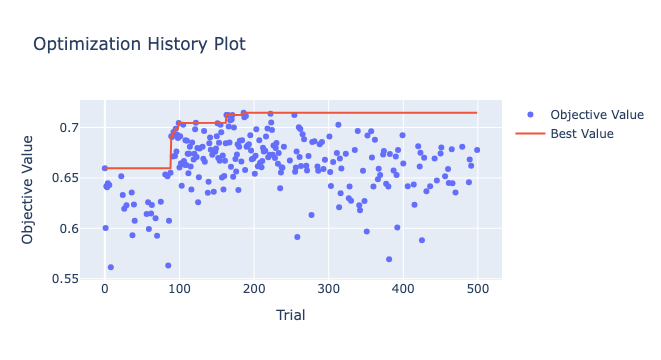

In [14]:
plot_optimization_history(study)

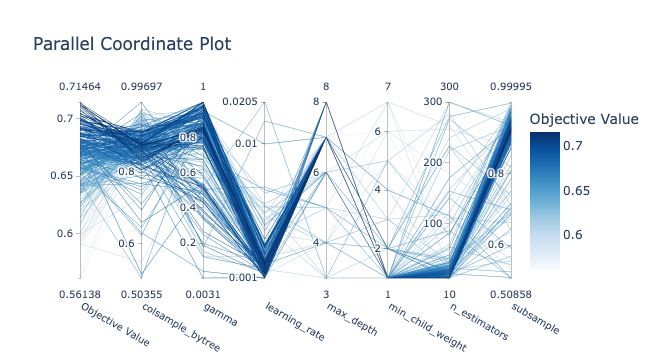

In [15]:
plot_parallel_coordinate(study)

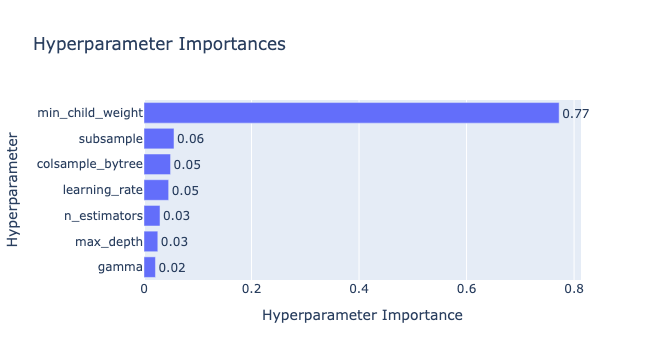

In [16]:
plot_param_importances(study)

In [17]:
study.trials_dataframe()

,number,value,datetime_start,datetime_complete,duration,params_colsample_bytree,params_gamma,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_subsample,state
0,0,0.659492,2023-11-08 15:15:41.300147,2023-11-08 15:15:41.872757,0 days 00:00:00.572610,0.623074,0.947787,0.009980,7,4,112,0.508847,COMPLETE
1,1,0.600235,2023-11-08 15:15:41.873566,2023-11-08 15:15:43.217110,0 days 00:00:01.343544,0.975897,0.458862,0.003341,5,7,261,0.691714,COMPLETE
2,2,0.641757,2023-11-08 15:15:43.217863,2023-11-08 15:15:43.568859,0 days 00:00:00.350996,0.949143,0.519120,0.020532,3,5,80,0.981968,COMPLETE
3,3,0.640853,2023-11-08 15:15:43.569546,2023-11-08 15:15:44.844261,0 days 00:00:01.274715,0.858591,0.772537,0.003446,4,2,228,0.739884,COMPLETE
4,4,0.644757,2023-11-08 15:15:44.844948,2023-11-08 15:15:45.474378,0 days 00:00:00.629430,0.957940,0.175840,0.014837,7,2,88,0.508582,COMPLETE
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,495,2.191802,2023-11-08 15:16:59.698756,2023-11-08 15:16:59.737147,0 days 00:00:00.038391,0.765585,0.999517,0.003431,7,2,10,0.970277,PRUNED
496,496,2.194034,2023-11-08 15:16:59.737623,2023-11-08 15:16:59.775843,0 days 00:00:00.038220,0.797191,0.470104,0.001865,7,1,24,0.849713,PRUNED
497,497,2.190668,2023-11-08 15:16:59.776289,2023-11-08 15:16:59.814812,0 days 00:00:00.038523,0.788020,0.802037,0.003592,5,1,16,0.925913,PRUNED
498,498,2.195140,2023-11-08 15:16:59.815260,2023-11-08 15:16:59.856846,0 days 00:00:00.041586,0.856905,0.831024,0.001269,7,1,19,0.950537,PRUNED
